##Load CSV

In [ ]:
import pandas as pd
import numpy as np
pd.set_option('display.float_format', '{:.2f}'.format) #get non scientic notation

In [ ]:
#just focus on uniswap protocol
df = pd.read_csv("/content/drive/MyDrive/Bootcamp ML/Capstone/Project_Crypto_DeFi_Clustering/data/raw/final_df_ungrouped.csv")
df = df[df["project"]=="uniswap"]
df.head()

,tx_from,tx_from_address_type,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted,project,transaction_type
0,0xb58555fcba6479fced7de1485eb054943a09af7b,EOA,585248.00,565,333885754023.44,570503.02,17,34426,19640338471.97,uniswap,swap
1,0x26ce7c1976c5eec83ea6ac22d83cb341b08850af,EOA,544010.00,1114,93413356007.42,171712.57,19,28632,4916492421.44,uniswap,swap
2,0x7aa0426f10c7603bbfb8ceb8afb8d8c329ccfe8b,EOA,225383.00,385,82797756346.90,367364.69,16,14086,5174859771.68,uniswap,swap
3,0xa6ae57b1da8238cd149bc718c40578e4620b752c,EOA,282253.00,871,75558529891.35,267697.88,19,14855,3976764731.12,uniswap,swap
4,0x52b86a86e4d764e8275391c436127e60340a0e6a,EOA,320112.00,530,67199860810.47,209926.09,16,20007,4199991300.65,uniswap,swap


In [ ]:
#for just uniswap protocol, the following columns have the same entries all the time: EOA, Uniswap, Swap -> drop these columns
df.drop(["tx_from_address_type", "transaction_type", "project"], axis =1, inplace = True)
df.reset_index(drop=True, inplace=True)

<ipython-input-3-7f54bf1ba1ad>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.drop(["tx_from_address_type", "transaction_type", "project"], axis =1, inplace = True)


In [ ]:
df.head()

,tx_from,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
0,0xb58555fcba6479fced7de1485eb054943a09af7b,585248.00,565,333885754023.44,570503.02,17,34426,19640338471.97
1,0x26ce7c1976c5eec83ea6ac22d83cb341b08850af,544010.00,1114,93413356007.42,171712.57,19,28632,4916492421.44
2,0x7aa0426f10c7603bbfb8ceb8afb8d8c329ccfe8b,225383.00,385,82797756346.90,367364.69,16,14086,5174859771.68
3,0xa6ae57b1da8238cd149bc718c40578e4620b752c,282253.00,871,75558529891.35,267697.88,19,14855,3976764731.12
4,0x52b86a86e4d764e8275391c436127e60340a0e6a,320112.00,530,67199860810.47,209926.09,16,20007,4199991300.65


##Data Preprocessing & Exploratory Data Analysis

###Inspect the original df

In [ ]:
df.head()

,tx_from,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
0,0xb58555fcba6479fced7de1485eb054943a09af7b,585248.00,565,333885754023.44,570503.02,17,34426,19640338471.97
1,0x26ce7c1976c5eec83ea6ac22d83cb341b08850af,544010.00,1114,93413356007.42,171712.57,19,28632,4916492421.44
2,0x7aa0426f10c7603bbfb8ceb8afb8d8c329ccfe8b,225383.00,385,82797756346.90,367364.69,16,14086,5174859771.68
3,0xa6ae57b1da8238cd149bc718c40578e4620b752c,282253.00,871,75558529891.35,267697.88,19,14855,3976764731.12
4,0x52b86a86e4d764e8275391c436127e60340a0e6a,320112.00,530,67199860810.47,209926.09,16,20007,4199991300.65


In [ ]:
df.shape

(396580, 8)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 396580 entries, 0 to 396579
Data columns (total 8 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   tx_from                        396580 non-null  object 
 1   tx_count                       396580 non-null  float64
 2   distinct_token_count_in_txs    396580 non-null  int64  
 3   total_usd_amount_transacted    396580 non-null  float64
 4   avg_usd_amount_transacted      396580 non-null  float64
 5   active_months                  396580 non-null  int64  
 6   monthly_txns_count             396580 non-null  int64  
 7   monthly_usd_amount_transacted  396580 non-null  float64
dtypes: float64(4), int64(3), object(1)
memory usage: 24.2+ MB


In [ ]:
df.dtypes

tx_from                           object
tx_count                         float64
distinct_token_count_in_txs        int64
total_usd_amount_transacted      float64
avg_usd_amount_transacted        float64
active_months                      int64
monthly_txns_count                 int64
monthly_usd_amount_transacted    float64
dtype: object

###Handling missing values in original df

It's generally a good idea to handle missing values before aggregating the data. This is because the method you choose to handle missing values can impact the results of the aggregation.

In [ ]:
df.isna().sum()

tx_from                          0
tx_count                         0
distinct_token_count_in_txs      0
total_usd_amount_transacted      0
avg_usd_amount_transacted        0
active_months                    0
monthly_txns_count               0
monthly_usd_amount_transacted    0
dtype: int64

In [ ]:
#Handle missing values before aggregating the data

#Calculate the mean of each column
mean_total_usd = df['total_usd_amount_transacted'].mean()
mean_avg_usd = df['avg_usd_amount_transacted'].mean()
mean_monthly_usd = df['monthly_usd_amount_transacted'].mean()

# Fill missing values with the mean
df['total_usd_amount_transacted'].fillna(mean_total_usd, inplace=True)
df['avg_usd_amount_transacted'].fillna(mean_avg_usd, inplace=True)
df['monthly_usd_amount_transacted'].fillna(mean_monthly_usd, inplace=True)

df.isna().sum()

tx_from                          0
tx_count                         0
distinct_token_count_in_txs      0
total_usd_amount_transacted      0
avg_usd_amount_transacted        0
active_months                    0
monthly_txns_count               0
monthly_usd_amount_transacted    0
dtype: int64

In [ ]:
df["tx_from"].isna().sum()

0

In [ ]:
empty_strings = (df['tx_from'] == '').sum()
whitespace_strings = (df['tx_from'].str.strip() == '').sum()

print(empty_strings)
print(whitespace_strings)

0
0


###Duplicates

In [ ]:
#duplicates for all columns
for column in df.columns:
  print("-------------------------------")
  print(f"Duplicates for Column {column}")
  duplicates = df[column].duplicated()
  print(duplicates.sum())


-------------------------------
Duplicates for Column tx_from
0
-------------------------------
Duplicates for Column tx_count
394669
-------------------------------
Duplicates for Column distinct_token_count_in_txs
396251
-------------------------------
Duplicates for Column total_usd_amount_transacted
301
-------------------------------
Duplicates for Column avg_usd_amount_transacted
313
-------------------------------
Duplicates for Column active_months
396548
-------------------------------
Duplicates for Column monthly_txns_count
395848
-------------------------------
Duplicates for Column monthly_usd_amount_transacted
303


In [ ]:
#duplicates for other rows
df.duplicated() #no rows that are the same

#duplicates for each columns and respective value counts of duplication
for column in df.columns:
  print("-------------------------------")
  print(f"Duplicates for Column {column}")
  duplicates = df[column].value_counts()>1
  print(df[column].value_counts()[duplicates])


-------------------------------
Duplicates for Column tx_from
Series([], Name: tx_from, dtype: int64)
-------------------------------
Duplicates for Column tx_count
1.00       123259
2.00        75837
3.00        33723
4.00        26915
5.00        16591
            ...  
3536.00         2
761.00          2
645.00          2
1144.00         2
1387.00         2
Name: tx_count, Length: 868, dtype: int64
-------------------------------
Duplicates for Column distinct_token_count_in_txs
1      165471
2       88284
3       42357
4       23923
5       15934
        ...  
216         2
269         2
212         2
186         2
260         2
Name: distinct_token_count_in_txs, Length: 204, dtype: int64
-------------------------------
Duplicates for Column total_usd_amount_transacted
42766.05    6
18280.00    5
34576.30    4
17760.00    4
44799.40    4
           ..
18498.34    2
20004.24    2
18834.30    2
17732.80    2
18495.10    2
Name: total_usd_amount_transacted, Length: 258, dtype: int64
-

In [ ]:
counts = df['tx_from'].value_counts()[df['tx_from'].value_counts() > 1]
print(f"we have {len(counts.index)} different addresses that appear more than once")

we have 0 different addresses that appear more than once


In [ ]:
# Print the number of unique 'tx_from' values before the groupby operation
print("total rows in tx_from ", len(df["tx_from"]))
print("unique addresses", df['tx_from'].nunique())
print("duplicated addresses", len(df) -  df['tx_from'].nunique() )

total rows in tx_from  396580
unique addresses 396580
duplicated addresses 0


###Visualizations & Summary statistics

In [ ]:
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import scipy.stats as st

print("""
Histograms: For distributions of numeric variables.
Box Plots: To check for outliers.
Pair Plots or Scatter Plots: Useful to visualize bivariate relationships. With big data sets, consider a hexbin plot or sampling data points to prevent overplotting.
Correlation Heatmaps: To check for multicollinearity or inter-variable relationships.
""")



Histograms: For distributions of numeric variables.
Box Plots: To check for outliers.
Pair Plots or Scatter Plots: Useful to visualize bivariate relationships. With big data sets, consider a hexbin plot or sampling data points to prevent overplotting.
Correlation Heatmaps: To check for multicollinearity or inter-variable relationships.



In [ ]:
#summary statistics
num_df = df.select_dtypes(exclude="object")
num_df.describe()

,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
count,396580.00,396580.00,396580.00,396580.00,396580.00,396580.00,396580.00
mean,44.45,3.55,5999736.11,67489.32,2.15,6.41,720827.66
std,2120.42,10.75,634215318.11,545518.82,2.35,155.75,45375345.74
min,1.00,0.00,17726.54,17726.54,1.00,1.00,17726.54
25%,1.00,1.00,39590.95,23318.76,1.00,1.00,34912.74
50%,2.00,2.00,98140.21,31502.94,1.00,2.00,67079.34
75%,7.00,3.00,342461.15,50504.77,2.00,3.00,165400.22
max,585248.00,1114.00,333885754023.44,172967261.45,32.00,34426.00,19640338471.97


####Visualizing numerical variables



array([[<Axes: title={'center': 'tx_count'}>,
        <Axes: title={'center': 'distinct_token_count_in_txs'}>,
        <Axes: title={'center': 'total_usd_amount_transacted'}>],
       [<Axes: title={'center': 'avg_usd_amount_transacted'}>,
        <Axes: title={'center': 'active_months'}>,
        <Axes: title={'center': 'monthly_txns_count'}>],
       [<Axes: title={'center': 'monthly_usd_amount_transacted'}>,
        <Axes: >, <Axes: >]], dtype=object)

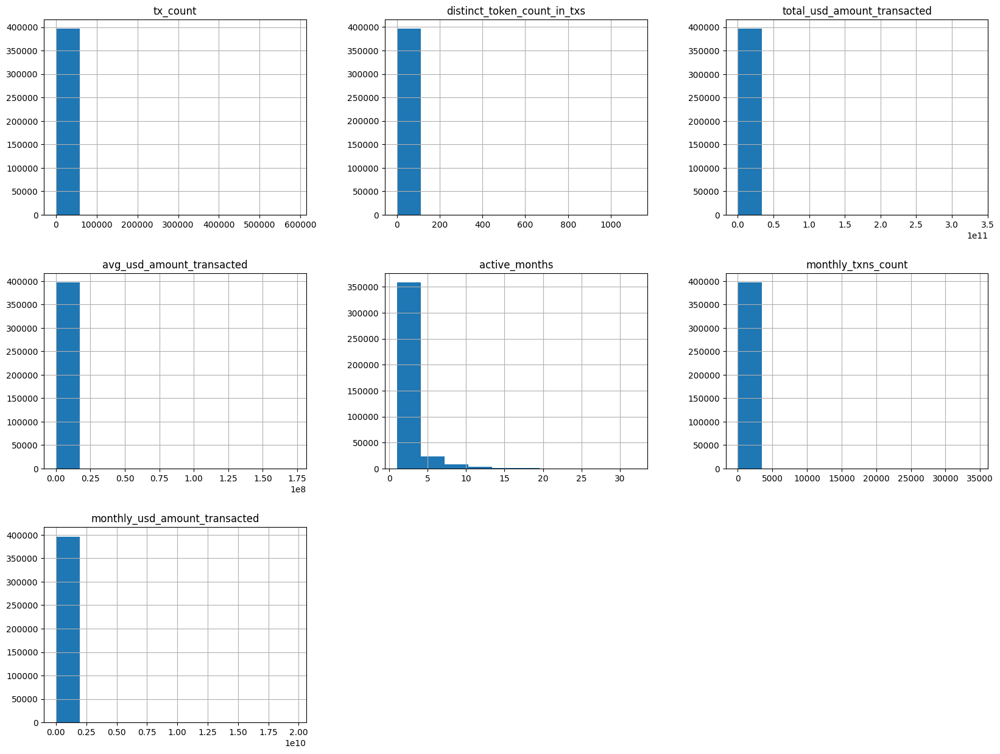

In [ ]:
df.hist(figsize=(20,15))

In [ ]:
#create a sample for visualization and computational issues
sample = df.sample(n=1000, random_state=42)

In [ ]:
sample_num = sample.select_dtypes(exclude="object")
sample_num

,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
163106,5.00,4,143608.05,28721.61,4,1,35902.01
229241,1.00,1,71974.74,71974.74,1,1,71974.74
210407,1.00,1,86691.86,86691.86,1,1,86691.86
184866,3.00,2,112007.26,37335.75,1,3,112007.26
233296,2.00,1,68994.23,34497.12,2,1,34497.12
...,...,...,...,...,...,...,...
167005,4.00,2,137290.59,34322.65,1,4,137290.59
161462,1.00,1,146510.59,146510.59,1,1,146510.59
153873,6.00,4,160133.73,26688.95,1,6,160133.73
179843,2.00,2,118622.63,59311.31,1,2,118622.63


In [ ]:
#create a sns hist plot function i.e. histogram for the numerical values of my data:
def plot_distrib(sample):
  sample_num = sample.select_dtypes(exclude="object")
  num_columns = len(sample_num.columns)
  #if odd number of columns, add 1 to better create subplots
  if num_columns%2 == 1:
    adj_num_columns = num_columns+ 1

  fig, axes = plt.subplots(2, adj_num_columns//2, figsize = (70,50))
  for i, column in enumerate(sample_num.columns):
    ax = axes[i//(adj_num_columns//2),i%(adj_num_columns//2)]
    sns.histplot(sample[column], bins = 50, kde = True, ax = ax) #need to specify ax in the sns
    ax.set_title(column)
    ax.set_xlabel(column)
    ax.set_ylabel(column)
  # If num_columns is odd, remove the last (empty) subplot
  if num_columns % 2 == 1:
    fig.delaxes(axes.flatten()[-1]) #axes instance of matplotlib.subplot is a 2d array with 2x6 grid of subplots

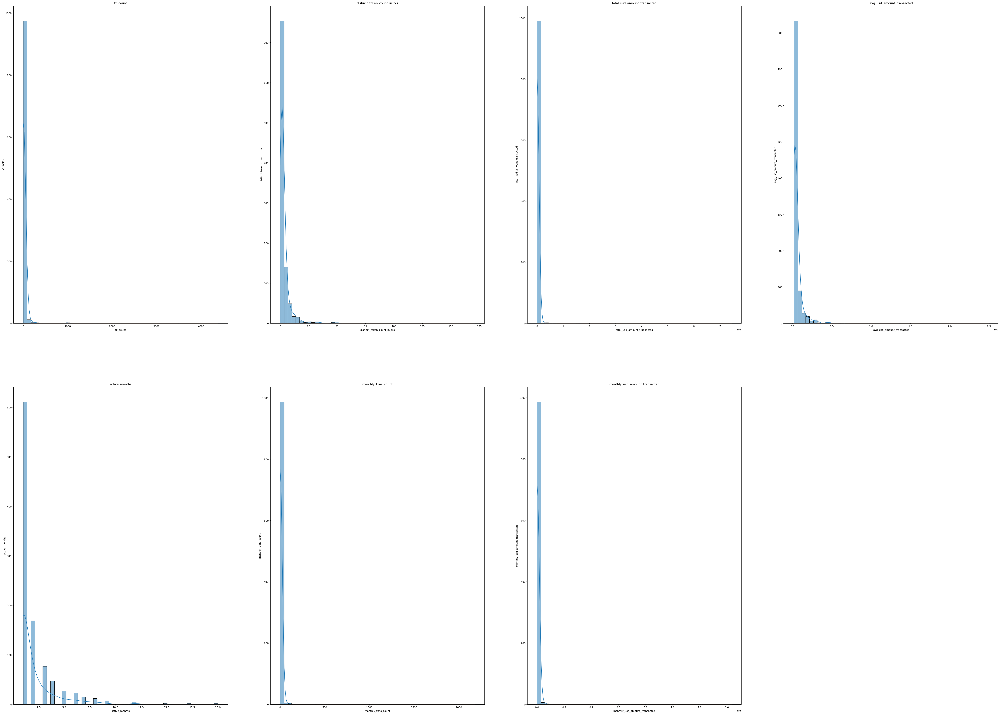

In [ ]:
plot_distrib(sample)

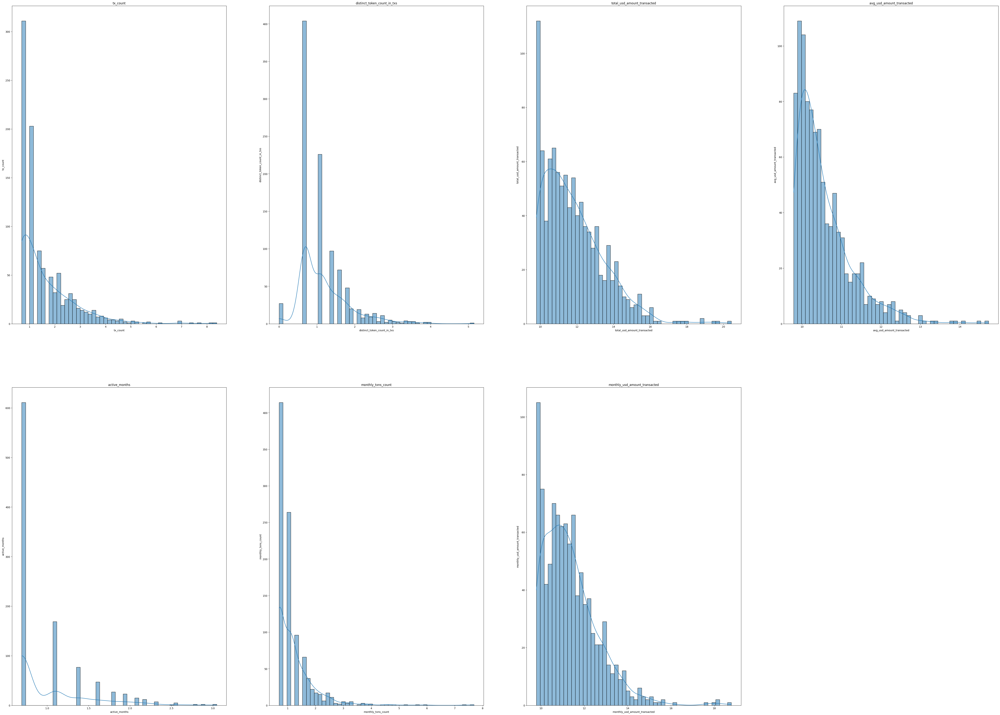

In [ ]:
#most of the numerical plots above are positively skewed.
#apply log transformation

sample_num = sample.select_dtypes(exclude="object")
sample_num_log = sample_num.apply(lambda x: np.log(x+ 1))

plot_distrib(sample_num_log)




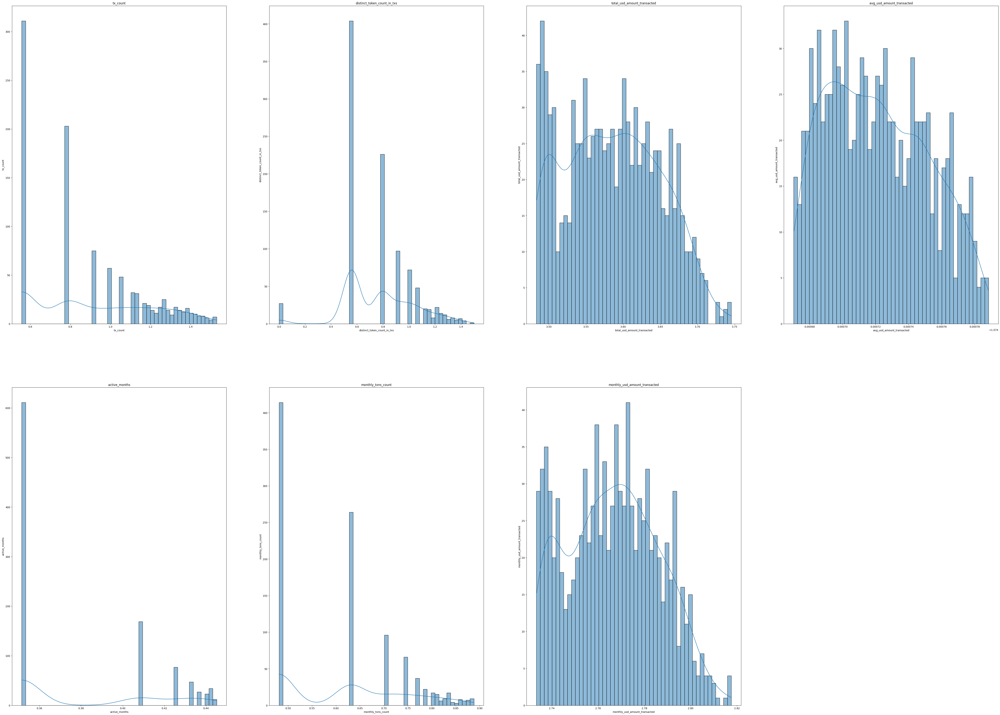

In [ ]:
#most of the numerical plots above are positively skewed.
#apply Box_Cox transformation
#data must be positive
sample_num = sample.select_dtypes(exclude="object")
# add a constant to make all values positive
sample_num_positive = sample_num - sample_num.min().min() + 1
bc_transformed_data = sample_num_positive.apply(lambda col: st.boxcox(col)[0])

plot_distrib(bc_transformed_data)

**Insights**:
* **The Box-Cox transformation seems now to be more suitable for my purpose!**
* **However, I prefer the log transformation the most as for total amount and avg amount (i.e. amount per transaction) we can see a distinction between addresses with lower, higher values, and outliers. Also, it is commonly used when dealing with financial datasets**

#### Visualizing categorical data in a barplot

Insights:
* The only categorical column "tx_from" has high cardinality. Hence, I have to engineer it to be insightful, I choose to focus on the top addresses based on average volume and/or total volume. **I choose this seperation based on an initial guess using business acumen.**
* **Remember: in our Uniswap dataset, each transaction is only initated by an EOA i.e. not by a contract! This would probably change, if we were to include flashloans from AAVE and MakerDAO (in a different project)**

#####Insights the top 20 addresses by transaction volume (total amount)

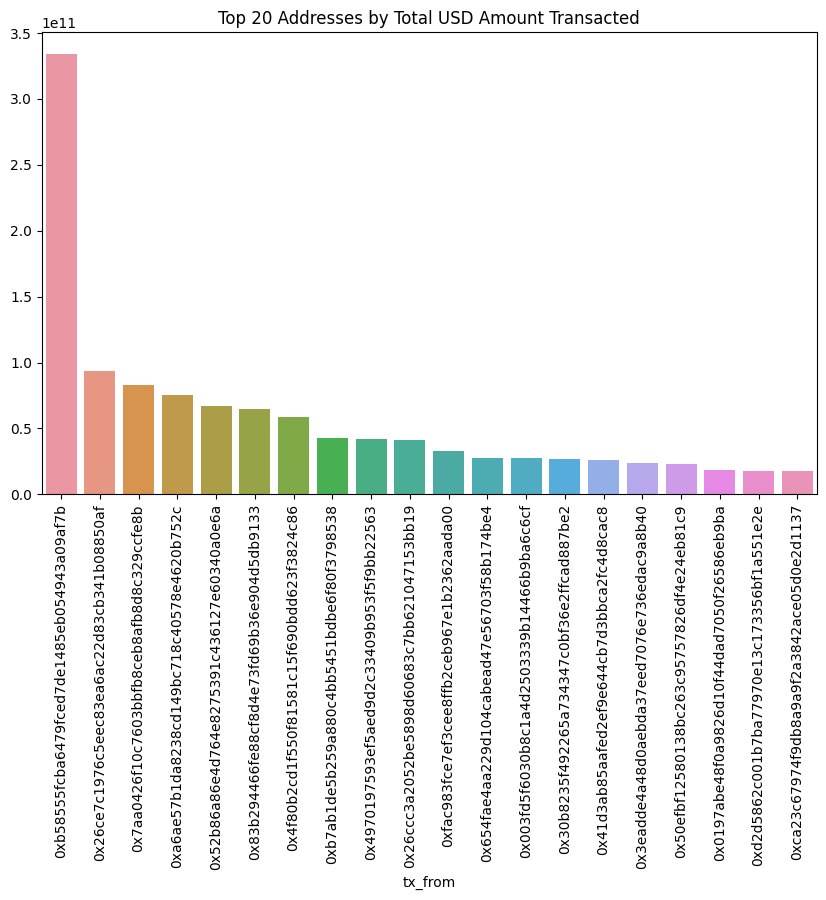

In [ ]:
top_addresses = df.groupby("tx_from")['total_usd_amount_transacted'].sum().sort_values(ascending=False).head(20)
plt.figure(figsize=(10,6))
sns.barplot(x=top_addresses.index,y= top_addresses.values)
plt.xticks(rotation=90)
plt.title('Top 20 Addresses by Total USD Amount Transacted')
plt.show()



In [ ]:
f"The top 20 addresses contribute to nearly half of the total amount transacted, precisely: {((top_addresses.sum())/(np.sum(df['total_usd_amount_transacted']))) *100}% with a total of {top_addresses.sum()/10.00**9} billions"

'The top 20 addresses contribute to nearly half of the total amount transacted, precisely: 48.01390401302173% with a total of 1142.4309942422462 billions'

In [ ]:
top_addresses

tx_from
0xb58555fcba6479fced7de1485eb054943a09af7b   333885754023.44
0x26ce7c1976c5eec83ea6ac22d83cb341b08850af    93413356007.42
0x7aa0426f10c7603bbfb8ceb8afb8d8c329ccfe8b    82797756346.90
0xa6ae57b1da8238cd149bc718c40578e4620b752c    75558529891.35
0x52b86a86e4d764e8275391c436127e60340a0e6a    67199860810.47
0x83b294466fe88cf8d4e73fd69b36e904d5db9133    64551757781.87
0x4f80b2cd1f550f81581c15f690bdd623f3824c86    58406275298.08
0xb7ab1de5b259a880c4bb5451bdbe6f80f3798538    42872237665.49
0x4970197593ef5aed9d2c33409b953f5f9bb22563    41982657339.69
0x26ccc3a2052be5898d60683c7bb621047153bb19    41096167081.68
0xfac983fce7ef3cee8ffb2ceb967e1b2362aada00    32620583541.26
0x654fae4aa229d104cabead47e56703f58b174be4    27619230184.61
0x003fd5f6030b8c1a4d2503339b14466b9ba6c6cf    27450217636.74
0x30b8235f492265a734347c0bf36e2ffcad887be2    26518616299.56
0x41d3ab85aafed2ef9e644cb7d3bbca2fc4d8cac8    25681017061.75
0x3eadde4a48d0aebda37eed7076e736edac9a8b40    23507788669.75
0x50efbf12580138

In [ ]:
df_top_20_total_amount_addresses = df[df["tx_from"].isin(top_addresses.index.tolist())]
df_top_20_total_amount_addresses

,tx_from,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
0,0xb58555fcba6479fced7de1485eb054943a09af7b,585248.00,565,333885754023.44,570503.02,17,34426,19640338471.97
1,0x26ce7c1976c5eec83ea6ac22d83cb341b08850af,544010.00,1114,93413356007.42,171712.57,19,28632,4916492421.44
2,0x7aa0426f10c7603bbfb8ceb8afb8d8c329ccfe8b,225383.00,385,82797756346.90,367364.69,16,14086,5174859771.68
3,0xa6ae57b1da8238cd149bc718c40578e4620b752c,282253.00,871,75558529891.35,267697.88,19,14855,3976764731.12
4,0x52b86a86e4d764e8275391c436127e60340a0e6a,320112.00,530,67199860810.47,209926.09,16,20007,4199991300.65
5,0x83b294466fe88cf8d4e73fd69b36e904d5db9133,67556.00,78,64551757781.87,955529.60,8,8444,8068969722.73
6,0x4f80b2cd1f550f81581c15f690bdd623f3824c86,203256.00,545,58406275298.08,287353.27,7,29036,8343753614.01
7,0xb7ab1de5b259a880c4bb5451bdbe6f80f3798538,123832.00,339,42872237665.49,346212.91,16,7739,2679514854.09
8,0x4970197593ef5aed9d2c33409b953f5f9bb22563,124158.00,571,41982657339.69,338138.96,14,8868,2998761238.55
9,0x26ccc3a2052be5898d60683c7bb621047153bb19,214409.00,636,41096167081.68,191671.84,17,12612,2417421593.04


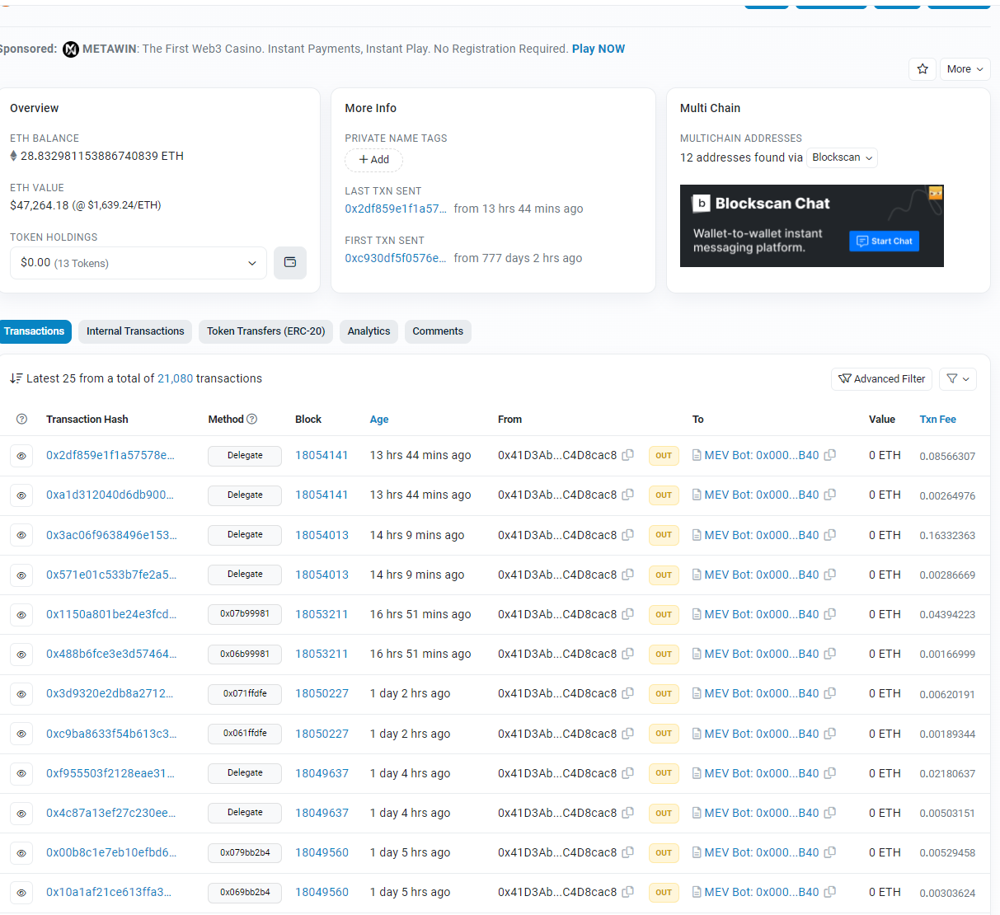

**Insights in total amount of top addresses**


* The 16 biggest ones are all addresses that are ALL engaging with MEV bots to extract value according to snapshots on Etherscan

* **We can assume that there could be a cluster for addresses with high total values that are mostly engaged with (MEV) bots**




#####Insights the top 20 addresses by average volume (average usd amount transacted)

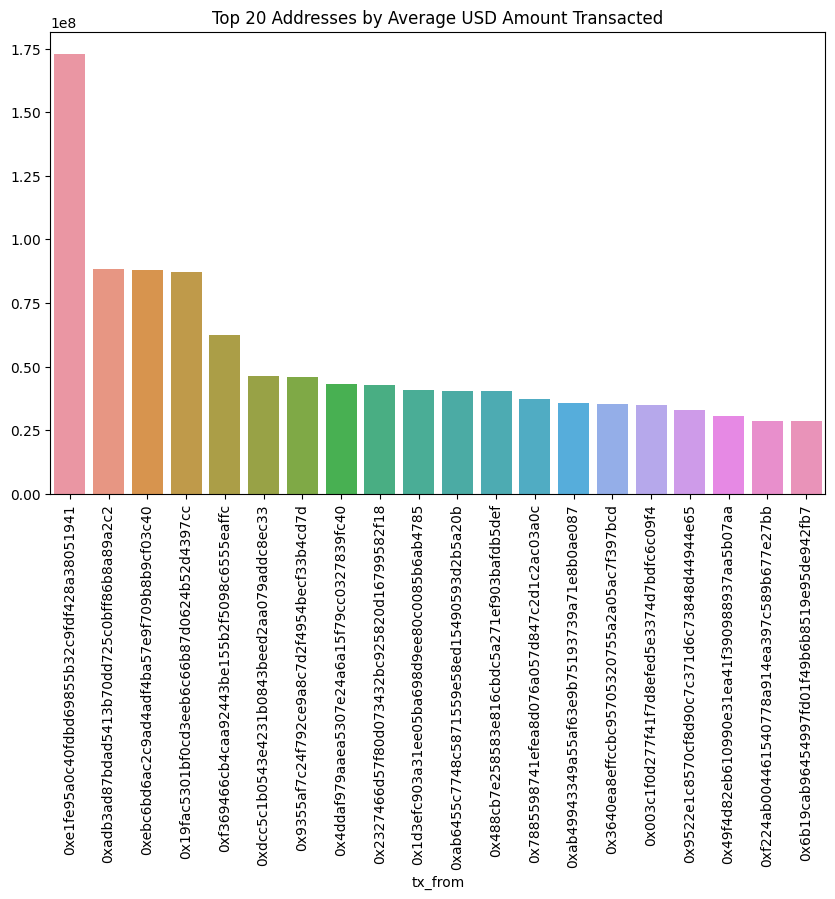

In [ ]:
#Average Volume measured as value per transaction by Address -> I'm interested, which addresses had the highest average value per transaction (total value divided by amount of transactions)

top_avg_addresses = df.groupby('tx_from')['avg_usd_amount_transacted'].max().sort_values(ascending=False).head(20) #after grouping per addresses I decided to get the highest (max) value instead of the mean of the mean -> to be discussed
plt.figure(figsize=(10, 6))
sns.barplot(x=top_avg_addresses.index, y=top_avg_addresses.values)
plt.xticks(rotation=90)
plt.title('Top 20 Addresses by Average USD Amount Transacted')
plt.show()



In [ ]:
top_avg_addresses

tx_from
0xe1fe95a0c40fdbd69855b32c9fdf428a38051941   172967261.45
0xadb3ad87bdad5413b70dd725c0bff86b8a89a2c2    88417497.27
0xebc6bd6ac2c9ad4adf4ba57e9f709b8b9cf03c40    87967048.53
0x19fac5301bf0cd3eeb6c66b87d0624b52d4397cc    87090039.60
0xf369466cb4caa92443be155b2f5098c6555eaffc    62453261.94
0xdcc5c1b0543e4231b0843beed2aa079addc8ec33    46408627.56
0x9355af7c24f792ce9a8c7d2f4954becf33b4cd7d    45937250.63
0x4ddaf979aaea5307e24a6a15f79cc0327839fc40    43038269.40
0x2327466d57f80d073432bc925820d16799582f18    42692577.05
0x1d3efc903a31ee05ba698d9ee80c0085b6ab4785    40675065.78
0xab6455c7748c5871559e58ed15490593d2b5a20b    40524000.00
0x488cb7e258583e816cbdc5a271ef903bafdb5def    40390367.42
0x7885598741efea8d076a057d847c2d1c2ac03a0c    37316628.98
0xab49943349a55af63e9b75193739a71e8b0ae087    35812317.34
0x3640ea8effccbc95705320755a2a05ac7f397bcd    35134229.90
0x003c1f0d277f41f7d8efed5e3374d7bdfc6c09f4    35079296.92
0x9522e1c8570cf8d90c7c371d6c73848d44944e65    32762941.19
0x49f4

In [ ]:
#IMPORTANT: this df is the same as the one we created below as we do not have any address duplicates in just one protocol
df_top_20_avg_addresses = df[df["tx_from"].isin(top_avg_addresses.index.tolist())]
df_top_20_avg_addresses

,tx_from,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
56,0x19fac5301bf0cd3eeb6c66b87d0624b52d4397cc,58.00,0,5051222296.73,87090039.60,5,11,1010244459.35
146,0xf224ab004461540778a914ea397c589b677e27bb,64.00,3,1821887988.88,28466999.83,1,64,1821887988.88
362,0xebc6bd6ac2c9ad4adf4ba57e9f709b8b9cf03c40,5.00,3,439835242.67,87967048.53,1,5,439835242.67
484,0x488cb7e258583e816cbdc5a271ef903bafdb5def,8.00,0,323122939.35,40390367.42,1,8,323122939.35
837,0xadb3ad87bdad5413b70dd725c0bff86b8a89a2c2,2.00,1,176834994.54,88417497.27,1,2,176834994.54
844,0xe1fe95a0c40fdbd69855b32c9fdf428a38051941,1.00,0,172967261.45,172967261.45,1,1,172967261.45
1103,0x6b19cab96454997fd01f49b6b8519e95de942fb7,4.00,1,113802170.96,28450542.74,2,2,56901085.48
1261,0x49f4d82eb610990e31ea41f390988937aa5b07aa,3.00,2,91291026.58,30430342.19,2,1,45645513.29
1389,0x1d3efc903a31ee05ba698d9ee80c0085b6ab4785,2.00,1,81350131.57,40675065.78,1,2,81350131.57
1480,0x7885598741efea8d076a057d847c2d1c2ac03a0c,2.00,1,74633257.96,37316628.98,1,2,74633257.96


In [ ]:
shared_addresses = top_avg_addresses.index.isin(top_addresses.index.tolist())
#np.argindex(shared_addresses == True)
indices = np.where(top_avg_addresses.index.isin(top_addresses.index.tolist()))
indices[0]
shared_addresses

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False])

**Insights highest amount per transaction (avg amount)**

* no common addresses shared between the addresses with the highest total values and the highest avg values. This could indicate a cluster for each of the two!
* randomly checking on etherscan, these transactions were valid ones, yet unlabeled. Hence, further drill down in these transactions would be interesting, but thats for another project.




###Relationships between the features:
* Between numerical features, use scatter plots, pair plots and check for correlation
* (Between selected categorical and numerical features, use violin plots) -> Use this later on when we have identified the most important categorical,numerical feature pairs

####Pairplots

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:2095: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


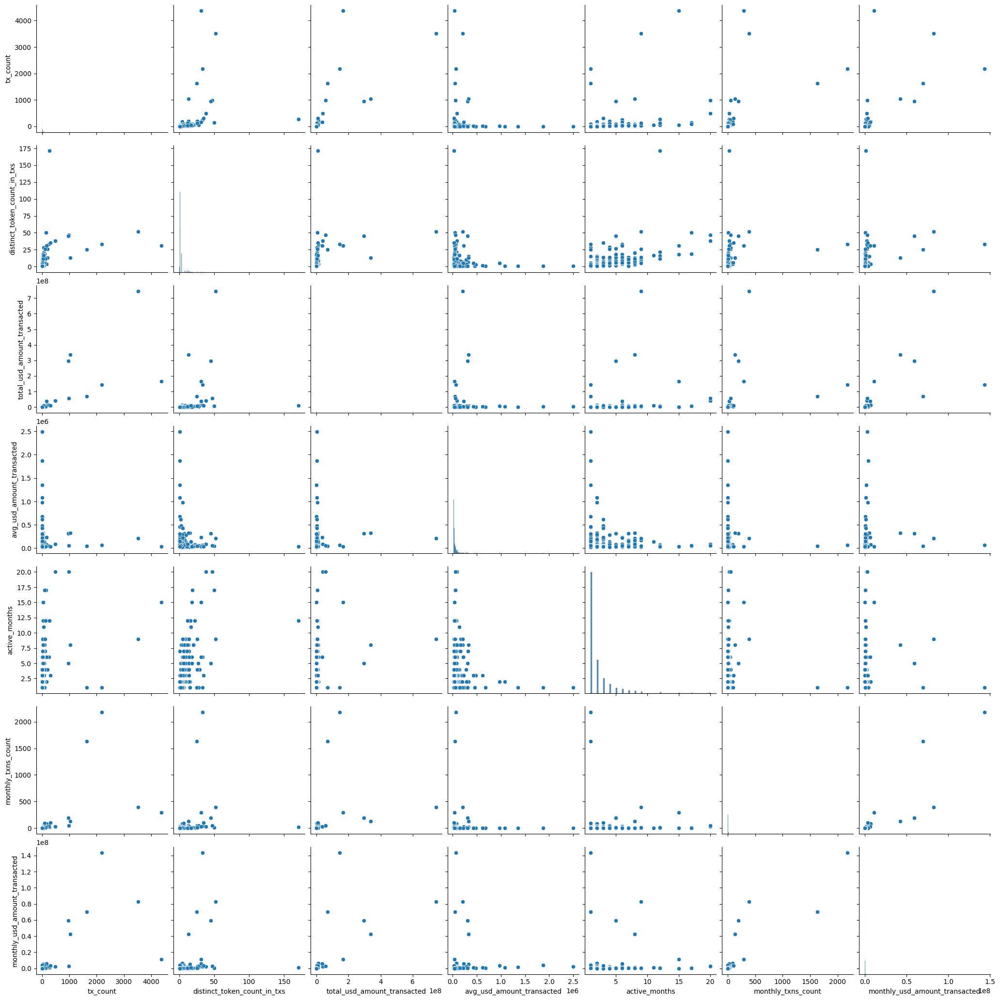

In [ ]:
sns.pairplot(sample, size=3)

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:2095: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


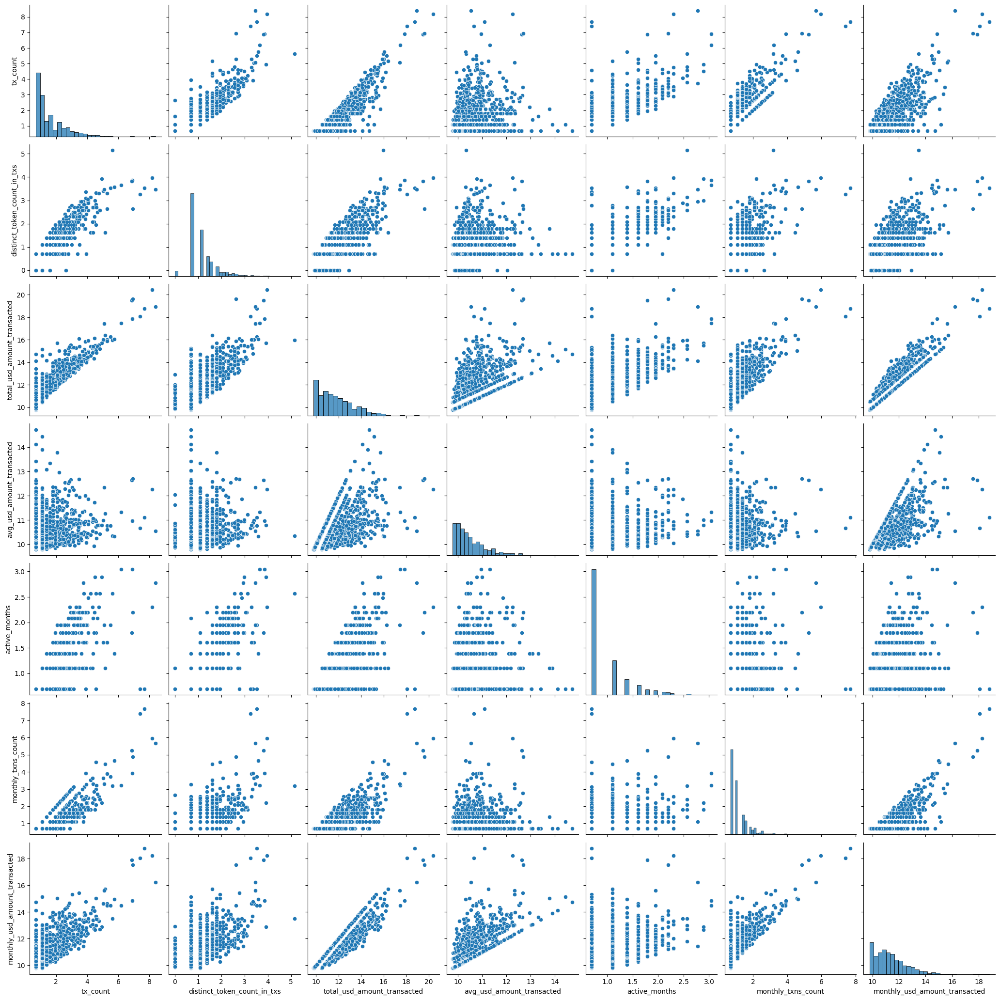

In [ ]:
# use the log transformation to read better into the visualization
sns.pairplot(sample_num_log, size=3)

####Correlation (linear relationship between variables)

<ipython-input-44-c21f908378c8>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


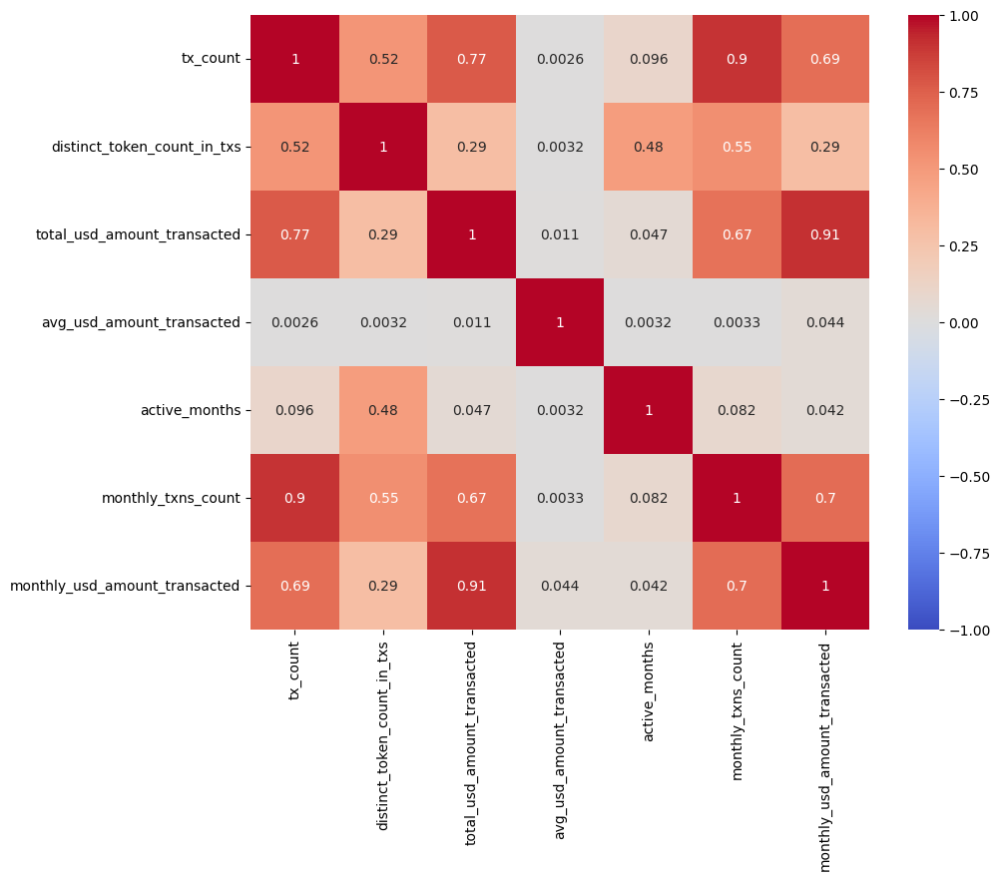

In [ ]:
corr_matrix = df.corr()
plt.figure(figsize=(10,8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.show()


Insights on linear relationship:
* As expected we have high correlation between features and their monthly breakdowns such as (tx_count, monthly_txns_count), (total_usd_amount, monthly usd_amount)
* **Low correlation between average usd amount and the other features which shows that we should look into this pattern, as it highlights a seperate cluster with high average values i.e. large transaction amounts regardless of token traded. I form the hypothesis that this could be a seasoned (not retail)trader and/or whale**
* **Also interesting that we have a quite linear relationship between total usd amount and tx count suggesting that the higher the total usd amount the more transaction is executed**. This does not to be straightforward as there are different trader types that could act differently. This suggests that most traders fall into a type that transacts a lot and with each transaction we do not have very high transactions values, solidifying my hypothesis for a "bot" cluster.


###Rename the inspected df to respresent the baseline analysis of Uniswap traders and save to CSV

In [ ]:
#Via deepcopy I ensure that my original DataFrame (df) remains unchanged as I proceed with further data manipulations on df_uniswap_baseline
df_uniswap_baseline = df.copy(deep=True)

In [ ]:
df_uniswap_baseline.to_csv('/content/drive/My Drive/Bootcamp ML/Capstone/df_uniswap_baseline.csv')

In [ ]:
df_uniswap_baseline.head()

,tx_from,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
0,0xb58555fcba6479fced7de1485eb054943a09af7b,585248.00,565,333885754023.44,570503.02,17,34426,19640338471.97
1,0x26ce7c1976c5eec83ea6ac22d83cb341b08850af,544010.00,1114,93413356007.42,171712.57,19,28632,4916492421.44
2,0x7aa0426f10c7603bbfb8ceb8afb8d8c329ccfe8b,225383.00,385,82797756346.90,367364.69,16,14086,5174859771.68
3,0xa6ae57b1da8238cd149bc718c40578e4620b752c,282253.00,871,75558529891.35,267697.88,19,14855,3976764731.12
4,0x52b86a86e4d764e8275391c436127e60340a0e6a,320112.00,530,67199860810.47,209926.09,16,20007,4199991300.65


In [ ]:
df_uniswap_baseline.shape

(396580, 8)

In [ ]:
df_uniswap_baseline.index.values

array([     0,      1,      2, ..., 396577, 396578, 396579])

In [ ]:
df_uniswap_baseline.iloc[0:396580].index

RangeIndex(start=0, stop=396580, step=1)

In [ ]:
#for modelling purposes
# Exclude the 'tx_from' column for clustering
X = df_uniswap_baseline.drop('tx_from', axis=1)
X.head()

,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
0,585248.00,565,333885754023.44,570503.02,17,34426,19640338471.97
1,544010.00,1114,93413356007.42,171712.57,19,28632,4916492421.44
2,225383.00,385,82797756346.90,367364.69,16,14086,5174859771.68
3,282253.00,871,75558529891.35,267697.88,19,14855,3976764731.12
4,320112.00,530,67199860810.47,209926.09,16,20007,4199991300.65


In [ ]:
X.shape

(396580, 7)

In [ ]:
X.iloc[0:100].index

RangeIndex(start=0, stop=100, step=1)

###PCA
Within this section, I delve into identifying the principal components that account for the majority of variance in my dataset. I aim to understand the underlying structure of the data by determining the linear combinations of original features that best capture its inherent variability. Additionally, I will analyze the contribution of each original feature to these principal components, revealing the most influential features in my dataset.

#####Optimal number of principal components

In [ ]:
#import PCA
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

pca_pipe = Pipeline([("sclaer", StandardScaler()),("pca", PCA())])

X_pca = pca_pipe.fit_transform(X)

cum_sum_explained_variance_ratio_pca = np.cumsum(pca_pipe.named_steps["pca"].explained_variance_ratio_)

cum_sum_explained_variance_ratio_pca

array([0.51653967, 0.70489042, 0.84794439, 0.93374226, 0.9741504 ,
       0.99440683, 1.        ])

In [ ]:
#index in the cumsum array (above) that explains more than 95% of variance, used
location_ncomp = np.argmax(cum_sum_explained_variance_ratio_pca > 0.95) #In case of multiple occurrences of the maximum values, the indices corresponding to the first occurrence are returned. First True value is the max value.
location_ncomp

4

In [ ]:
cum_sum_explained_variance_ratio_pca[4]

0.9741504010208808

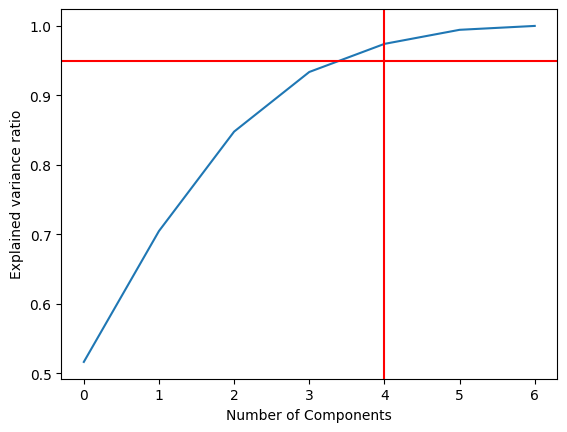

In [ ]:
plt.plot(cum_sum_explained_variance_ratio_pca)
plt.xlabel("Number of Components")
plt.ylabel("Explained variance ratio")
plt.axvline(x=location_ncomp, color = "red")
plt.axhline(y=0.95, color = "red")

#####Contribution of each of the original features to the four principal components

                               PC1   PC2   PC3   PC4   PC5   PC6   PC7
tx_count                      0.49  0.05 -0.03 -0.25 -0.43 -0.49  0.52
distinct_token_count_in_txs   0.32 -0.56  0.00 -0.42  0.63 -0.09  0.00
total_usd_amount_transacted   0.46  0.24 -0.01  0.40  0.18 -0.47 -0.56
avg_usd_amount_transacted     0.01  0.03  1.00 -0.05 -0.02 -0.02 -0.02
active_months                 0.11 -0.75  0.04  0.54 -0.35  0.05 -0.01
monthly_txns_count            0.48  0.02 -0.03 -0.37 -0.38  0.54 -0.44
monthly_usd_amount_transacted 0.45  0.24  0.03  0.41  0.32  0.48  0.48


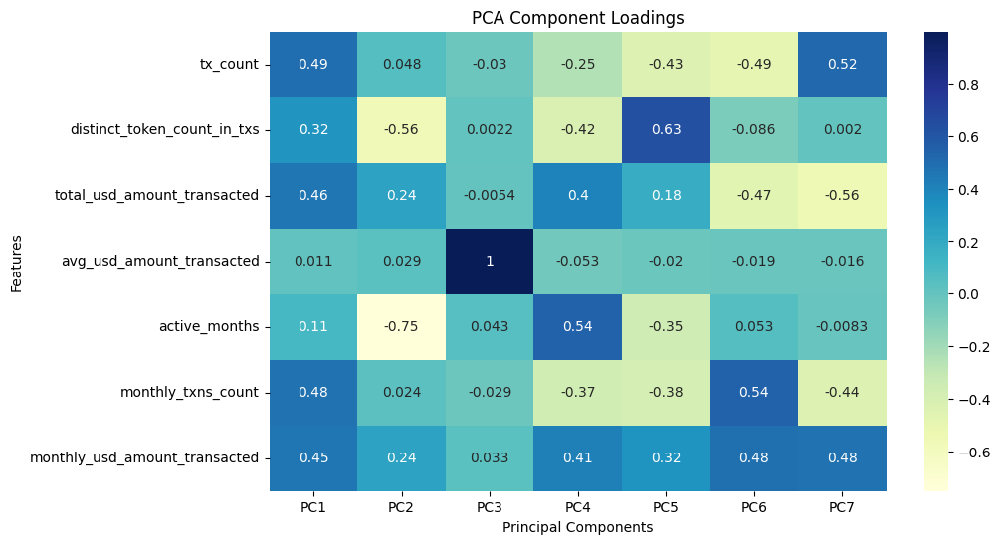

In [ ]:

pca = pca_pipe.named_steps['pca']

# PCA loadings (the principal axes in feature space, representing the directions of maximum variance)
loadings = pca.components_
feature_names = X.columns

# Create a DataFrame for better readability of the loadings
loadings_df = pd.DataFrame(data=loadings.T, columns=[f'PC{i+1}' for i in range(loadings.shape[0])], index=feature_names)

# Display the loading scores for the first few principal components
print(loadings_df)

# Visualize the contribution of each feature to each principal component as a heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(loadings_df, cmap="YlGnBu", annot=True)
plt.title('PCA Component Loadings')
plt.xlabel('Principal Components')
plt.ylabel('Features')
plt.show()

In [ ]:
# Print the features with the highest absolute loading values for the first principal component
print("Features with the highest loadings for PC1:")
print(loadings_df['PC1'].abs().sort_values(ascending=False).head())

#  Print the features with the highest absolute loading values for the second principal component
print("Features with the highest loadings for PC2:")
print(loadings_df['PC2'].abs().sort_values(ascending=False).head())

# Print the features with the highest absolute loading values for the third principal component
print("Features with the highest loadings for PC3:")
print(loadings_df['PC3'].abs().sort_values(ascending=False).head())

#  Print the features with the highest absolute loading values for the fourth principal component
print("Features with the highest loadings for PC4:")
print(loadings_df['PC4'].abs().sort_values(ascending=False).head())

Features with the highest loadings for PC1:
tx_count                        0.49
monthly_txns_count              0.48
total_usd_amount_transacted     0.46
monthly_usd_amount_transacted   0.45
distinct_token_count_in_txs     0.32
Name: PC1, dtype: float64
Features with the highest loadings for PC2:
active_months                   0.75
distinct_token_count_in_txs     0.56
monthly_usd_amount_transacted   0.24
total_usd_amount_transacted     0.24
tx_count                        0.05
Name: PC2, dtype: float64
Features with the highest loadings for PC3:
avg_usd_amount_transacted       1.00
active_months                   0.04
monthly_usd_amount_transacted   0.03
tx_count                        0.03
monthly_txns_count              0.03
Name: PC3, dtype: float64
Features with the highest loadings for PC4:
active_months                   0.54
distinct_token_count_in_txs     0.42
monthly_usd_amount_transacted   0.41
total_usd_amount_transacted     0.40
monthly_txns_count              0.37
Name: 

**Interpretation from PCA Component Loading**

The loadings of a principal component **define how much each feature contributes to the direction of the component**. In the context of PCA, **a loading is essentially the correlation between the original variable and the component**.

*   PC1 appears to be a measure of transaction volume and amount transacted. It has significant positive loadings on tx_count, monthly_txns_count, total_usd_amount_transacted, and monthly_usd_amount_transacted, which suggests that this component represents **overall activity in terms of both count and amount**.

*   **PC2 is heavily influenced by active_months, which indicates a measure of the length of activity or engagement time**.
The second-largest loading is distinct_token_count_in_txs, suggesting that this component also captures the diversity of tokens in transactions.

* **PC3 is dominated by avg_usd_amount_transacted with a loading of 1.00, indicating that this component almost exclusively measures the average transaction amount. This might reflect the size or quality of transactions.**

* PC4 seems to be a mix of engagement time (active_months), diversity of tokens (distinct_token_count_in_txs), and amounts transacted (monthly_usd_amount_transacted and total_usd_amount_transacted).

In summary, these principal components each seem to capture different facets of the underlying data:

* PC1 might be thought of as an **"activity volume"** component.
* PC2 could be seen as a **"longevity and diversity"** component.
* PC3 appears to be an **"average transaction value"** component.
* PC4 might be a **"balanced behavior"** component that blends aspects of time, diversity, and amount.







#####**Final Insights / So What of PCA**

* PC1 - "Activity Volume": This component suggests that there's a group of addresses characterized by high transaction counts and total amounts transacted. This might indicate active traders or possibly automated trading bots - MEV bots - that execute many transactions. **This aligns with my identification of a cluster with high total amounts transacted but low averages, which could represent frequent, smaller trades**.

* PC2 - "Longevity and Diversity": Addresses with high scores on this component are likely long-term participants on Uniswap that engage with a diverse set of tokens. **This might correspond to sophisticated retail traders who are not only active but also diversified in their trading strategies.**

* PC3 - "Average Transaction Value": This component isolates the average transaction amount as a defining characteristic. High scores here would identify traders or addresses that, on average, transact in larger amounts, which may correspond to institutional traders or whales. **This supports my identification of a distinct cluster of top traders based on average amount transacted**.

* PC4 - "Balanced Behavior": This component reflects a mix of behavior that might represent more retail-oriented traders with consistent engagement and diverse activities but not necessarily high in transaction volume or value.

Supporting Cluster Selection:

The insights from these components do seem to support my inital cluster selection:

* The first component supports the decision to focus on a subset that's actively trading in volume, e.g. **bots**.

* The second component supports the idea of a **more sophisticated and possibly long-term retail group**.

* The third component validates the separation of those who trade large values on average, e.g. **sophisticated, non-retail traders like whales etc.**.

* The fourth component would be **non professional/less seasoned retail traders.**



*Limitations of PCA and Implications for Further Analysis:*

*PCA is a linear method, so it assumes a linear relationship among features. It won't capture complex, nonlinear patterns that might be present in trading behaviors.*
*PCA is sensitive to scale, so if features are on different scales and not standardized, the components may be skewed towards high-variance features.*

***PCA reduces dimensionality based on variance, not necessarily on the features that are the most predictive or that have the most business value.***

### **Current Insights from EDA**

* The seperation between different trader types based on average amount transacted and total amount transacted persists in my EDA and PCA analysis (bots vs. whales).
* Through PCA I learnt the possibility that other columns, namely tx_count, active months, distinct_token_count_in_txs are worth looking into.
* Through PCA I learnt about the existence of a a third cluster made up of more engaged, maybe more sophisticated, long-term retail traders as well as a fourth cluster made up of less sophisticated retail group.
* The column tx_count contributes to the cluster of traders heavily influenced by total_amount i.e. "bots"
* The columns active_months and distinct_token_count_in_txs seem to be more relevant in the distinction between more seasoned retail traders and amateur retail traders

###KMeans

Run KMeans to test and identify these four clusters as identified through the EDA and PCA so far.

In [ ]:
#import necessary libs for clustering
from sklearn.cluster import KMeans

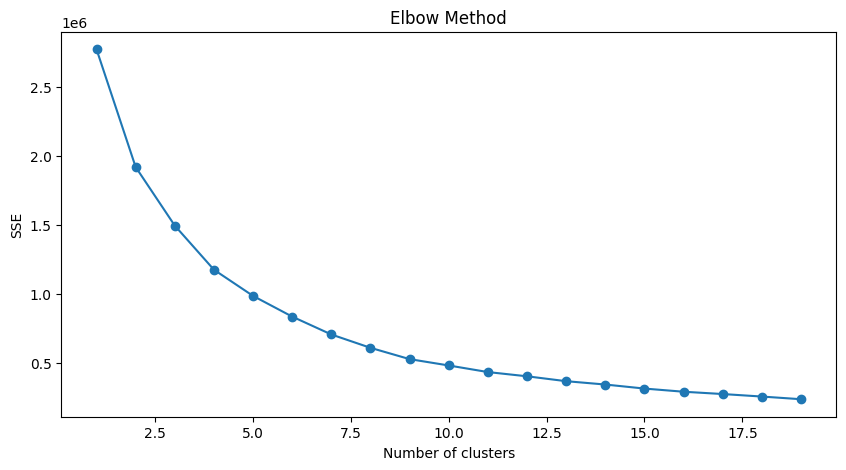

In [ ]:
#ignore silhouette score for now as its too computationally expensive for the large data set

r_seed = 23 # random seed to use during modeling for reproducability purposes


# List to hold the SSE for each number of clusters
sse = []
# Iterate over possible number of clusters
for k in range(1, 20):
    # Set the number of clusters
    n_clusters = k
    kmeans_pipeline = Pipeline([("scaler", StandardScaler()),("cluster", KMeans(n_clusters = n_clusters, random_state = r_seed,n_init=10))])
    # Fit the data
    kmeans_pipeline.fit(X)
    cluster_labels = kmeans_pipeline.predict(X)
    # Append the SSE for k clusters to sse list
    sse.append(kmeans_pipeline.named_steps["cluster"].inertia_)

# Plot the SSE for each number of clusters
plt.figure(figsize=(10, 5))
plt.plot(range(1, 20), sse, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('SSE')
plt.title('Elbow Method')
plt.show()

**Selection of amount of clusters to work with "k"**


*   After cluster 5, the descend is less steep. We select 5 clusters
*   Note that the ellbow plot is not really an ellbow, but 5 clusters seem valid, as we discuss in our cluster validation part (see part below)

In [ ]:
#cluster my data
kmeans_pipeline = Pipeline([("scaler", StandardScaler()),("cluster", KMeans(n_clusters = 5, random_state = 42, n_init=10))]) # change this first
# Fit the data
kmeans_pipeline.fit(X)
cluster_labels = kmeans_pipeline.predict(X)

df_uniswap_baseline["cluster_labels"] = cluster_labels
df_uniswap_baseline_sorted_desc = df_uniswap_baseline.sort_values(by="total_usd_amount_transacted", ascending = False)
df_uniswap_baseline_sorted_desc.head()

,tx_from,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted,cluster_labels
0,0xb58555fcba6479fced7de1485eb054943a09af7b,585248.00,565,333885754023.44,570503.02,17,34426,19640338471.97,3
1,0x26ce7c1976c5eec83ea6ac22d83cb341b08850af,544010.00,1114,93413356007.42,171712.57,19,28632,4916492421.44,1
2,0x7aa0426f10c7603bbfb8ceb8afb8d8c329ccfe8b,225383.00,385,82797756346.90,367364.69,16,14086,5174859771.68,1
3,0xa6ae57b1da8238cd149bc718c40578e4620b752c,282253.00,871,75558529891.35,267697.88,19,14855,3976764731.12,1
4,0x52b86a86e4d764e8275391c436127e60340a0e6a,320112.00,530,67199860810.47,209926.09,16,20007,4199991300.65,1


**In my visualization of the clusters, I focus on the features highlighted in my EDA and PCA analysis:**
* Potential Cluster "Bots": high values of tx_count & total_amount
* Potential Cluster "long-term, engaged actors": highly influenced by active_months, followed by distinct_token_count_in_txs
* Potential Cluster "seasoned traders/whales": high average_amount i.e. trade larger amounts on average
* (Potential Cluster "Retail": balancing influence via active_months, distinct_token_count_in_txs & total_amount)

In [ ]:
from matplotlib.colors import Normalize # to ensure consistent coloring in plots

n_clusters = df_uniswap_baseline['cluster_labels'].nunique()
# Create a normalization object that maps your cluster labels to the [0, 1] interval as part of ensuring consistent coloring in scatter plots
norm = Normalize(vmin=0, vmax=n_clusters - 1)# to ensure consistent coloring in plots

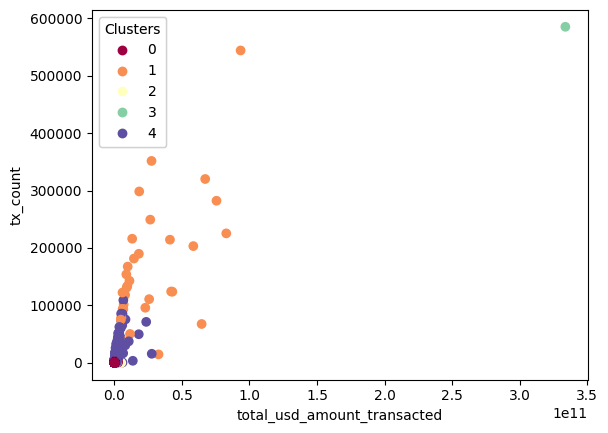

In [ ]:
# potential cluster bots -> Cluster 1 in legend below (orange color)
# potential Cluster long-term - > Cluster 4 in legend below (violett color)
#interesting below is that the cluster 2 i.e. our high average do not really have many transactions i.e. it fortifies the whale hypothesis
scatter = plt.scatter(
    df_uniswap_baseline.iloc[:, 3],
    df_uniswap_baseline.iloc[:, 1],
    c=df_uniswap_baseline['cluster_labels'],
    cmap=plt.cm.Spectral,
    norm = norm
)

# Create the legend
legend1 = plt.legend(*scatter.legend_elements(), title="Clusters")
plt.gca().add_artist(legend1)

# Set the x-label and display the plot
plt.xlabel(df_uniswap_baseline.iloc[:, 3].name)
plt.ylabel(df_uniswap_baseline.iloc[:, 1].name)
plt.show()

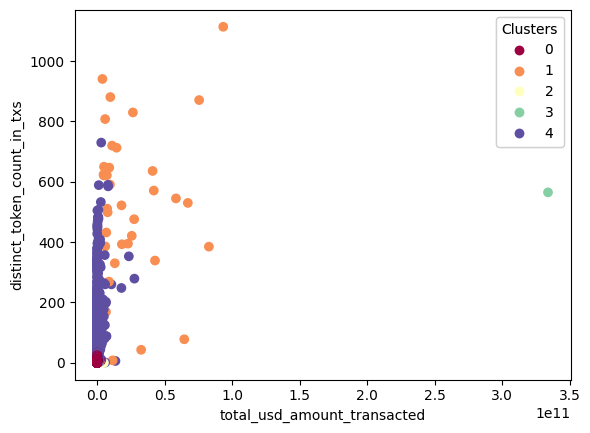

In [ ]:
# potential cluster bots -> Cluster 1 in legend below (orange color); interesting to see that we have less linear trend between total amount and distinct token count as compared to tx_count
# i.e. higher total amounts and more transaction account does not necessarily mean more distinct tokens being traded
# potential Cluster long-term - > Cluster 4 in legend below (violett color)
# cluster 2 i.e. our high average/whales traders again are not really active, supporting the hypothesis that they could be whales
scatter = plt.scatter(
    df_uniswap_baseline.iloc[:, 3],
    df_uniswap_baseline.iloc[:, 2],
    c=df_uniswap_baseline['cluster_labels'],
    cmap=plt.cm.Spectral,
    norm = norm
)

# Create the legend
legend1 = plt.legend(*scatter.legend_elements(), title="Clusters")
plt.gca().add_artist(legend1)

# Set the x-label and display the plot
plt.xlabel(df_uniswap_baseline.iloc[:, 3].name)
plt.ylabel(df_uniswap_baseline.iloc[:, 2].name)
plt.show()

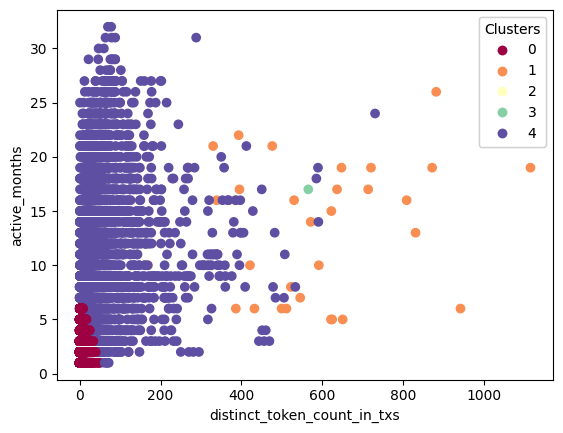

In [ ]:
# potential Cluster long-term - > Cluster 4 in legend below (violett color)
# cluster 2 i.e. our high average/whales traders again are not really active, supporting the hypothesis that they could be whales

# Create the scatter plot
scatter = plt.scatter(
    df_uniswap_baseline.iloc[:, 2],
    df_uniswap_baseline.iloc[:, 5],
    c=df_uniswap_baseline['cluster_labels'],
    cmap=plt.cm.Spectral,
    norm = norm #ensuring consistent coloring in scatterplots
)

# Create the legend
legend1 = plt.legend(*scatter.legend_elements(), title="Clusters")
plt.gca().add_artist(legend1)

# Set the x-label and display the plot
plt.xlabel(df_uniswap_baseline.iloc[:, 2].name)
plt.ylabel(df_uniswap_baseline.iloc[:, 5].name)
plt.show()


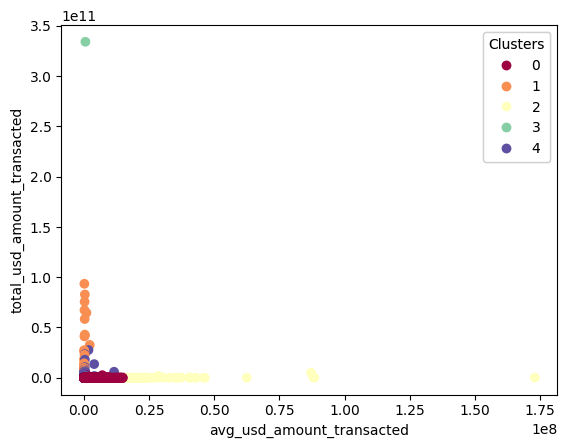

In [ ]:
# potential Cluster high-average - > Cluster 2 in legend below (yellow color)
scatter = plt.scatter(
    df_uniswap_baseline.iloc[:,4],
    df_uniswap_baseline.iloc[:, 3],
    c=df_uniswap_baseline['cluster_labels'],
    cmap=plt.cm.Spectral,
    norm = norm
)

# Create the legend
legend1 = plt.legend(*scatter.legend_elements(), title="Clusters")
plt.gca().add_artist(legend1)

# Set the x-label and display the plot
plt.xlabel(df_uniswap_baseline.iloc[:, 4].name)
plt.ylabel(df_uniswap_baseline.iloc[:, 3].name)
plt.show()

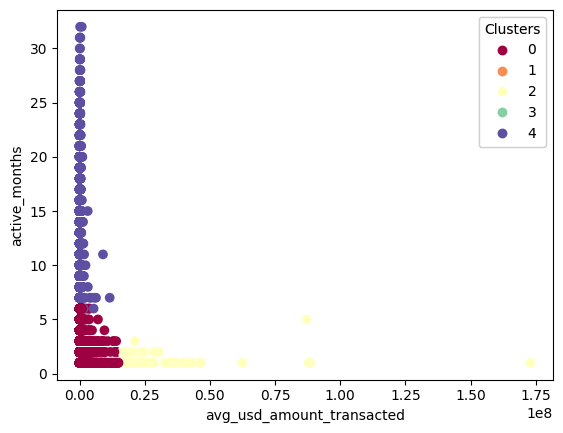

In [ ]:
# how are these average ones engaged? Not really engaged, certainly not as much as cluster 4 i.e. our "engaged, long term ones"
# potential Cluster high-average - > Cluster 2 in legend below (yellow color)
scatter = plt.scatter(
    df_uniswap_baseline.iloc[:,4],
    df_uniswap_baseline.iloc[:, 5],
    c=df_uniswap_baseline['cluster_labels'],
    cmap=plt.cm.Spectral,
    norm = norm
)

# Create the legend
legend1 = plt.legend(*scatter.legend_elements(), title="Clusters")
plt.gca().add_artist(legend1)

# Set the x-label and display the plot
plt.xlabel(df_uniswap_baseline.iloc[:, 4].name)
plt.ylabel(df_uniswap_baseline.iloc[:, 5].name)
plt.show()

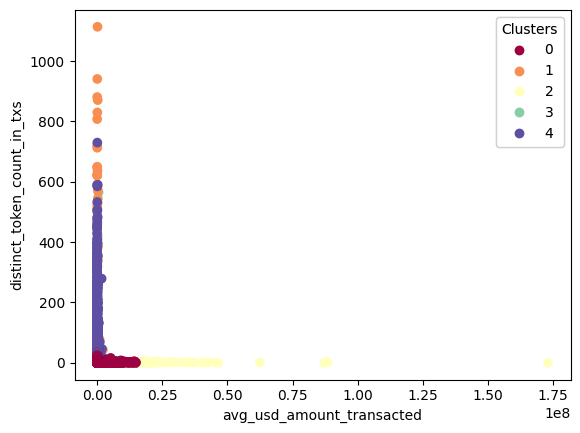

In [ ]:
scatter = plt.scatter(
    df_uniswap_baseline.iloc[:, 4],
    df_uniswap_baseline.iloc[:, 2],
    c=df_uniswap_baseline['cluster_labels'],
    cmap=plt.cm.Spectral,
    norm = norm
)

# Create the legend
legend1 = plt.legend(*scatter.legend_elements(), title="Clusters")
plt.gca().add_artist(legend1)

# Set the x-label and display the plot
plt.xlabel(df_uniswap_baseline.iloc[:, 4].name)
plt.ylabel(df_uniswap_baseline.iloc[:, 2].name)
plt.show()

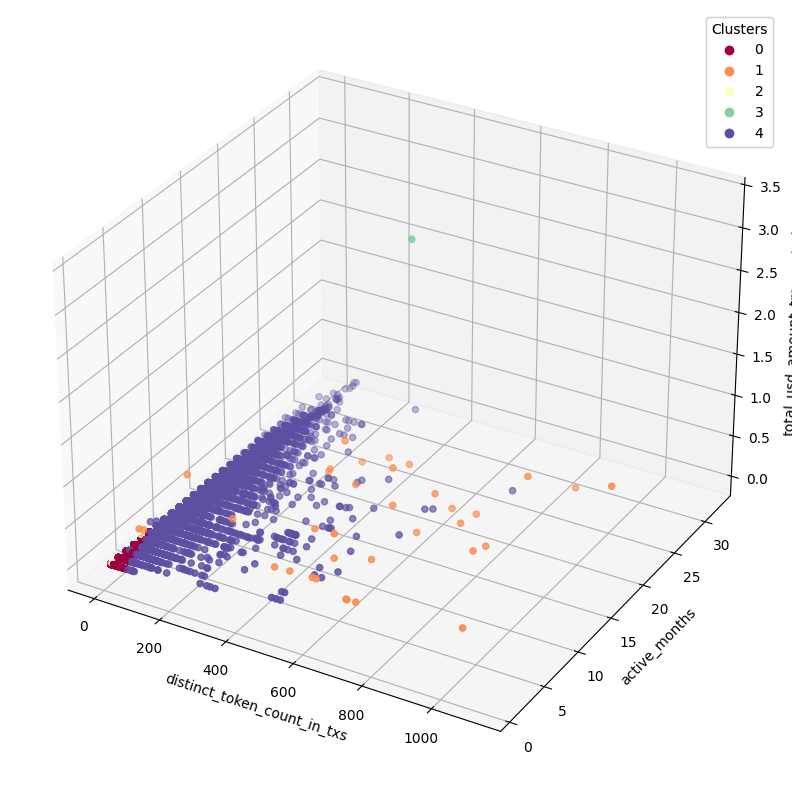

In [ ]:
#use a 3D representation to visualize the cluster "engaged, long-term traders/investors" i.e. cluster number 4
# we also see the retail cluster i.e. cluster number 0 to be in line with our hypothesis that they do not engage as heavily and diversly as the other clusters of actors
# cluster 3 seems to be an outlier
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for 3D visualization
scatter = ax.scatter(
    df_uniswap_baseline.iloc[:, 2],
    df_uniswap_baseline.iloc[:, 5],
    df_uniswap_baseline_sorted_desc.iloc[:, 3],
    c=df_uniswap_baseline['cluster_labels'],
    cmap=plt.cm.Spectral,
    norm=norm
)

# Create a legend for the clusters
legend1 = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend1)

# Set the labels for each axis
ax.set_xlabel(df_uniswap_baseline.columns[2])
ax.set_ylabel(df_uniswap_baseline.columns[5])
ax.set_zlabel(df_uniswap_baseline.columns[3])

plt.savefig('3dscatter.png', dpi=300, bbox_inches='tight', pad_inches=0.5)


plt.tight_layout()
plt.show()


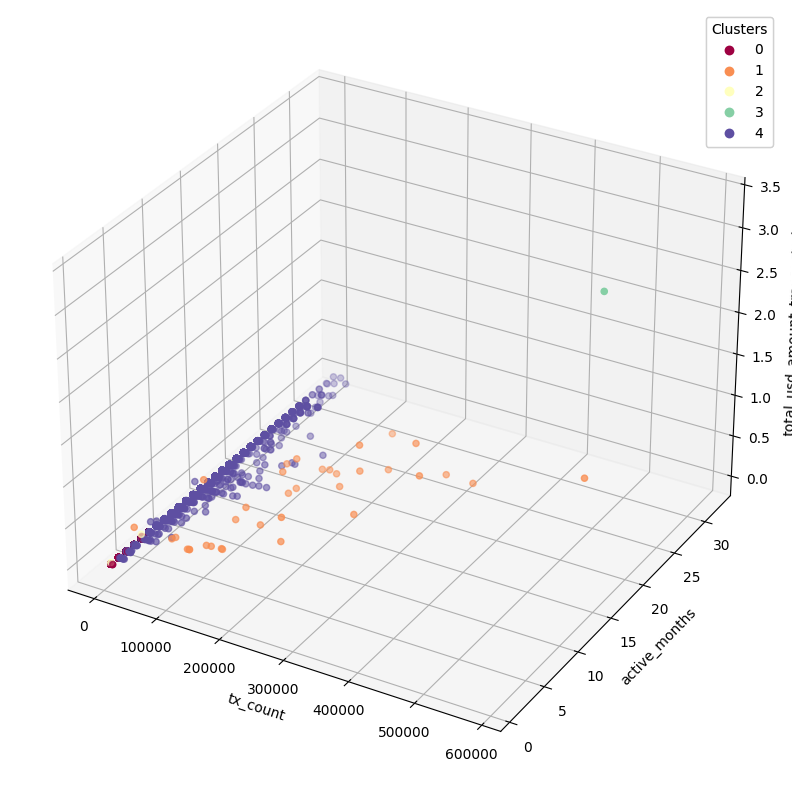

In [ ]:
#use a 3D representation to visualize the cluster "engaged, long-term traders/investors" i.e. cluster number 4
# we also see the retail cluster i.e. cluster number 0 to be in line with our hypothesis that they do not engage as heavily and diversly as the other clusters of actors
# cluster 3 seems to be an outlier
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for 3D visualization
scatter = ax.scatter(
    df_uniswap_baseline.iloc[:, 1],
    df_uniswap_baseline.iloc[:, 5],
    df_uniswap_baseline.iloc[:, 3],
    c=df_uniswap_baseline['cluster_labels'],
    cmap=plt.cm.Spectral,
    norm=norm
)

# Create a legend for the clusters
legend1 = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend1)

# Set the labels for each axis
ax.set_xlabel(df_uniswap_baseline.columns[1])
ax.set_ylabel(df_uniswap_baseline.columns[5])
ax.set_zlabel(df_uniswap_baseline.columns[3])

plt.savefig('3dscatter.png', dpi=300, bbox_inches='tight', pad_inches=0.5)


plt.tight_layout()
plt.show()


###PCA & KMeans

####Clustering on scaled data, then visualizing with 2D PCA performed on scaled data
I'm primarily interested in clustering the data based on its original features (in the high-dimensional space) but want a 2D visualization to understand the cluster separations and distributions.


In this analysis, my primary goal is to explore the inherent groupings within my dataset based on its original features in a high-dimensional space. To achieve this, I first scale the data to normalize feature scales and then apply K-Means clustering to identify distinct groups. To visualize and better understand the relationships and separations between these clusters, I subsequently perform PCA on the scaled data, reducing it to two dimensions. This approach allows me to observe the distribution and separation of clusters in a more comprehensible 2D space, facilitating an intuitive understanding of my data's underlying structure.

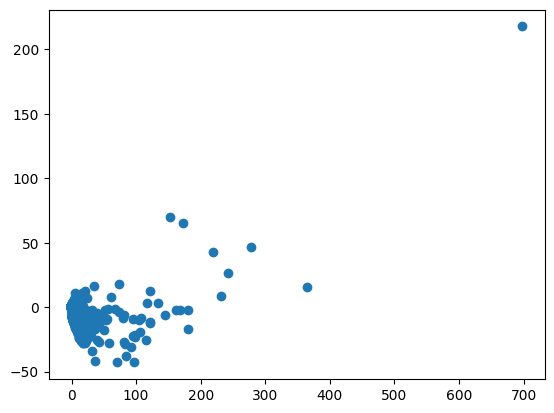

In [ ]:
pipeline_pca2 = Pipeline([("scaler", StandardScaler()),("pca", PCA(n_components = 2))])

X_pca_scaled2 = pipeline_pca2.fit_transform(X)

plt.scatter(X_pca_scaled2[:,0],X_pca_scaled2[:,1])

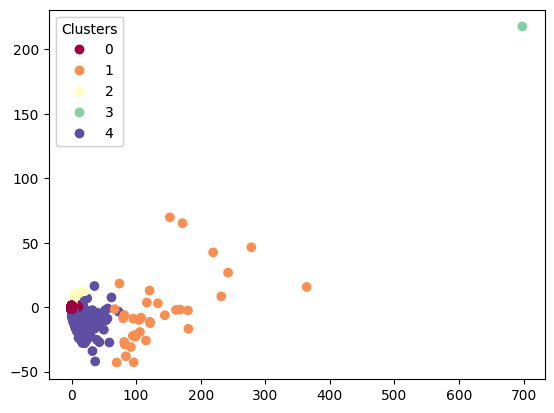

In [ ]:
#color code the initial clusters above to check if result is same as below
# Create the scatter plot
scatter = plt.scatter(
    X_pca_scaled2[:,0],
    X_pca_scaled2[:,1],
    c=df_uniswap_baseline['cluster_labels'],
    cmap=plt.cm.Spectral
)

# Create the legend
legend1 = plt.legend(*scatter.legend_elements(), title="Clusters")
plt.gca().add_artist(legend1)

# Set the x-label and display the plot

plt.show()



**Advantages**:

The clustering process effectively captures the nuances and inherent structures of the high-dimensional data. By considering all original features, K-Means clustering can identify groups based on subtle differences and relationships between multiple dimensions.

**Disadvantages**:

The 2D representation obtained from PCA might not always accurately reflect the true nature of cluster separations that exist in the high-dimensional space. In some cases, clusters that appear to be overlapping or mixed in the PCA plot might actually be well-separated in the original, higher-dimensional space.
The limitation arises because PCA focuses on preserving the global structure and variance, and in doing so, it may not maintain the local neighborhood relationships that are crucial for understanding cluster separations. Thus, clusters defined by subtleties in high-dimensional characteristics might lose their distinction in the reduced 2D PCA space.

**Observations and Recommendations**:

**The observed overlap of clusters in the PCA plot suggests that the clusters formed in the high-dimensional space are not being distinctly represented in the 2D PCA visualization**. This is indicative of the complexity and multidimensionality of the data, where important features influencing cluster formation might be lost in the dimensionality reduction process.
Consequently, a **more advanced non-linear visualization technique, such as t-SNE or UMAP, might be more suitable for our dataset**. These techniques are particularly adept at preserving local structures and relationships within high-dimensional data, potentially offering a more accurate visual representation of the clusters.

####Clustering on scaled data, then visualizing with the four principal components of our PCA performed on scaled data

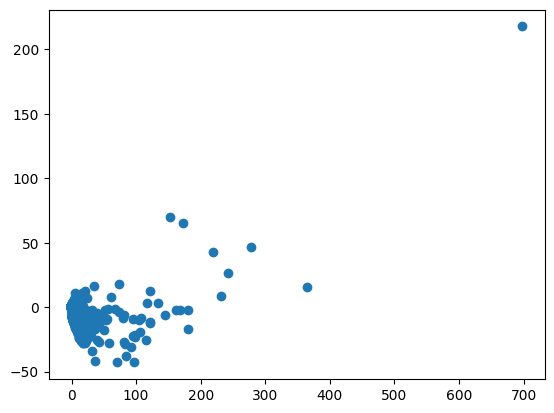

In [ ]:
pipeline_pca_4 = Pipeline([("scaler", StandardScaler()),("pca", PCA(n_components = 4))])

X_pca_scaled_4 = pipeline_pca_4.fit_transform(X)

plt.scatter(X_pca_scaled_4[:,0],X_pca_scaled_4[:,1])

In [ ]:
X_pca_scaled_4[0:6]

array([[697.87386018, 217.80225126,  -2.17094015, 220.62541875],
       [364.04384396,  15.66834707,  -9.7246687 , -67.08024252],
       [219.21418897,  42.45936021,  -1.96208425,  27.92173294],
       [231.89507587,   8.37596785,  -3.76155687, -14.23004624],
       [242.33469308,  26.76334933,  -5.27860885, -21.4527553 ],
       [171.83820809,  65.14167073,   4.50154486,  84.60364443]])

In [ ]:
X_pca_scaled_4[0]

array([697.87386018, 217.80225126,  -2.17094015, 220.62541875])

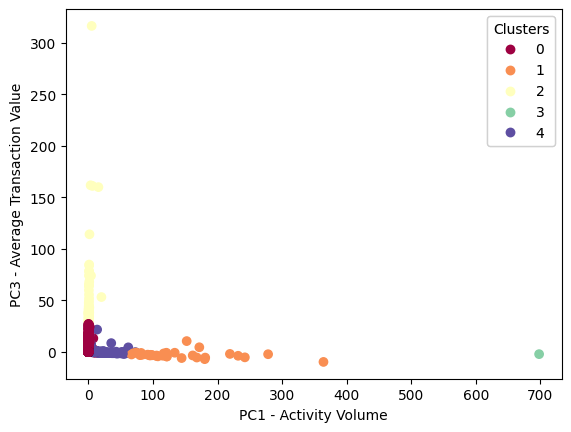

In [ ]:
# Analyze the principal components that clusters the "bot" well (PC1), the , according to our earlier p.c. loading analysis versus the independent average value PC3
scatter = plt.scatter(
    X_pca_scaled_4[:,0],
    X_pca_scaled_4[:,2],
    c=df_uniswap_baseline['cluster_labels'],
    cmap=plt.cm.Spectral
)

# Create the legend
legend1 = plt.legend(*scatter.legend_elements(), title="Clusters")
plt.gca().add_artist(legend1)
# Set the label and display the plot
ax = plt.gca()
ax.set_xlabel('PC1 - Activity Volume')
ax.set_ylabel('PC3 - Average Transaction Value')
plt.show()


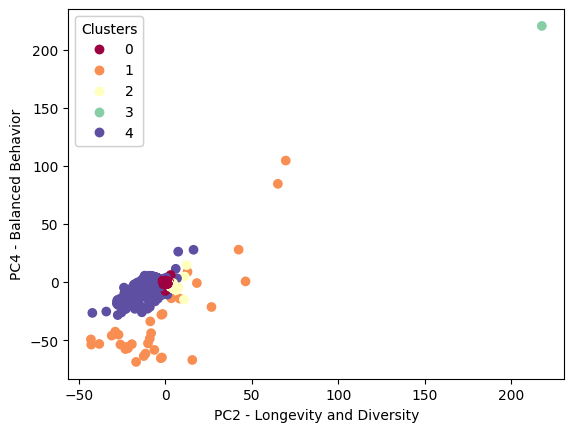

In [ ]:
# Analyze the principal components that could divide based on their pc loadings sophisticated, long-term, retail traders from amateur retail traders
scatter = plt.scatter(
    X_pca_scaled_4[:,1],
    X_pca_scaled_4[:,3],
    c=df_uniswap_baseline['cluster_labels'],
    cmap=plt.cm.Spectral
)

# Create the legend
legend1 = plt.legend(*scatter.legend_elements(), title="Clusters")
plt.gca().add_artist(legend1)

# Set the label and display the plot
ax = plt.gca()
ax.set_xlabel('PC2 - Longevity and Diversity')
ax.set_ylabel('PC4 - Balanced Behavior')
plt.show()

In [ ]:
#challenging visualizing all 4 principal components

# option 1 : pairplots of the 4 principal components
# option 2 : 3D visualization of my most interesting principal components(PC)

# Convert X_pca_scaled_4 to a DataFrame
X_pca_scaled_4_df = pd.DataFrame(X_pca_scaled_4, columns=['PC1', 'PC2', 'PC3', 'PC4'])

#add clusters
X_pca_scaled_4_df['Cluster'] = df_uniswap_baseline['cluster_labels'].values



In [ ]:
df_uniswap_baseline['cluster_labels'].values

array([3, 1, 1, ..., 0, 0, 0], dtype=int32)

In [ ]:
X_pca_scaled_4_df

,PC1,PC2,PC3,PC4,Cluster
0,697.87,217.80,-2.17,220.63,3
1,364.04,15.67,-9.72,-67.08,1
2,219.21,42.46,-1.96,27.92,1
3,231.90,8.38,-3.76,-14.23,1
4,242.33,26.76,-5.28,-21.45,1
...,...,...,...,...,...
396575,-0.17,0.49,-0.11,-0.15,0
396576,-0.17,0.49,-0.11,-0.15,0
396577,-0.17,0.49,-0.11,-0.15,0
396578,-0.17,0.49,-0.11,-0.15,0


In [ ]:
df_uniswap_baseline.iloc[396579]

tx_from                          0xca6a3f57cc35530f8f9f63bc6506613ce23b0f1f
tx_count                                                               1.00
distinct_token_count_in_txs                                               1
total_usd_amount_transacted                                        17726.54
avg_usd_amount_transacted                                          17726.54
active_months                                                             1
monthly_txns_count                                                        1
monthly_usd_amount_transacted                                      17726.54
cluster_labels                                                            0
Name: 396579, dtype: object

In [ ]:
X_pca_scaled_4_df

,PC1,PC2,PC3,PC4,Cluster
0,697.87,217.80,-2.17,220.63,3
1,364.04,15.67,-9.72,-67.08,1
2,219.21,42.46,-1.96,27.92,1
3,231.90,8.38,-3.76,-14.23,1
4,242.33,26.76,-5.28,-21.45,1
...,...,...,...,...,...
396575,-0.17,0.49,-0.11,-0.15,0
396576,-0.17,0.49,-0.11,-0.15,0
396577,-0.17,0.49,-0.11,-0.15,0
396578,-0.17,0.49,-0.11,-0.15,0


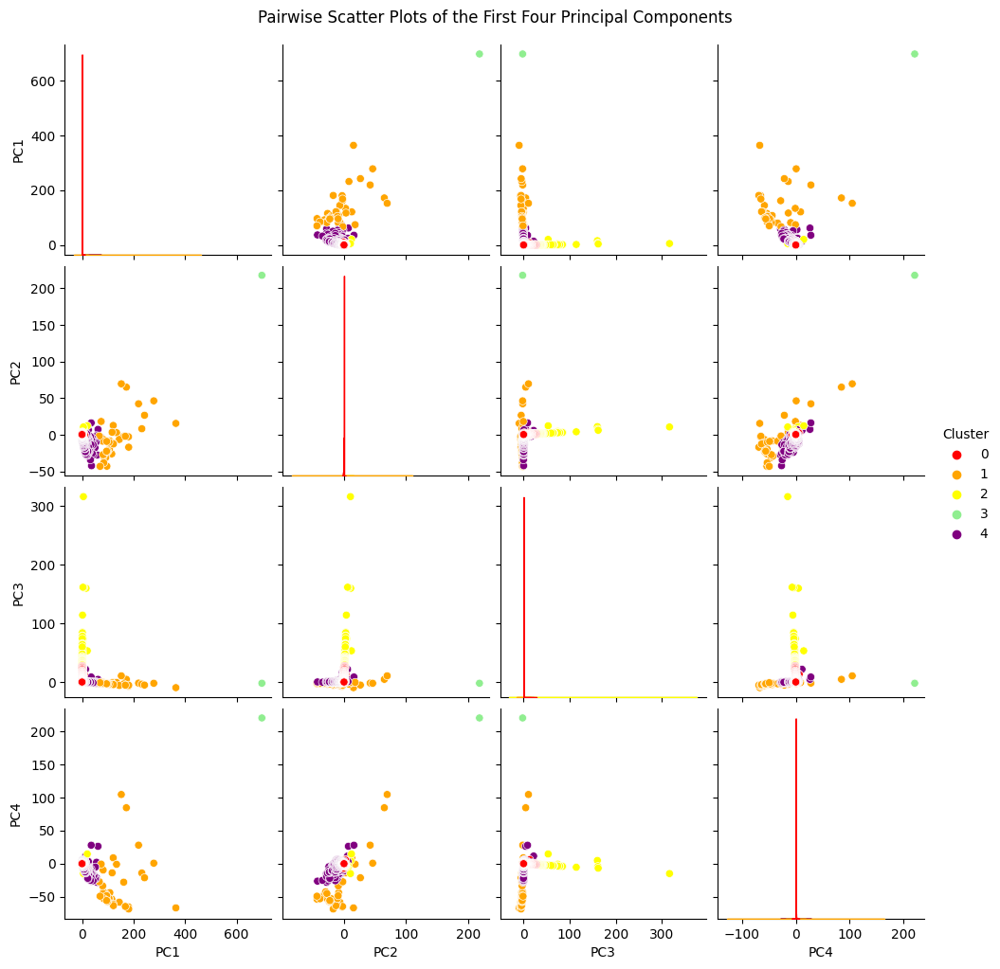

In [ ]:
# option 1: pairplot
# Define a custom color palette to ensure same coloring for clusters as before as well in seaborne visualizations
custom_palette = {0: 'red', 1: 'orange', 2: 'yellow', 3: 'lightgreen', 4: 'purple'}

pairplot = sns.pairplot(X_pca_scaled_4_df, hue='Cluster', palette =custom_palette)
pairplot.fig.suptitle("Pairwise Scatter Plots of the First Four Principal Components", y=1.02)

plt.show()


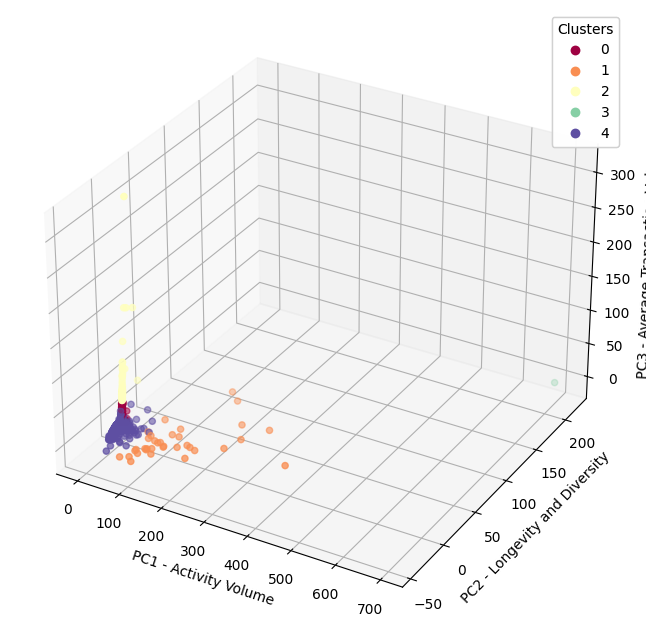

In [ ]:
# option 2: 3D visualization of the main three components of interest (based on business acumen)

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot for 3D visualization using PCA components
scatter = ax.scatter(
    X_pca_scaled_4_df['PC1'],
    X_pca_scaled_4_df['PC2'],
    X_pca_scaled_4_df['PC3'],
    c=df_uniswap_baseline['cluster_labels'],
    cmap=plt.cm.Spectral
)

# Create a legend for the clusters
legend1 = ax.legend(*scatter.legend_elements(), title="Clusters")
ax.add_artist(legend1)

# Set the labels for each axis
ax.set_xlabel('PC1 - Activity Volume')
ax.set_ylabel('PC2 - Longevity and Diversity')
ax.set_zlabel('PC3 - Average Transaction Value')

plt.show()


##Final Insight from EDA & KMeans: Forming my Hypothesis

### Summary statistics of clusters and differences

My hypothesis is to redo the clustering on a subset of the original dataframe, getting rid of:
* Cluster 3: I assume it be an outlier (one single datapoint) and can be deleted to better cluster my dataset
* Cluster 0 is a more noisy version of Cluster 4 and it has a lot of data around the zero value, hence it would cluster mainly amateur, retail traders. In my project I want to cluster more seasoned traders (bots, whales, long-term sophisticated retail traders). Also, eliminating this clusters boils down our data set makign analysis easier

In conclusion, I hypothesize that by focusing on clusters 1,2 and 4, I will be able to analyze the behavior of different types of seasoned traders.

In [ ]:
df_uniswap_baseline.groupby('cluster_labels').size().sort_values( ascending = False)

cluster_labels
0    372449
4     24034
2        61
1        35
3         1
dtype: int64

**Summary statistics below for each cluster**

In [ ]:
df_uniswap_baseline[df_uniswap_baseline["cluster_labels"] == 1].describe()

,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted,cluster_labels
count,35.00,35.00,35.00,35.00,35.00,35.00,35.00,35.00
mean,161068.74,530.60,25530288985.96,217274.62,12.80,13235.29,2299439060.35,1.00
std,104444.80,251.48,25222755814.92,389189.53,6.32,6178.47,2499439519.73,0.00
min,14616.00,8.00,3952673035.34,48688.45,3.00,4872.00,372357077.83,1.00
25%,94810.50,389.50,7340568938.07,64479.42,6.00,8086.50,746337091.69,1.00
50%,124158.00,530.00,13129316012.59,78072.07,14.00,12612.00,1239234134.87,1.00
75%,208832.50,648.50,36858375311.47,230530.37,18.00,16219.50,2623808280.13,1.00
max,544010.00,1114.00,93413356007.42,2231840.69,26.00,29036.00,10873527847.09,1.00


In [ ]:
df_uniswap_baseline[df_uniswap_baseline["cluster_labels"] == 2].describe()

,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted,cluster_labels
count,61.00,61.00,61.00,61.00,61.00,61.00,61.00,61.00
mean,3.93,1.31,170988244.39,31168203.98,1.25,2.79,97182792.24,2.00
std,10.75,1.03,678020946.89,24776844.02,0.65,8.16,265149579.15,0.00
min,1.00,0.00,15946212.31,15946212.31,1.00,1.00,15946212.31,2.00
25%,1.00,1.00,21000386.03,19515297.82,1.00,1.00,20816653.33,2.00
50%,1.00,1.00,35812317.34,22561694.15,1.00,1.00,32762941.19,2.00
75%,2.00,1.00,63936523.15,35079296.92,1.00,2.00,49537540.53,2.00
max,64.00,7.00,5051222296.73,172967261.45,5.00,64.00,1821887988.88,2.00


In [ ]:
df_uniswap_baseline[df_uniswap_baseline["cluster_labels"] == 0].describe()

,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted,cluster_labels
count,372449.00,372449.00,372449.00,372449.00,372449.00,372449.00,372449.00,372449.00
mean,6.69,2.37,499578.89,61762.53,1.67,3.28,244328.80,0.00
std,31.10,2.28,7370752.33,240689.55,1.12,13.27,2217912.23,0.00
min,1.00,0.00,17726.54,17726.54,1.00,1.00,17726.54,0.00
25%,1.00,1.00,37985.89,22932.55,1.00,1.00,32771.97,0.00
50%,2.00,2.00,86730.21,30558.92,1.00,2.00,61426.01,0.00
75%,6.00,3.00,259576.98,48916.73,2.00,3.00,142332.30,0.00
max,4944.00,48.00,2619550364.40,15336927.77,6.00,2873.00,523910072.88,0.00


In [ ]:
df_uniswap_baseline[df_uniswap_baseline["cluster_labels"] == 4].describe()

,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted,cluster_labels
count,24034.00,24034.00,24034.00,24034.00,24034.00,24034.00,24034.00,24034.00
mean,370.77,21.12,39753330.03,77061.07,9.49,34.34,3695471.50,4.00
std,2570.31,31.45,382669011.67,156037.99,3.80,196.16,33235625.78,0.00
min,7.00,0.00,173833.44,19020.68,1.00,1.00,21729.18,4.00
25%,29.00,9.00,1351072.93,35389.30,7.00,3.00,165541.93,4.00
50%,54.00,13.00,2977214.99,49186.24,8.00,6.00,336099.83,4.00
75%,125.00,21.00,8604829.02,78995.68,11.00,12.00,870481.44,4.00
max,109009.00,730.00,27619230184.61,11565846.23,32.00,6229.00,2510839107.69,4.00


In [ ]:
df_uniswap_baseline[df_uniswap_baseline["cluster_labels"] == 3].describe()

,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted,cluster_labels
count,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
mean,585248.00,565.00,333885754023.44,570503.02,17.00,34426.00,19640338471.97,3.00
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,585248.00,565.00,333885754023.44,570503.02,17.00,34426.00,19640338471.97,3.00
25%,585248.00,565.00,333885754023.44,570503.02,17.00,34426.00,19640338471.97,3.00
50%,585248.00,565.00,333885754023.44,570503.02,17.00,34426.00,19640338471.97,3.00
75%,585248.00,565.00,333885754023.44,570503.02,17.00,34426.00,19640338471.97,3.00
max,585248.00,565.00,333885754023.44,570503.02,17.00,34426.00,19640338471.97,3.00


**Patterns from the summary statistic of each cluster:**

Cluster 1: Represents highly active traders. Characterized by high transaction counts, distinct token counts, and significant total USD amounts transacted. This cluster shows a high level of activity and diversity in trading.

Cluster 2: Appears to represent occasional, high-value traders. Low transaction counts and distinct token counts but high average USD amounts per transaction. This suggests fewer but larger transactions.

Cluster 0: This is a large cluster with low average transaction counts and amounts. This cluster likely represents more casual or amateur traders with less frequent and lower value transactions.

Cluster 4: Includes moderately active traders. Higher transaction counts and distinct token counts than Cluster 0, but lower than Cluster 1. This cluster might represent more engaged retail traders.

Cluster 3 (Outlier): An extreme outlier with exceptionally high transaction counts and total USD amounts. This cluster likely represents a very unique trading behavior or entity, significantly different from others.

**Impact of Removing Clusters 0 and 3**

Removing Cluster 0: By removing this cluster, I will be eliminating a large group of casual/amateur traders from my analysis. This will allow me to focus more on the patterns of professional or serious traders. However, there's a possibility that I might lose some insights into the lower end of the market. My objective is to concentrate on more sophisticated trading patterns, and in this context, removing Cluster 0 seems to align well with my goals.

Removing Cluster 3: This cluster is just a single data point with extremely high values. I believe that removing it won't significantly impact my overall analysis of market trends. It will help normalize my dataset and make my analysis more representative of typical trading behaviors.

**Additional Considerations**

Outliers in Cluster 4: I need to carefully consider the nature of outliers within Cluster 4. If they represent valid trading patterns, it might be beneficial to keep them in my analysis. On the other hand, if they are more likely to be anomalies or noise, removing them could help refine my analysis.

**Re-running Clustering**

After the removal of Clusters 0 and 3, I plan to re-run my clustering analysis. This is crucial to understand how their removal affects the clustering dynamics and to see if new, meaningful patterns emerge in the data.

**Statistical Analysis Post-Removal**

I will conduct additional statistical tests and visualizations to understand how the removal of these clusters impacts the characteristics of the data that remains. This step is important to validate the changes I'm making to the dataset.

**Conclusion**

In summary, removing Clusters 0 and 3 is a strategic decision that aligns with my focus on more professional or significant trading behaviors. It simplifies my dataset, potentially making my subsequent analyses more relevant to my business interests. However, I must be cognizant of the potential information loss, particularly concerning the lower market segment. I will also re-evaluate my clustering post-removal to ensure that the remaining clusters are still meaningful and accurately representative.

### Relationship between selected categorical and numerical features

I have only one categorical feature, "tx_from", that stores all the addresses that initiated a transaction. Through clustering I was able to group them and can now compare them with the most important numerical features identified via my EDA above.

Consider Log Transformation: Given the wide range and scale of these values, I use a **log transformation for visualization or analysis**, especially to normalize and better understand the distribution of these features. Log transformation can make some patterns more visible and the data more manageable. Without log transformation there was I couldn't see any differences between the clusters using the below visualizations

##### Histograms and density plots

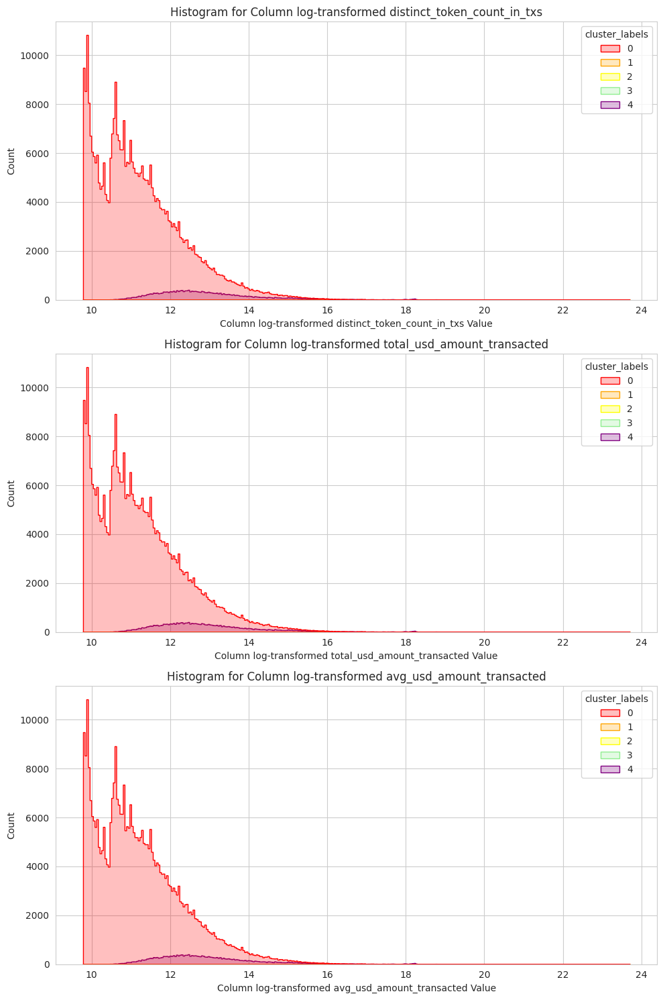

In [ ]:
#inspect the clustering in histograms of the main features

# Set the aesthetic style of the plots
sns.set_style('whitegrid')

# Define the columns of interest based on their index
columns_of_interest = [2, 3, 4]

# Create a figure with subplots - one for each column of interest
fig, axes = plt.subplots(len(columns_of_interest), 1, figsize=(10, 5 * len(columns_of_interest)))

#log transform data as non transformed data is
X_log = X.apply(lambda x: np.log(x+ 1))

# Loop through the columns of interest
for i, column_idx in enumerate(columns_of_interest):
    # Create a histogram on the appropriate subplot
    sns.histplot(
        data=X_log,
        x=X_log[column],
        hue=df_uniswap_baseline['cluster_labels'],
        element="step",  # Use step to see individual bars better, or 'poly' for smooth lines
        palette= custom_palette,
        ax=axes[i]  # Plot on the i-th subplot axis
    )

    # Set the title and labels
    axes[i].set_title(f'Histogram for Column log-transformed {df_uniswap_baseline.columns[column_idx]}')
    axes[i].set_xlabel(f'Column log-transformed {df_uniswap_baseline.columns[column_idx]} Value')
    axes[i].set_ylabel('Count')

# Adjust the layout so labels don't overlap
plt.tight_layout()

# Show the plot
plt.show()


To effectively visualize the distributions of various clusters for selected features in my dataset, KDE plots are preferable over histograms. KDE plots are particularly advantageous for skewed datasets as they provide a normalized view, where the area under the curve (AUC) sums up to 1, enabling fair comparison across clusters of different sizes. Additionally, KDE plots are visually more informative for examining overlapping distributions, which is a characteristic feature of the clusters in my analysis.

<ipython-input-127-06c71f25eb4e>:11: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(
<ipython-input-127-06c71f25eb4e>:11: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(
<ipython-input-127-06c71f25eb4e>:11: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(
<ipython-input-127-06c71f25eb4e>:11: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(
<ipython-input-127-06c71f25eb4e>:11: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(


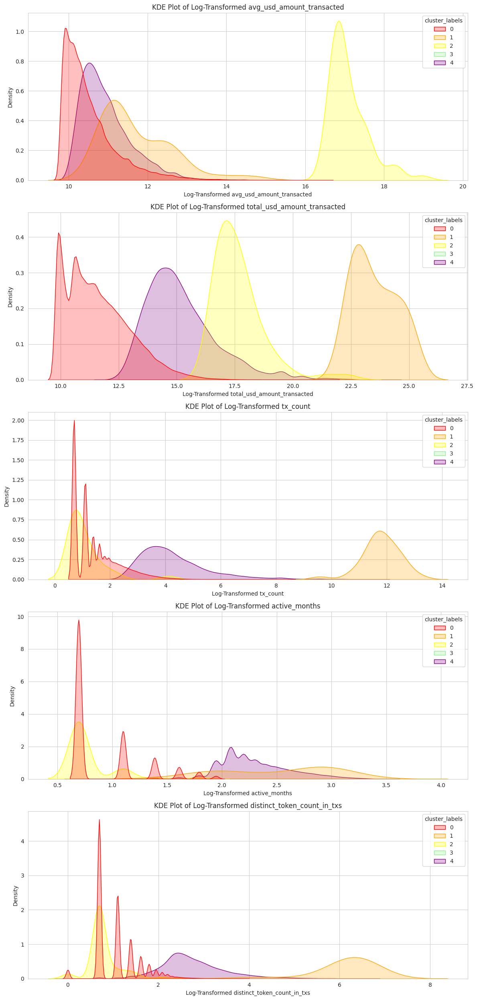

In [ ]:
# List of columns to plot
columns_to_plot = ['avg_usd_amount_transacted', 'total_usd_amount_transacted', 'tx_count', 'active_months', 'distinct_token_count_in_txs']

# Create a figure with subplots for KDE plots (1 plot per row)
fig, axes = plt.subplots(len(columns_to_plot), 1, figsize=(12, 5 * len(columns_to_plot)))

# Loop through the columns and create KDE plots
for i, col in enumerate(columns_to_plot):

    # KDE plot with hue for cluster labels and custom color palette
    sns.kdeplot(
        data=X_log,
        x=col,
        hue=df_uniswap_baseline['cluster_labels'],
        fill=True,
        common_norm=False,  # Normalize each cluster separately
        palette=custom_palette,
        ax=axes[i])

    axes[i].set_title(f'KDE Plot of Log-Transformed {col}')
    axes[i].set_xlabel(f'Log-Transformed {col}')
    axes[i].set_ylabel('Density')

plt.tight_layout()
plt.show()


##### Violin Plots

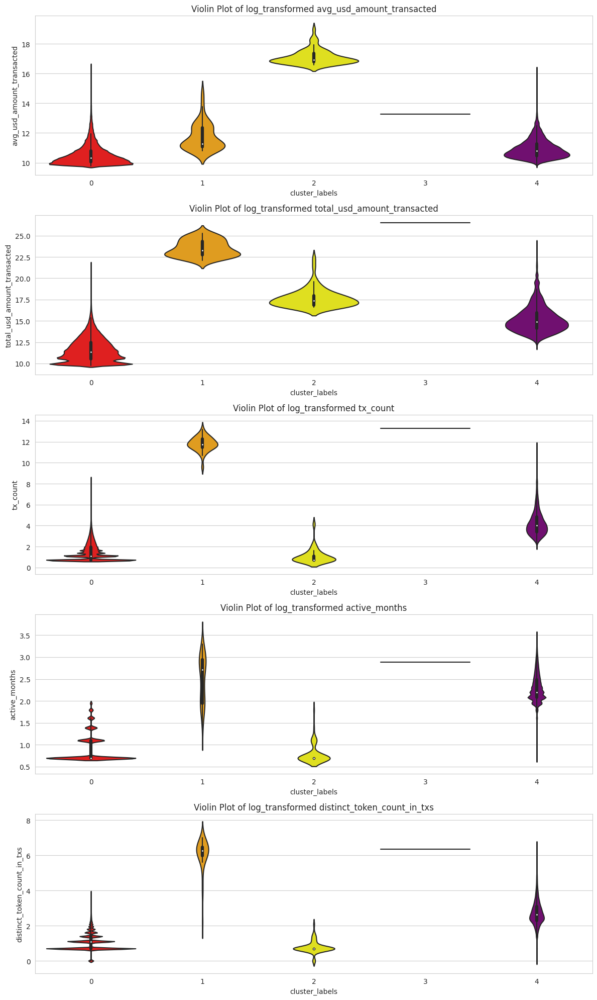

In [ ]:
#I visualize my the clusters for each of the most relevant features (relevant means the features that had the most significant loadings in my principal components)

#violin plots first:

# List of columns to plot
columns_to_plot = ['avg_usd_amount_transacted', 'total_usd_amount_transacted', 'tx_count', 'active_months', 'distinct_token_count_in_txs']

# Create a figure with subplots for violin plots
fig, axes = plt.subplots(len(columns_to_plot), 1, figsize=(12, 4 * len(columns_to_plot)))

# Loop through the columns and create violin plots
for i, col in enumerate(columns_to_plot):
    sns.violinplot(x=df_uniswap_baseline['cluster_labels'], y=col, data=X_log, ax=axes[i], palette=custom_palette)
    axes[i].set_title(f'Violin Plot of log_transformed {col}')

plt.tight_layout()  # Adjust the layout
plt.show()


##### Box Plots

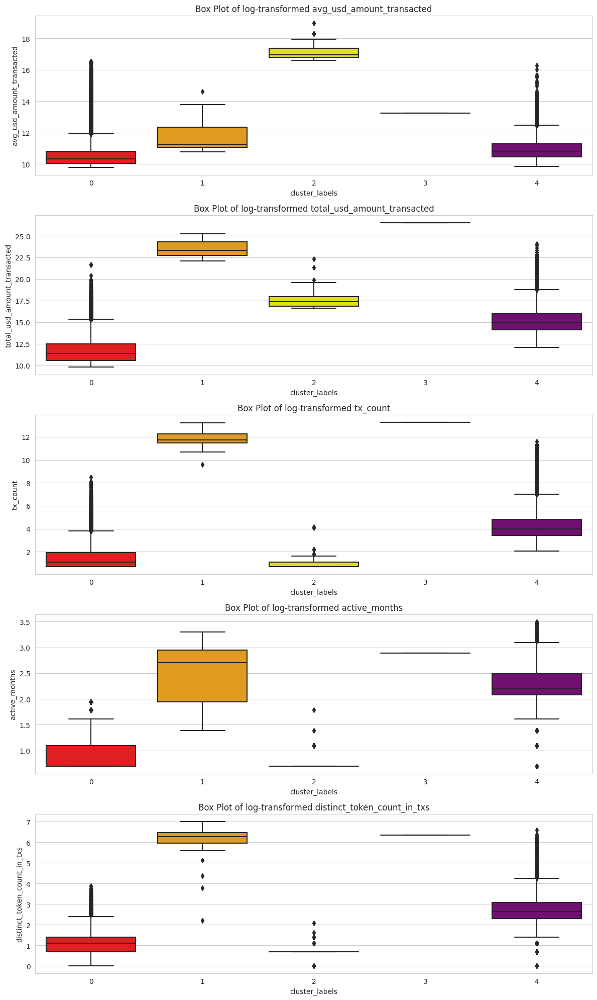

In [ ]:
#I visualize my the clusters for each of the most relevant features ( relevant means the features that had the most significant loadings in my principal components)

#box plots second:

# List of columns to plot
columns_to_plot = ['avg_usd_amount_transacted', 'total_usd_amount_transacted', 'tx_count', 'active_months', 'distinct_token_count_in_txs']

# Create a figure with subplots for boxplots
fig, axes = plt.subplots(len(columns_to_plot), 1, figsize=(12, 4 * len(columns_to_plot)))

# Loop through the columns and create boxplots
for i, col in enumerate(columns_to_plot):
    sns.boxplot(x=df_uniswap_baseline['cluster_labels'], y=col, data=X_log, ax=axes[i], palette=custom_palette)
    axes[i].set_title(f"Box Plot of log-transformed {col}")

plt.tight_layout()  # Adjust the layout
plt.show()

### Statistical test for significance between Cluster 0 and Cluster 4

I do not test for differences in the other clusters, as I'm confident in my previous analysis to accept the clustering for cluster 1 and 2. Also, I'm confident that cluster 3 is an outlier, which I will remove.

As I can't assume a normal distribution for the selected features in Cluster 0 and 4 - as indicated by the plots above - I will apply a Mann-Whitney U test to figure out if we actually have a statistically significant difference between the two clusters as indicated by my previous analysis.

In [ ]:
import scipy.stats as stats

# Define the columns to test
columns_to_test = ['avg_usd_amount_transacted', 'total_usd_amount_transacted', 'tx_count', 'active_months', 'distinct_token_count_in_txs']

# Directly use the original dataframes with cluster labels to compare
# Loop through each column and perform the test
for col in columns_to_test:
    # Select data for Cluster 0 and Cluster 4
    data_cluster_0 = X_log[df_uniswap_baseline['cluster_labels'] == 0][col]
    data_cluster_4 = X_log[df_uniswap_baseline['cluster_labels'] == 4][col]

    # Perform the Mann-Whitney U test
    stat, p = stats.mannwhitneyu(data_cluster_0, data_cluster_4, alternative='two-sided')
    print(f"Mann-Whitney U test for {col}:")
    print(f"U-statistic: {stat}, P-value: {p}")

    # Interpretation of the test
    if p < 0.05:
        print(f"There is a statistically significant difference in {col} between Cluster 0 and Cluster 4.\n")
    else:
        print(f"There is no statistically significant difference in {col} between Cluster 0 and Cluster 4.\n")

    print("--------------------------------------------------------------------------------------------------")


Mann-Whitney U test for avg_usd_amount_transacted:
U-statistic: 2489294232.0, P-value: 0.0
There is a statistically significant difference in avg_usd_amount_transacted between Cluster 0 and Cluster 4.

--------------------------------------------------------------------------------------------------
Mann-Whitney U test for total_usd_amount_transacted:
U-statistic: 339009141.0, P-value: 0.0
There is a statistically significant difference in total_usd_amount_transacted between Cluster 0 and Cluster 4.

--------------------------------------------------------------------------------------------------
Mann-Whitney U test for tx_count:
U-statistic: 207204875.0, P-value: 0.0
There is a statistically significant difference in tx_count between Cluster 0 and Cluster 4.

--------------------------------------------------------------------------------------------------
Mann-Whitney U test for active_months:
U-statistic: 28046112.0, P-value: 0.0
There is a statistically significant difference in a

### Further insights obtained from visualizations and statistical test above

**Including the outliers of cluster 0 but getting rid of the rest of cluster 0.**

**Include cluster 4 including its outliers, as too much information about seasoned traders would be lost.**

In the visual analysis of Clusters 0 and 4, Kernel Density Estimation (KDE) plots highlighted overlapping distributions in key features such as 'avg_usd_amount_transacted' and 'total_usd_amount_transacted'. This overlap indicates similarities in trading behaviors between these clusters, despite their distinct general characteristics. Significantly, within Cluster 0, which predominantly consists of less seasoned traders, there exists a notable subset of outliers. These outliers are characterized by higher transaction values, aligning more closely with the seasoned trading patterns observed in Cluster 4. This observation suggests that these outliers in Cluster 0 share more in common with the seasoned traders of Cluster 4 than with the typical profile of Cluster 0.

From a business analysis standpoint, incorporating these outliers from Cluster 0 into the study of seasoned traders could be beneficial. It ensures a more comprehensive capture of varied trading behaviors, potentially revealing insights into significant but less frequent trading activities. Consequently, the decision to re-examine the dataset by including these outliers and rerunning clustering algorithms aligns with the objective of focusing on seasoned traders. This refined approach is anticipated to yield more nuanced and representative clusters, enhancing the overall robustness and relevance of the subsequent analysis.

### Save splitted dataframe to new dataframe for the professional traders and create baseline dataframes for further robustness tests

1. Save an alternative baseline dataset for the clusters formed in this dataset but getting rid of all the outliers. This could help for alternative analysis, such as robustness tests of my clustering above, especially when dealing with log transformed data in my clustering. Getting rid of outliers that persist in the log transformed reality could help my repeated analysis for the baseline model without outliers
2. Pro Trader Uniswap subset that excludes cluster 3 (outlier) and excludes cluster 0 except the positive outliers that persisted in the log transformed world, as these actors seem to differentiate themselves from amateur retail traders i.e. closer to traders in cluster 4

#### Step 1: Create uniswap baseline dataset without the positive and negative outliers for each cluster as indicated by our boxplot

In [ ]:
df_uniswap_baseline


,tx_from,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted,cluster_labels
0,0xb58555fcba6479fced7de1485eb054943a09af7b,585248.00,565,333885754023.44,570503.02,17,34426,19640338471.97,3
1,0x26ce7c1976c5eec83ea6ac22d83cb341b08850af,544010.00,1114,93413356007.42,171712.57,19,28632,4916492421.44,1
2,0x7aa0426f10c7603bbfb8ceb8afb8d8c329ccfe8b,225383.00,385,82797756346.90,367364.69,16,14086,5174859771.68,1
3,0xa6ae57b1da8238cd149bc718c40578e4620b752c,282253.00,871,75558529891.35,267697.88,19,14855,3976764731.12,1
4,0x52b86a86e4d764e8275391c436127e60340a0e6a,320112.00,530,67199860810.47,209926.09,16,20007,4199991300.65,1
...,...,...,...,...,...,...,...,...,...
396575,0xfbc6f39da71d22e800f921e4b912913c00124332,1.00,1,17726.70,17726.70,1,1,17726.70,0
396576,0xd443fc34d51badcb7118a97e452f8776a39d3403,1.00,1,17726.66,17726.66,1,1,17726.66,0
396577,0x0d93b6922d47b148d24dd05456ef85a8be46ee89,1.00,1,17726.60,17726.60,1,1,17726.60,0
396578,0xce3ee9c115d7e817b25809b4acab8227f5620519,1.00,1,17726.59,17726.59,1,1,17726.59,0


In [ ]:
# Start with a deep copy of the original DataFrame
X_log_no_outliers = X_log.copy(deep=True)

# Define the columns of interest
columns_to_plot = ['avg_usd_amount_transacted', 'total_usd_amount_transacted', 'tx_count', 'active_months', 'distinct_token_count_in_txs']

# Initialize a set to keep track of indices that have already been removed
removed_indices = set()

# Removing outliers for each cluster in each column
for col in columns_to_plot:
    for cluster in df_uniswap_baseline['cluster_labels'].unique():
        cluster_data = X_log[df_uniswap_baseline['cluster_labels'] == cluster][col]

        Q1 = cluster_data.quantile(0.25)
        Q3 = cluster_data.quantile(0.75)
        IQR = Q3 - Q1

        outliers_condition = ((cluster_data < (Q1 - 1.5 * IQR)) | (cluster_data > (Q3 + 1.5 * IQR)))
        outliers_indices = set(cluster_data[outliers_condition].index)

        # Remove indices that have not been removed yet
        new_indices_to_remove = outliers_indices - removed_indices
        X_log_no_outliers = X_log_no_outliers.drop(list(new_indices_to_remove))

        # Update the set of removed indices
        removed_indices.update(new_indices_to_remove)

X_log_no_outliers

,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
0,13.28,6.34,26.53,13.25,2.89,10.45,23.70
1,13.21,7.02,25.26,12.05,3.00,10.26,22.32
2,12.33,5.96,25.14,12.81,2.83,9.55,22.37
3,12.55,6.77,25.05,12.50,3.00,9.61,22.10
4,12.68,6.27,24.93,12.25,2.83,9.90,22.16
...,...,...,...,...,...,...,...
396575,0.69,0.69,9.78,9.78,0.69,0.69,9.78
396576,0.69,0.69,9.78,9.78,0.69,0.69,9.78
396577,0.69,0.69,9.78,9.78,0.69,0.69,9.78
396578,0.69,0.69,9.78,9.78,0.69,0.69,9.78


In [ ]:
# Extract the indices of the non-outlier data from X_log_no_outliers
non_outlier_indices = X_log_no_outliers.index

# Filter df_uniswap_baseline using these indices
df_uniswap_baseline_no_outliers = df_uniswap_baseline.loc[non_outlier_indices]
df_uniswap_baseline_no_outliers #index wasnt reset on purpose so we are still aligned with out X and X_log dataset

,tx_from,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted,cluster_labels
0,0xb58555fcba6479fced7de1485eb054943a09af7b,585248.00,565,333885754023.44,570503.02,17,34426,19640338471.97,3
1,0x26ce7c1976c5eec83ea6ac22d83cb341b08850af,544010.00,1114,93413356007.42,171712.57,19,28632,4916492421.44,1
2,0x7aa0426f10c7603bbfb8ceb8afb8d8c329ccfe8b,225383.00,385,82797756346.90,367364.69,16,14086,5174859771.68,1
3,0xa6ae57b1da8238cd149bc718c40578e4620b752c,282253.00,871,75558529891.35,267697.88,19,14855,3976764731.12,1
4,0x52b86a86e4d764e8275391c436127e60340a0e6a,320112.00,530,67199860810.47,209926.09,16,20007,4199991300.65,1
...,...,...,...,...,...,...,...,...,...
396575,0xfbc6f39da71d22e800f921e4b912913c00124332,1.00,1,17726.70,17726.70,1,1,17726.70,0
396576,0xd443fc34d51badcb7118a97e452f8776a39d3403,1.00,1,17726.66,17726.66,1,1,17726.66,0
396577,0x0d93b6922d47b148d24dd05456ef85a8be46ee89,1.00,1,17726.60,17726.60,1,1,17726.60,0
396578,0xce3ee9c115d7e817b25809b4acab8227f5620519,1.00,1,17726.59,17726.59,1,1,17726.59,0


In [ ]:
# Ensure non_outlier_indices is a list or a pandas Index object
non_outlier_indices = X_log_no_outliers.index

# Check if the indices are aligned
are_indices_aligned = all(df_uniswap_baseline_no_outliers.index == X_log.loc[non_outlier_indices].index) and \
                      all(df_uniswap_baseline_no_outliers.index == X.loc[non_outlier_indices].index)

print("Indices are aligned:", are_indices_aligned)


Indices are aligned: True


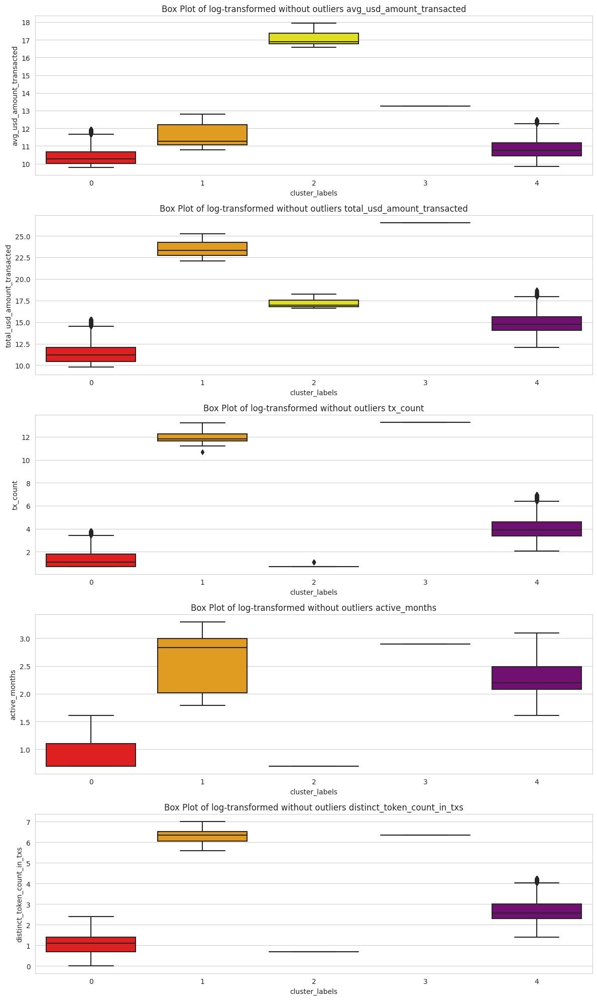

In [ ]:
# Merge cluster labels with X_log_no_outliers based on index
X_log_no_outliers_with_clusters = X_log_no_outliers.merge(df_uniswap_baseline['cluster_labels'], left_index=True, right_index=True, how='left')

# Define columns to plot
columns_to_plot = ['avg_usd_amount_transacted', 'total_usd_amount_transacted', 'tx_count', 'active_months', 'distinct_token_count_in_txs']

# Create a figure with subplots for boxplots
fig, axes = plt.subplots(len(columns_to_plot), 1, figsize=(12, 4 * len(columns_to_plot)))

# Loop through the columns and create boxplots
for i, col in enumerate(columns_to_plot):
    sns.boxplot(x=df_uniswap_baseline_no_outliers['cluster_labels'], y=col, data=X_log_no_outliers_with_clusters, ax=axes[i], palette=custom_palette)
    axes[i].set_title(f"Box Plot of log-transformed without outliers {col}")

plt.tight_layout()
plt.show()


In [ ]:

df_uniswap_baseline_no_outliers = df_uniswap_baseline_no_outliers.reset_index(drop=True)
df_uniswap_baseline_no_outliers

,tx_from,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted,cluster_labels
0,0xb58555fcba6479fced7de1485eb054943a09af7b,585248.00,565,333885754023.44,570503.02,17,34426,19640338471.97,3
1,0x26ce7c1976c5eec83ea6ac22d83cb341b08850af,544010.00,1114,93413356007.42,171712.57,19,28632,4916492421.44,1
2,0x7aa0426f10c7603bbfb8ceb8afb8d8c329ccfe8b,225383.00,385,82797756346.90,367364.69,16,14086,5174859771.68,1
3,0xa6ae57b1da8238cd149bc718c40578e4620b752c,282253.00,871,75558529891.35,267697.88,19,14855,3976764731.12,1
4,0x52b86a86e4d764e8275391c436127e60340a0e6a,320112.00,530,67199860810.47,209926.09,16,20007,4199991300.65,1
...,...,...,...,...,...,...,...,...,...
354911,0xfbc6f39da71d22e800f921e4b912913c00124332,1.00,1,17726.70,17726.70,1,1,17726.70,0
354912,0xd443fc34d51badcb7118a97e452f8776a39d3403,1.00,1,17726.66,17726.66,1,1,17726.66,0
354913,0x0d93b6922d47b148d24dd05456ef85a8be46ee89,1.00,1,17726.60,17726.60,1,1,17726.60,0
354914,0xce3ee9c115d7e817b25809b4acab8227f5620519,1.00,1,17726.59,17726.59,1,1,17726.59,0


In [ ]:
df_uniswap_baseline

,tx_from,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted,cluster_labels
0,0xb58555fcba6479fced7de1485eb054943a09af7b,585248.00,565,333885754023.44,570503.02,17,34426,19640338471.97,3
1,0x26ce7c1976c5eec83ea6ac22d83cb341b08850af,544010.00,1114,93413356007.42,171712.57,19,28632,4916492421.44,1
2,0x7aa0426f10c7603bbfb8ceb8afb8d8c329ccfe8b,225383.00,385,82797756346.90,367364.69,16,14086,5174859771.68,1
3,0xa6ae57b1da8238cd149bc718c40578e4620b752c,282253.00,871,75558529891.35,267697.88,19,14855,3976764731.12,1
4,0x52b86a86e4d764e8275391c436127e60340a0e6a,320112.00,530,67199860810.47,209926.09,16,20007,4199991300.65,1
...,...,...,...,...,...,...,...,...,...
396575,0xfbc6f39da71d22e800f921e4b912913c00124332,1.00,1,17726.70,17726.70,1,1,17726.70,0
396576,0xd443fc34d51badcb7118a97e452f8776a39d3403,1.00,1,17726.66,17726.66,1,1,17726.66,0
396577,0x0d93b6922d47b148d24dd05456ef85a8be46ee89,1.00,1,17726.60,17726.60,1,1,17726.60,0
396578,0xce3ee9c115d7e817b25809b4acab8227f5620519,1.00,1,17726.59,17726.59,1,1,17726.59,0


In [ ]:
df_uniswap_baseline.groupby('cluster_labels').size().sort_values( ascending = False)

cluster_labels
0    372449
4     24034
2        61
1        35
3         1
dtype: int64

In [ ]:
df_uniswap_baseline_no_outliers.groupby('cluster_labels').size().sort_values( ascending = False)

cluster_labels
0    333475
4     21368
2        41
1        31
3         1
dtype: int64

In [ ]:
#save df for further analysis
df_uniswap_baseline_no_outliers.to_csv('/content/drive/My Drive/Bootcamp ML/Capstone/df_uniswap_baseline_no_outliers.csv')

#### Step 2: Create a pro trader dataset without cluster 3 (Outlier) and including just the positive outliers of cluster 0

In [ ]:
X_log #has still the initial rows with outliers

,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
0,13.28,6.34,26.53,13.25,2.89,10.45,23.70
1,13.21,7.02,25.26,12.05,3.00,10.26,22.32
2,12.33,5.96,25.14,12.81,2.83,9.55,22.37
3,12.55,6.77,25.05,12.50,3.00,9.61,22.10
4,12.68,6.27,24.93,12.25,2.83,9.90,22.16
...,...,...,...,...,...,...,...
396575,0.69,0.69,9.78,9.78,0.69,0.69,9.78
396576,0.69,0.69,9.78,9.78,0.69,0.69,9.78
396577,0.69,0.69,9.78,9.78,0.69,0.69,9.78
396578,0.69,0.69,9.78,9.78,0.69,0.69,9.78


In [ ]:
df_uniswap_baseline #same goes for baseline

,tx_from,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted,cluster_labels
0,0xb58555fcba6479fced7de1485eb054943a09af7b,585248.00,565,333885754023.44,570503.02,17,34426,19640338471.97,3
1,0x26ce7c1976c5eec83ea6ac22d83cb341b08850af,544010.00,1114,93413356007.42,171712.57,19,28632,4916492421.44,1
2,0x7aa0426f10c7603bbfb8ceb8afb8d8c329ccfe8b,225383.00,385,82797756346.90,367364.69,16,14086,5174859771.68,1
3,0xa6ae57b1da8238cd149bc718c40578e4620b752c,282253.00,871,75558529891.35,267697.88,19,14855,3976764731.12,1
4,0x52b86a86e4d764e8275391c436127e60340a0e6a,320112.00,530,67199860810.47,209926.09,16,20007,4199991300.65,1
...,...,...,...,...,...,...,...,...,...
396575,0xfbc6f39da71d22e800f921e4b912913c00124332,1.00,1,17726.70,17726.70,1,1,17726.70,0
396576,0xd443fc34d51badcb7118a97e452f8776a39d3403,1.00,1,17726.66,17726.66,1,1,17726.66,0
396577,0x0d93b6922d47b148d24dd05456ef85a8be46ee89,1.00,1,17726.60,17726.60,1,1,17726.60,0
396578,0xce3ee9c115d7e817b25809b4acab8227f5620519,1.00,1,17726.59,17726.59,1,1,17726.59,0


In [ ]:

# Step 1: Identify Positive Outliers for Cluster 0
cluster0_outliers_indices = pd.Index([])
for col in columns_to_plot:
    cluster_data = X_log[(df_uniswap_baseline['cluster_labels'] == 0)][col]
    Q3 = cluster_data.quantile(0.75)
    IQR = cluster_data.quantile(0.75) - cluster_data.quantile(0.25)

    outliers_condition = (cluster_data > (Q3 + 1.5 * IQR))
    cluster0_outliers_indices = cluster0_outliers_indices.union(cluster_data[outliers_condition].index)

# Step 2: Filter Out These Outliers from Cluster 0
df_cluster0_outliers = df_uniswap_baseline.loc[cluster0_outliers_indices]

# Step 3: Include Clusters 1, 2, 4
df_clusters_124 = df_uniswap_baseline[df_uniswap_baseline['cluster_labels'].isin([1, 2, 4])]

# Step 4: Combine These DataFrames
df_uniswap_pro_traders = pd.concat([df_cluster0_outliers, df_clusters_124]).drop_duplicates()

df_uniswap_pro_traders


,tx_from,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted,cluster_labels
104,0x73f7092510e44915cb177684db7b1f101aeecb8d,371.00,6,2619550364.40,7060782.65,5,74,523910072.88,0
108,0x1261b1382399f383e8948bd66fa2aabab4bb48b4,2014.00,5,2445937055.26,1214467.26,5,402,489187411.05,0
265,0xab7b99998206d1ccf8b13b02b7566c267f4e2313,730.00,11,720377570.13,986818.59,5,146,144075514.03,0
360,0x2350375e130800b649edbb8d7c291235efaba212,85.00,16,445213352.20,5237804.14,3,28,148404450.73,0
364,0x45c5232b76ed9c6a70ec842a1e79d2d00eb58827,2633.00,8,436503928.00,165781.97,5,526,87300785.60,0
...,...,...,...,...,...,...,...,...,...
133547,0xb77cd1970963dacc0c44ec43497737d5eef5e51e,10.00,7,207033.56,20703.36,7,1,29576.22,4
134198,0xd0c77c135c2c85afd5fe289eb284c2f816a71ca1,7.00,1,205189.99,29312.86,7,1,29312.86,4
138599,0x62348764a99dd507395e476e3f05081c1dbcbfdb,8.00,6,194713.25,24339.16,7,1,27816.18,4
139288,0x0250ccb53c805dc6d06307282633fd1a151e566b,7.00,1,192870.32,27552.90,7,1,27552.90,4


In [ ]:
# Extract the indices from df_uniswap_pro_traders
pro_trader_indices = df_uniswap_pro_traders.index

# Create X_log_pro_traders and X_pro_traders using these indices
X_log_pro_traders = X_log.loc[pro_trader_indices]
X_pro_traders = X.loc[pro_trader_indices]


In [ ]:
# Check if the indices are aligned
are_indices_aligned = (df_uniswap_pro_traders.index.equals(X_log_pro_traders.index) and
                       df_uniswap_pro_traders.index.equals(X_pro_traders.index))

print("Indices are aligned:", are_indices_aligned)


Indices are aligned: True


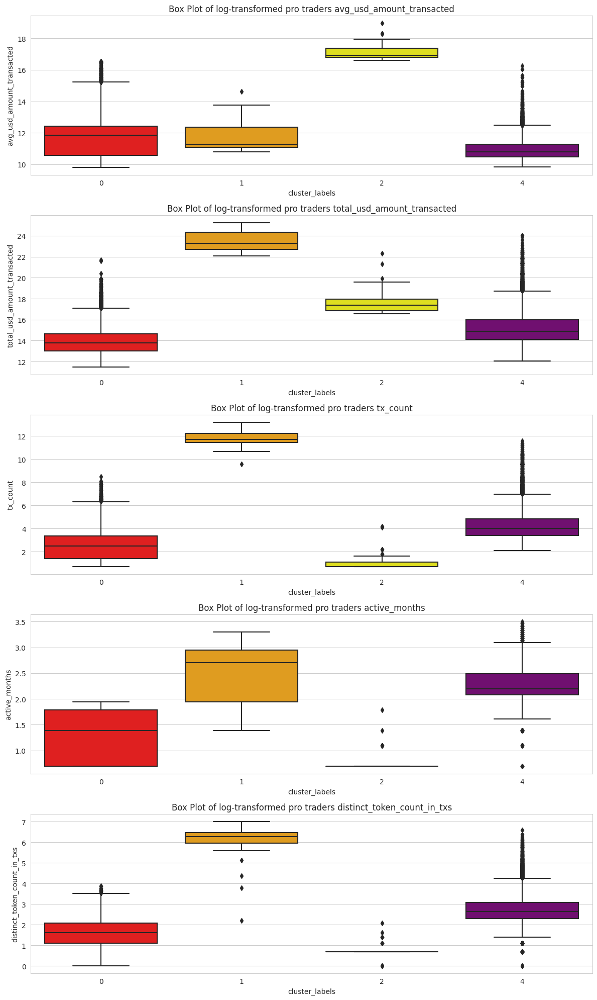

In [ ]:

# Create a figure with subplots for boxplots
fig, axes = plt.subplots(len(columns_to_plot), 1, figsize=(12, 4 * len(columns_to_plot)))

# Loop through the columns and create boxplots
for i, col in enumerate(columns_to_plot):
    sns.boxplot(x=df_uniswap_pro_traders['cluster_labels'], y=col, data=X_log_pro_traders, ax=axes[i], palette=custom_palette)
    axes[i].set_title(f"Box Plot of log-transformed pro traders {col}")

plt.tight_layout()
plt.show()

In [ ]:
#save df for further analysis
df_uniswap_pro_traders = df_uniswap_pro_traders.reset_index(drop=True)
df_uniswap_pro_traders.to_csv('/content/drive/My Drive/Bootcamp ML/Capstone/df_uniswap_pro_traders.csv')
df_uniswap_pro_traders

,tx_from,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted,cluster_labels
0,0x73f7092510e44915cb177684db7b1f101aeecb8d,371.00,6,2619550364.40,7060782.65,5,74,523910072.88,0
1,0x1261b1382399f383e8948bd66fa2aabab4bb48b4,2014.00,5,2445937055.26,1214467.26,5,402,489187411.05,0
2,0xab7b99998206d1ccf8b13b02b7566c267f4e2313,730.00,11,720377570.13,986818.59,5,146,144075514.03,0
3,0x2350375e130800b649edbb8d7c291235efaba212,85.00,16,445213352.20,5237804.14,3,28,148404450.73,0
4,0x45c5232b76ed9c6a70ec842a1e79d2d00eb58827,2633.00,8,436503928.00,165781.97,5,526,87300785.60,0
...,...,...,...,...,...,...,...,...,...
63099,0xb77cd1970963dacc0c44ec43497737d5eef5e51e,10.00,7,207033.56,20703.36,7,1,29576.22,4
63100,0xd0c77c135c2c85afd5fe289eb284c2f816a71ca1,7.00,1,205189.99,29312.86,7,1,29312.86,4
63101,0x62348764a99dd507395e476e3f05081c1dbcbfdb,8.00,6,194713.25,24339.16,7,1,27816.18,4
63102,0x0250ccb53c805dc6d06307282633fd1a151e566b,7.00,1,192870.32,27552.90,7,1,27552.90,4


In [ ]:
#test
df_uniswap_baseline


,tx_from,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted,cluster_labels
0,0xb58555fcba6479fced7de1485eb054943a09af7b,585248.00,565,333885754023.44,570503.02,17,34426,19640338471.97,3
1,0x26ce7c1976c5eec83ea6ac22d83cb341b08850af,544010.00,1114,93413356007.42,171712.57,19,28632,4916492421.44,1
2,0x7aa0426f10c7603bbfb8ceb8afb8d8c329ccfe8b,225383.00,385,82797756346.90,367364.69,16,14086,5174859771.68,1
3,0xa6ae57b1da8238cd149bc718c40578e4620b752c,282253.00,871,75558529891.35,267697.88,19,14855,3976764731.12,1
4,0x52b86a86e4d764e8275391c436127e60340a0e6a,320112.00,530,67199860810.47,209926.09,16,20007,4199991300.65,1
...,...,...,...,...,...,...,...,...,...
396575,0xfbc6f39da71d22e800f921e4b912913c00124332,1.00,1,17726.70,17726.70,1,1,17726.70,0
396576,0xd443fc34d51badcb7118a97e452f8776a39d3403,1.00,1,17726.66,17726.66,1,1,17726.66,0
396577,0x0d93b6922d47b148d24dd05456ef85a8be46ee89,1.00,1,17726.60,17726.60,1,1,17726.60,0
396578,0xce3ee9c115d7e817b25809b4acab8227f5620519,1.00,1,17726.59,17726.59,1,1,17726.59,0


In [ ]:
#test2
df_uniswap_baseline_no_outliers

,tx_from,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted,cluster_labels
0,0xb58555fcba6479fced7de1485eb054943a09af7b,585248.00,565,333885754023.44,570503.02,17,34426,19640338471.97,3
1,0x26ce7c1976c5eec83ea6ac22d83cb341b08850af,544010.00,1114,93413356007.42,171712.57,19,28632,4916492421.44,1
2,0x7aa0426f10c7603bbfb8ceb8afb8d8c329ccfe8b,225383.00,385,82797756346.90,367364.69,16,14086,5174859771.68,1
3,0xa6ae57b1da8238cd149bc718c40578e4620b752c,282253.00,871,75558529891.35,267697.88,19,14855,3976764731.12,1
4,0x52b86a86e4d764e8275391c436127e60340a0e6a,320112.00,530,67199860810.47,209926.09,16,20007,4199991300.65,1
...,...,...,...,...,...,...,...,...,...
354911,0xfbc6f39da71d22e800f921e4b912913c00124332,1.00,1,17726.70,17726.70,1,1,17726.70,0
354912,0xd443fc34d51badcb7118a97e452f8776a39d3403,1.00,1,17726.66,17726.66,1,1,17726.66,0
354913,0x0d93b6922d47b148d24dd05456ef85a8be46ee89,1.00,1,17726.60,17726.60,1,1,17726.60,0
354914,0xce3ee9c115d7e817b25809b4acab8227f5620519,1.00,1,17726.59,17726.59,1,1,17726.59,0


In [ ]:
df_uniswap_pro_traders

,tx_from,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted,cluster_labels
0,0x73f7092510e44915cb177684db7b1f101aeecb8d,371.00,6,2619550364.40,7060782.65,5,74,523910072.88,0
1,0x1261b1382399f383e8948bd66fa2aabab4bb48b4,2014.00,5,2445937055.26,1214467.26,5,402,489187411.05,0
2,0xab7b99998206d1ccf8b13b02b7566c267f4e2313,730.00,11,720377570.13,986818.59,5,146,144075514.03,0
3,0x2350375e130800b649edbb8d7c291235efaba212,85.00,16,445213352.20,5237804.14,3,28,148404450.73,0
4,0x45c5232b76ed9c6a70ec842a1e79d2d00eb58827,2633.00,8,436503928.00,165781.97,5,526,87300785.60,0
...,...,...,...,...,...,...,...,...,...
63099,0xb77cd1970963dacc0c44ec43497737d5eef5e51e,10.00,7,207033.56,20703.36,7,1,29576.22,4
63100,0xd0c77c135c2c85afd5fe289eb284c2f816a71ca1,7.00,1,205189.99,29312.86,7,1,29312.86,4
63101,0x62348764a99dd507395e476e3f05081c1dbcbfdb,8.00,6,194713.25,24339.16,7,1,27816.18,4
63102,0x0250ccb53c805dc6d06307282633fd1a151e566b,7.00,1,192870.32,27552.90,7,1,27552.90,4


In [ ]:
df_uniswap_pro_traders["cluster_labels"].unique()

array([0, 1, 4, 2], dtype=int32)

In [ ]:
df_uniswap_baseline.groupby('cluster_labels').size().sort_values( ascending = False)

cluster_labels
0    372449
4     24034
2        61
1        35
3         1
dtype: int64

In [ ]:
df_uniswap_pro_traders.groupby('cluster_labels').size().sort_values( ascending = False)

cluster_labels
0    38974
4    24034
2       61
1       35
dtype: int64

##Validation for number of clusters selected (k=5): K-Means Clustering Validation & DBSCAN

The code below the next three headings serves as a robustness test for the number of clusters we selected in our KMeans that eventually led to formation of above mentioned hypothesis

###Sampling

In [ ]:
X

,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
0,585248.00,565,333885754023.44,570503.02,17,34426,19640338471.97
1,544010.00,1114,93413356007.42,171712.57,19,28632,4916492421.44
2,225383.00,385,82797756346.90,367364.69,16,14086,5174859771.68
3,282253.00,871,75558529891.35,267697.88,19,14855,3976764731.12
4,320112.00,530,67199860810.47,209926.09,16,20007,4199991300.65
...,...,...,...,...,...,...,...
396575,1.00,1,17726.70,17726.70,1,1,17726.70
396576,1.00,1,17726.66,17726.66,1,1,17726.66
396577,1.00,1,17726.60,17726.60,1,1,17726.60
396578,1.00,1,17726.59,17726.59,1,1,17726.59


In [ ]:
X_sample = X.sample(n=38729) #start with large sample (plus minus 10% of original dataset)

In [ ]:
X_sample.describe()

,tx_count,distinct_token_count_in_txs,total_usd_amount_transacted,avg_usd_amount_transacted,active_months,monthly_txns_count,monthly_usd_amount_transacted
count,38729.00,38729.00,38729.00,38729.00,38729.00,38729.00,38729.00
mean,63.74,3.62,10398234.66,70749.86,2.15,7.04,913847.58
std,3527.59,12.91,757929874.02,648226.24,2.36,199.08,44159359.23
min,1.00,0.00,17726.66,17726.66,1.00,1.00,17726.66
25%,1.00,1.00,39387.24,23247.20,1.00,1.00,34694.45
50%,2.00,2.00,97861.76,31369.13,1.00,2.00,67037.29
75%,7.00,3.00,341576.52,50735.20,2.00,3.00,165166.68
max,544010.00,1114.00,93413356007.42,87090039.60,29.00,28632.00,5174859771.68


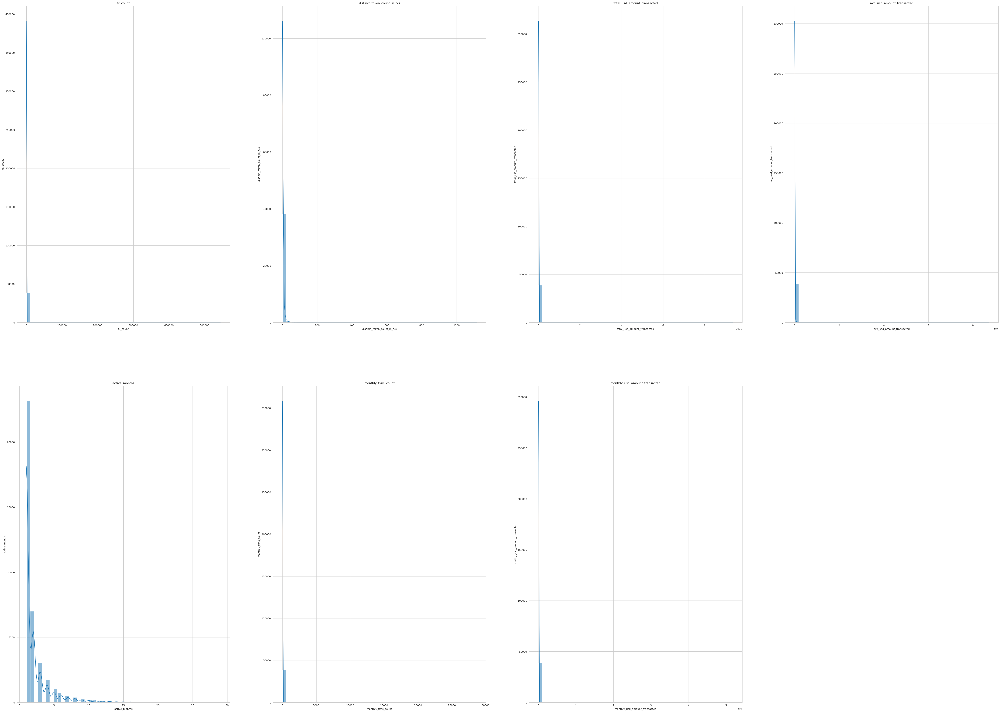

In [ ]:
#quick validation of sample chosen
plot_distrib(X_sample)

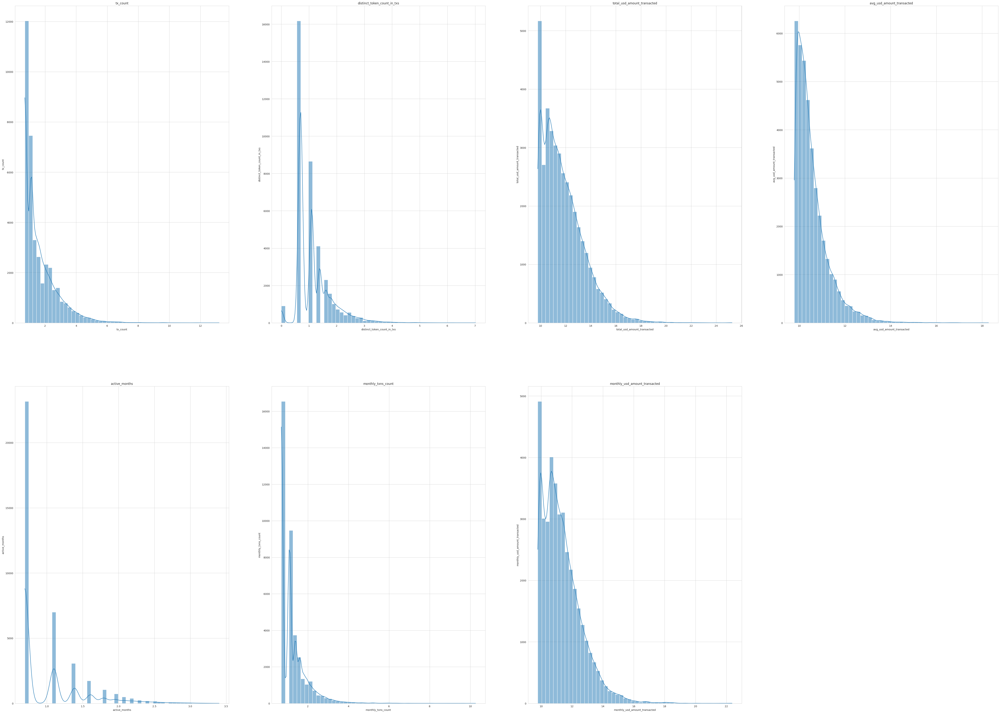

In [ ]:
plot_distrib(X_sample.apply(lambda x: np.log(x+ 1)))

###K-means complete evaluation metrics (ellbow, silhouette)

[]

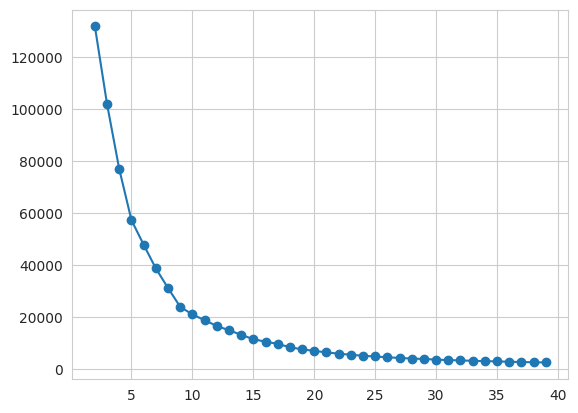

In [ ]:
#ellbow method
ss = [] #the sum of squares
clusters = 40

for cluster_number in range(2, clusters):
    kmeans_sample_pipeline = Pipeline([("scaler", StandardScaler()),("cluster", KMeans(n_clusters =cluster_number, random_state = 42,  n_init=10))])
    kmeans_sample_pipeline.fit(X_sample)
    ss.append(kmeans_sample_pipeline.named_steps["cluster"].inertia_)

plt.plot(range(2,clusters), ss, marker = "o")
plt.plot()

[]

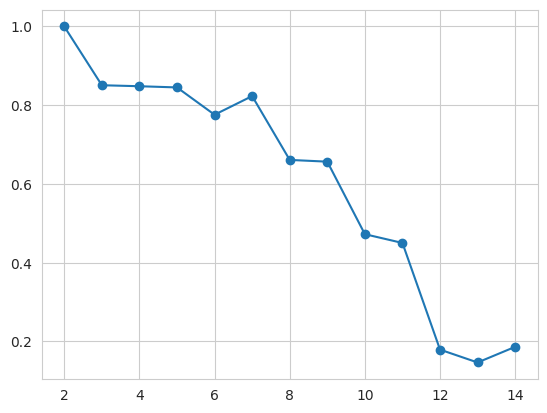

In [ ]:
#silhouette score
from sklearn.metrics import silhouette_score, silhouette_samples

silhouette = [] #the sum of squares
clusters = 15

for cluster_number in range(2, clusters):
    kmeans_sample_pipeline = Pipeline([("scaler", StandardScaler()),("cluster", KMeans(n_clusters =cluster_number, random_state = 42, n_init=10))])
    kmeans_sample_pipeline.fit(X_sample)
    cluster_labels = kmeans_sample_pipeline.predict(X_sample)
    silhouette.append(silhouette_score(X_sample,cluster_labels))


plt.plot(range(2,clusters), silhouette, marker = "o")
plt.plot()



[]

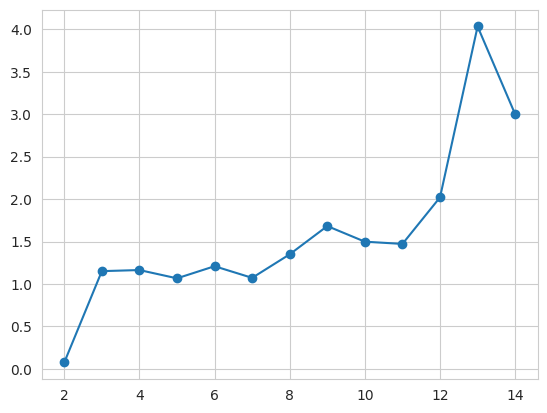

In [ ]:
# davies_bouldin_score
from sklearn.metrics import davies_bouldin_score

dbi = []
for k in range(2,15):
    kmeans_sample_pipeline = Pipeline([("scaler", StandardScaler()),("cluster", KMeans(n_clusters =k, random_state = 42,  n_init=10))])
    kmeans_sample_pipeline.fit(X_sample)
    cluster_labels = kmeans_sample_pipeline.predict(X_sample)
    dbi.append(davies_bouldin_score(X_sample, cluster_labels))

plt.plot(range(2,15), dbi, marker = "o")
plt.plot()


[]

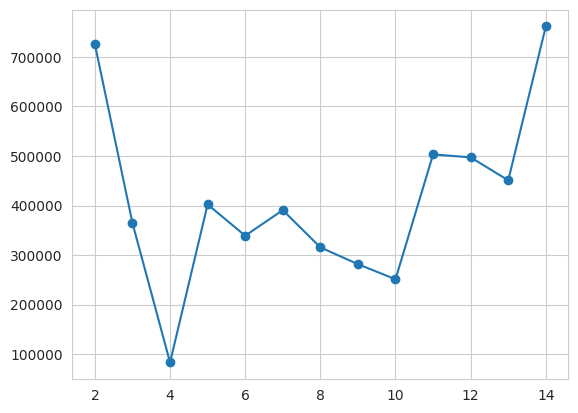

In [ ]:
from sklearn.metrics import calinski_harabasz_score

chi = []

for k in range(2,15):
    kmeans_sample_pipeline = Pipeline([("scaler", StandardScaler()),("cluster", KMeans(n_clusters =k, random_state = 42,  n_init=10))])
    kmeans_sample_pipeline.fit(X_sample)
    cluster_labels = kmeans_sample_pipeline.predict(X_sample)
    chi.append(calinski_harabasz_score(X_sample, cluster_labels))

plt.plot(range(2,15), chi, marker = "o")
plt.plot()



For n_clusters = 2 The average silhouette_score is : 0.9999
For n_clusters = 3 The average silhouette_score is : 0.8507
For n_clusters = 4 The average silhouette_score is : 0.8503
For n_clusters = 5 The average silhouette_score is : 0.8451
For n_clusters = 6 The average silhouette_score is : 0.7756
For n_clusters = 7 The average silhouette_score is : 0.8218
For n_clusters = 8 The average silhouette_score is : 0.6595
For n_clusters = 9 The average silhouette_score is : 0.6566
For n_clusters = 10 The average silhouette_score is : 0.4627
For n_clusters = 11 The average silhouette_score is : 0.4408
For n_clusters = 12 The average silhouette_score is : 0.4395
For n_clusters = 13 The average silhouette_score is : 0.186
For n_clusters = 14 The average silhouette_score is : 0.4428




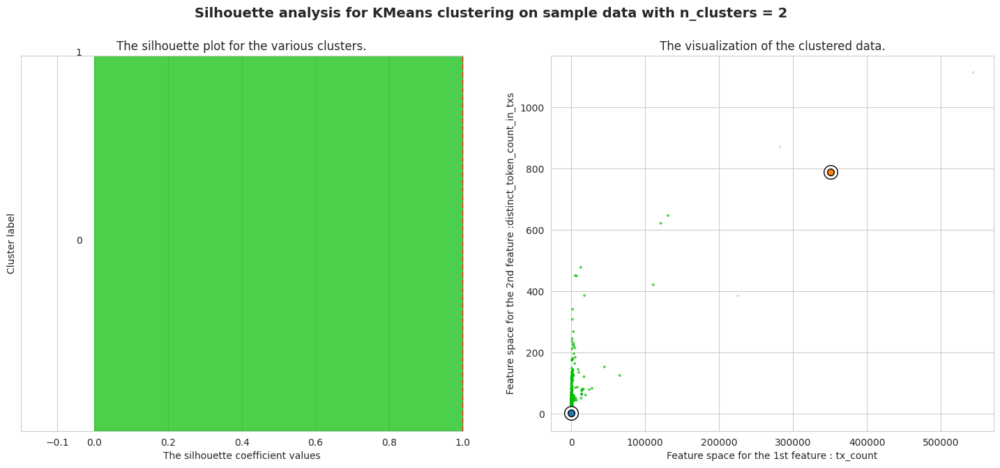

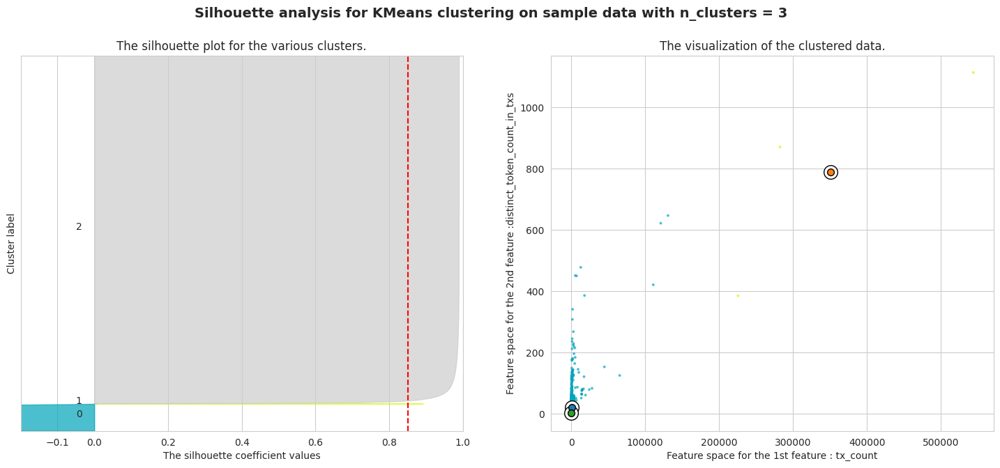

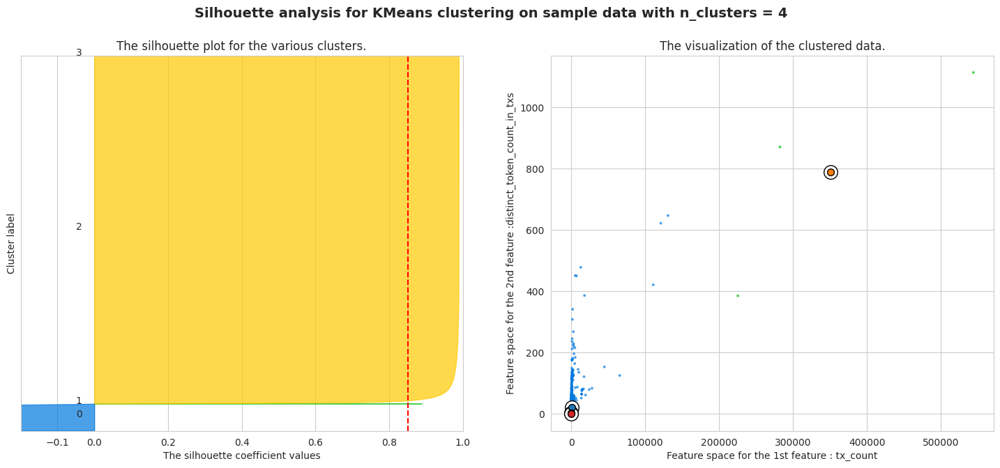

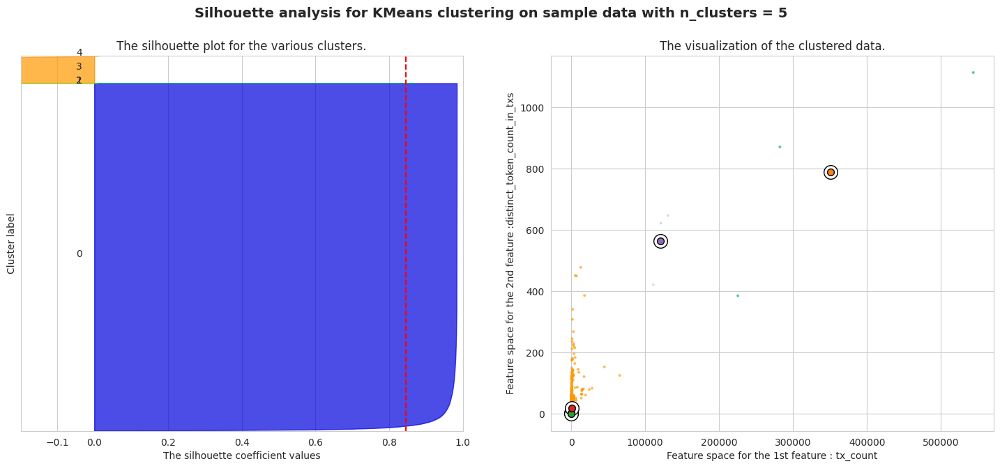

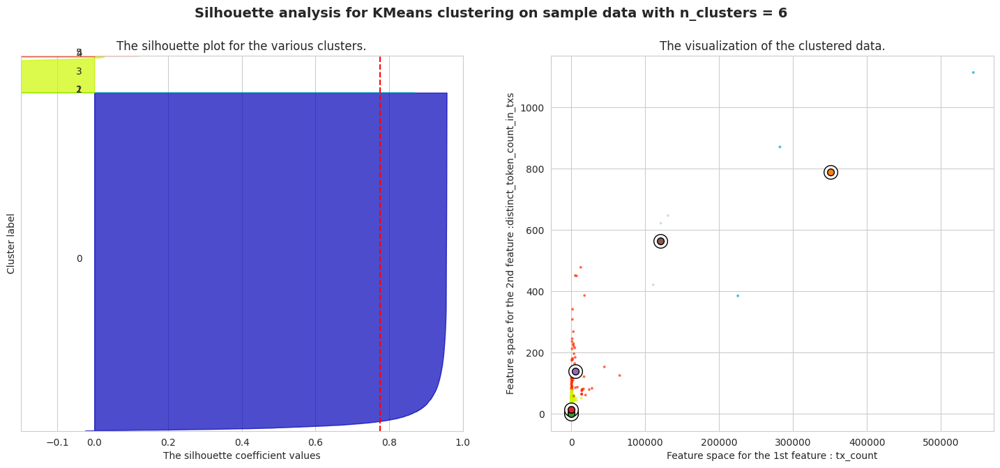

...

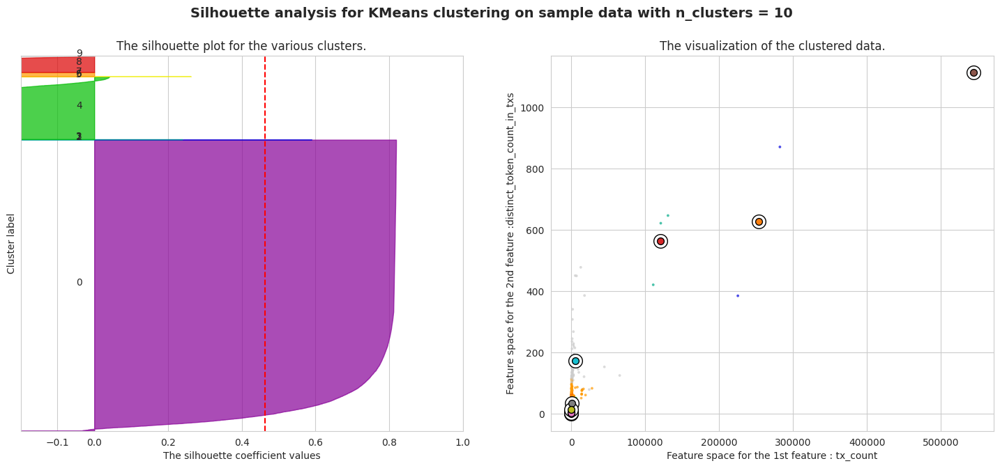

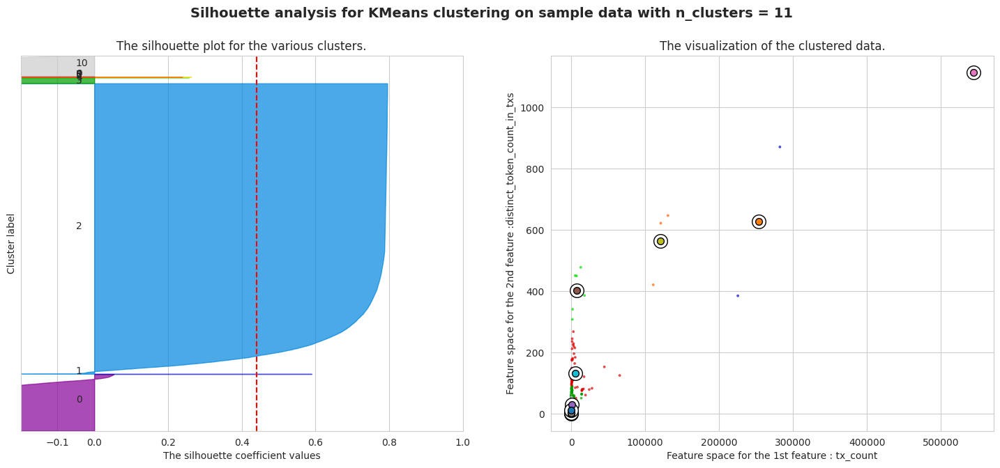

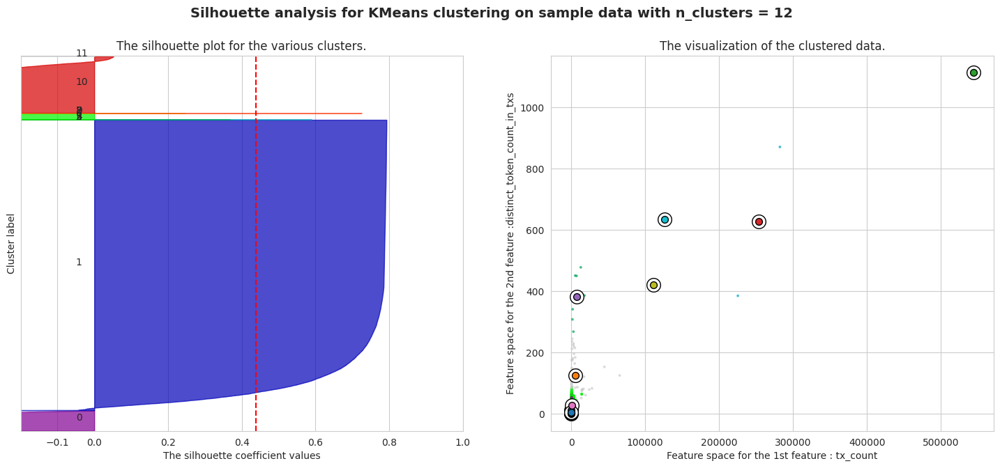

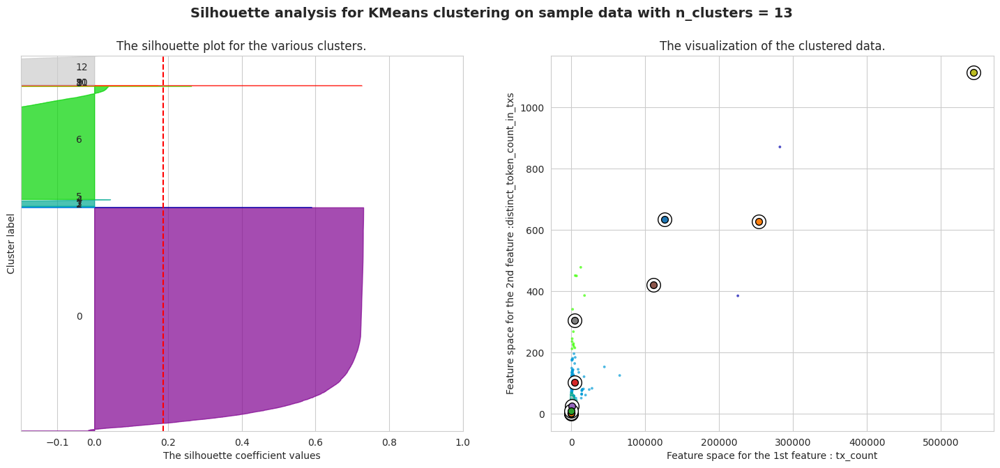

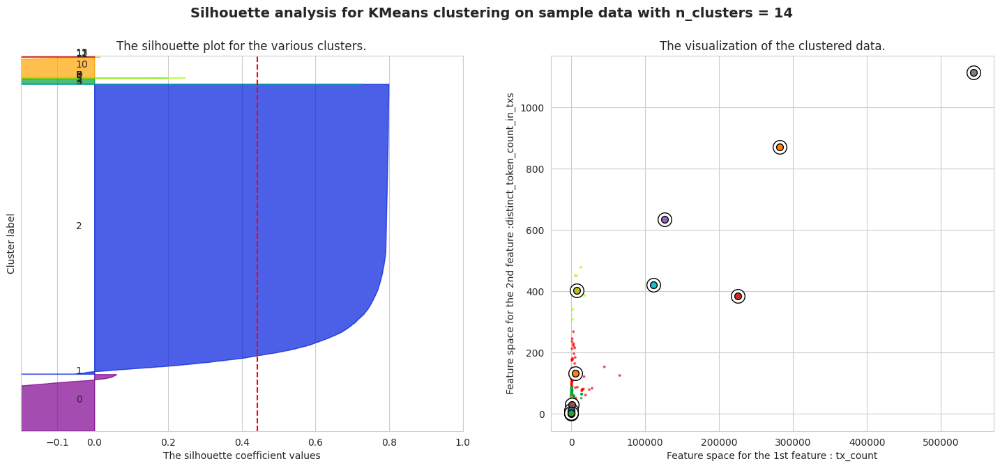

In [ ]:
from sklearn.metrics import silhouette_score, silhouette_samples
import matplotlib.cm as cm


range_n_clusters = range(2, 15)

r_seed = 17

cols = X_sample.columns

for n_clusters in range_n_clusters:

    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot

    # The silhouette coefficient can range from -1, 1 but in this example all lie within [-0.2, 1]
    ax1.set_xlim([-0.2, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X_sample) + (n_clusters + 1) * 10])

    # Initialize the Pipeline with n_clusters value and a random generator seed for reproducibility.
    kmeans_pipeline = Pipeline([
            ("scaler", StandardScaler()),
            ("cluster", KMeans(n_clusters=n_clusters, random_state=r_seed,  n_init=10))])

    cluster_labels = kmeans_pipeline.fit_predict(X_sample)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(X_sample, cluster_labels)
    print("For n_clusters =",
          n_clusters,
          "The average silhouette_score is :",
          silhouette_avg.round(4))

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X_sample, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i + 1) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0,
                          ith_cluster_silhouette_values,
                          facecolor=color,
                          edgecolor=color,
                          alpha=0.7)

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral((cluster_labels.astype(float) + 1) / n_clusters)
    ax2.scatter(X_sample.iloc[:, 0],
                X_sample.iloc[:, 1],
                marker=".",
                s=30,
                lw=0,
                alpha=0.7,
                c=colors,
                edgecolor="k")

    # Labeling the clusters
    pipeline_centers = kmeans_pipeline.named_steps["cluster"].cluster_centers_
    centers = kmeans_pipeline.named_steps["scaler"].inverse_transform(pipeline_centers)
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature : " + cols[0])
    ax2.set_ylabel("Feature space for the 2nd feature :" + cols[1])

    plt.suptitle(
        (
            "Silhouette analysis for KMeans clustering on sample data "
            "with n_clusters = %d" % n_clusters
        ),
        fontsize=14,
        fontweight="bold",
    )
print("\n")
plt.show()

**Insights**:

*   Either cluster sizes of around 3 or 10 across the different scores perform well in K-means.



###DBSCAN

In [ ]:

from sklearn.cluster import DBSCAN

# Define the pipeline
dbscan_pipeline = Pipeline([
    ("scaler", StandardScaler()),
    ("dbscan", DBSCAN(eps=0.5, min_samples=5))
])

# Fit the data
dbscan_pipeline.fit(X_sample)

# Get cluster labels from the 'dbscan' step of the pipeline
cluster_labels = dbscan_pipeline.named_steps['dbscan'].labels_

# Number of clusters in labels, ignoring noise (outliers) if present
n_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)
n_noise = list(cluster_labels).count(-1)

print(f"Estimated number of clusters: {n_clusters}")
print(f"Estimated number of noise points: {n_noise}")

Estimated number of clusters: 7
Estimated number of noise points: 259


## **Going forward**

**Notebook 1: Baseline Analysis (Non-Log)** ✅
* Content: Comprehensive analysis of the baseline dataset.
* Purpose: Establish initial insights, clustering, and baseline understanding of the data.
* Data: Baseline dataset with outliers, non-log transformed.
* Analysis: K-means clustering, basic visualization, and deriving initial insights.

Note: This notebook sets the stage for my analysis, providing the foundational understanding of the dataset's characteristics.

**Notebook 2: Baseline Analysis with Log Transformation (Robustness Check)**
* Content: Analysis of the baseline dataset with log transformation.
* Purpose: Test the robustness of initial insights and clustering in the log-transformed data space.
* Data: Baseline dataset with outliers, log-transformed.
* Analysis: Reapply K-means clustering and compare clusters and insights with those from the non-log transformed baseline (Notebook 1).

Note: This notebook assesses how log transformation impacts the clustering and insights, serving as a robustness check.

**Notebook 3: Baseline Analysis without Outliers (Robustness Check)**
* Content: Repeat the baseline analysis excluding outliers.
* Purpose: Further validate the robustness of the initial insights without the influence of outliers.
* Data: Baseline dataset without outliers, non-log transformed.
* Analysis: K-means clustering, visualization, and insights comparison with Notebook 1.

Note: Focuses on understanding the impact of outliers on my baseline analysis.

**Notebook 4: Pro Traders Analysis (Non-Log)**
* Content: Detailed analysis of the pro traders subset.
* Purpose: Deep dive into the pro traders segment, exploring their characteristics and behaviors.
* Data: Data subset for pro traders, non-log transformed.
* Analysis: Descriptive statistics, EDA, and clustering.

Note: Primary focus on EDA and clustering, considering non-log data might not be as effective for advanced visualizations.

**Notebook 5: Pro Traders Analysis (Log-Transformed)**
* Content: In-depth analysis of the pro traders subset using log-transformed data.
* Purpose: To explore how log transformation affects the insights, robustness check for EDA and K-means clustering, and focus on advanced visualizations.
* Data: Log-transformed data subset for pro traders.
* Analysis: Descriptive statistics, EDA, clustering, and advanced visualizations (e.g., UMAP, t-SNE).

Note: Investigate how log transformation influences the understanding of pro traders, with a particular focus on revealing patterns through advanced visualizations.

#Archive

Ignore the following three headings (+ code) for now and delete them once we have recreated the pro traders visualization

##T-SNE

consider pca before t-sne before. try different perplexity levels, try to increase exageration, do eda and look at correlation of features, consider just looking at one protocol.

In [ ]:
from sklearn.manifold import TSNE
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

low perplexity

In [ ]:
t_sne_pipeline = Pipeline([("scaler", StandardScaler()),("tsne", TSNE(n_components=2, perplexity=30, n_iter=5000))])

X_tsne = t_sne_pipeline.fit_transform(X_sample)


<ipython-input-168-05a80bce6429>:10: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(X_tsne[:, 0], X_tsne[:, 1], cmap=plt.cm.Spectral)


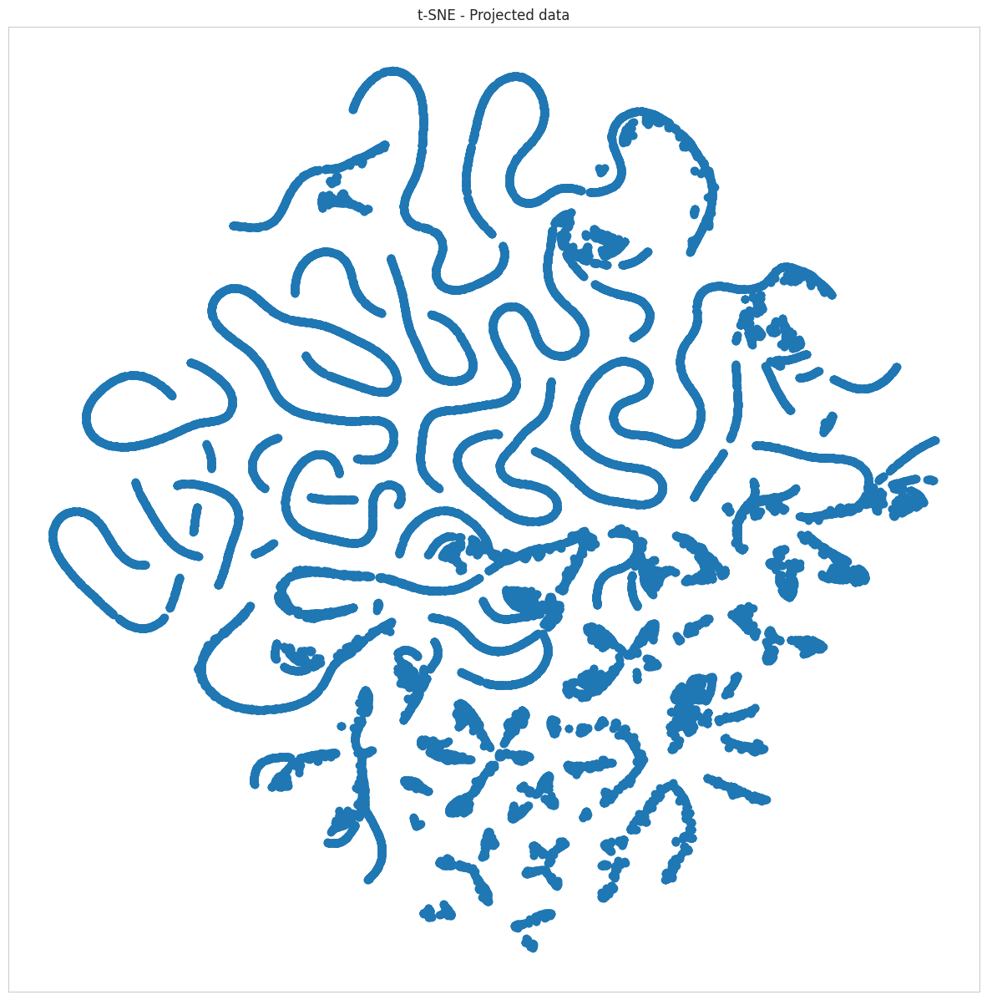

In [ ]:
fig = plt.figure(figsize =(15, 15))

# plot original roll
# ax = fig.add_subplot(211, projection='3d')
# ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=color, cmap=plt.cm.Spectral)
# ax.set_title("Original data")

# plot projected roll
ax = fig.add_subplot()
ax.scatter(X_tsne[:, 0], X_tsne[:, 1], cmap=plt.cm.Spectral)
plt.axis('tight')
plt.xticks([]), plt.yticks([])
plt.title('t-SNE - Projected data')
plt.show()

medium perplexity value

In [ ]:
t_sne_pipeline = Pipeline([("scaler", StandardScaler()),("tsne", TSNE(n_components=2, perplexity=50, n_iter=5000))])

X_tsne = t_sne_pipeline.fit_transform(X_sample)

<ipython-input-170-a53af4348cd6>:5: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(X_tsne[:, 0], X_tsne[:, 1], cmap=plt.cm.Spectral)


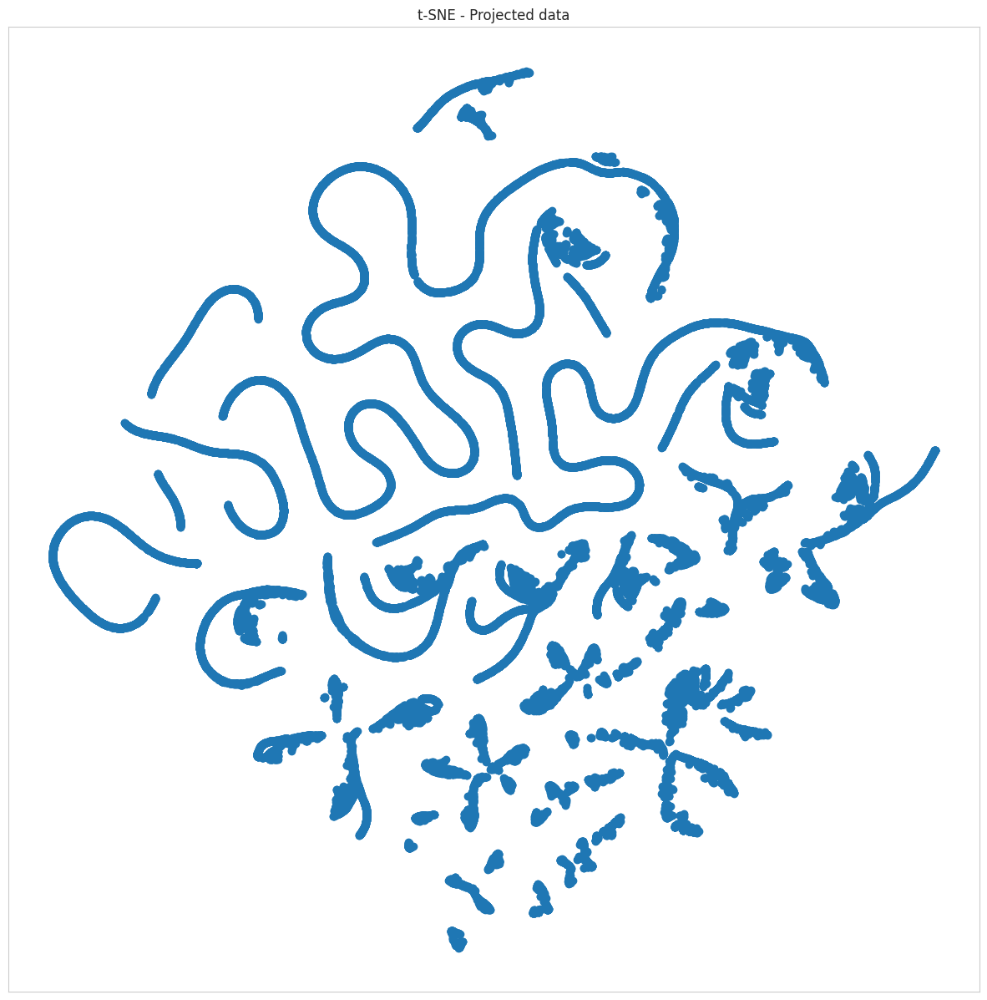

In [ ]:
fig = plt.figure(figsize =(15, 15))

# plot projected roll
ax = fig.add_subplot()
ax.scatter(X_tsne[:, 0], X_tsne[:, 1], cmap=plt.cm.Spectral)
plt.axis('tight')
plt.xticks([]), plt.yticks([])
plt.title('t-SNE - Projected data')
plt.show()

In [ ]:
#med high

t_sne_pipeline = Pipeline([("scaler", StandardScaler()),("tsne", TSNE(n_components=2, perplexity=100, n_iter=5000))])

X_tsne = t_sne_pipeline.fit_transform(X_sample)



<ipython-input-172-05a80bce6429>:10: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(X_tsne[:, 0], X_tsne[:, 1], cmap=plt.cm.Spectral)


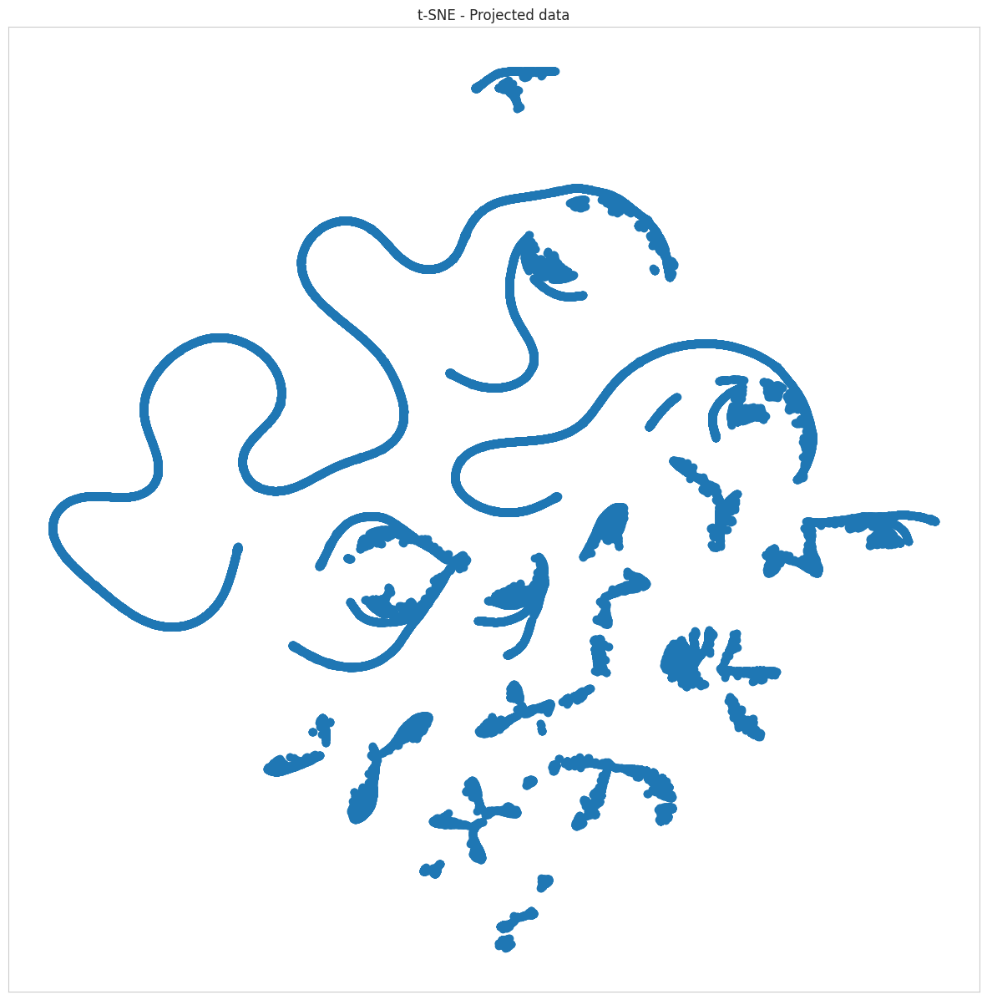

In [ ]:
fig = plt.figure(figsize =(15, 15))

# plot original roll
# ax = fig.add_subplot(211, projection='3d')
# ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=color, cmap=plt.cm.Spectral)
# ax.set_title("Original data")

# plot projected roll
ax = fig.add_subplot()
ax.scatter(X_tsne[:, 0], X_tsne[:, 1], cmap=plt.cm.Spectral)
plt.axis('tight')
plt.xticks([]), plt.yticks([])
plt.title('t-SNE - Projected data')
plt.show()

High perplexity value

In [ ]:


#p = 200

t_sne_pipeline = Pipeline([("scaler", StandardScaler()),("tsne", TSNE(n_components=2, perplexity=200, n_iter=5000))])

X_tsne = t_sne_pipeline.fit_transform(X_sample)


<ipython-input-174-05a80bce6429>:10: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(X_tsne[:, 0], X_tsne[:, 1], cmap=plt.cm.Spectral)


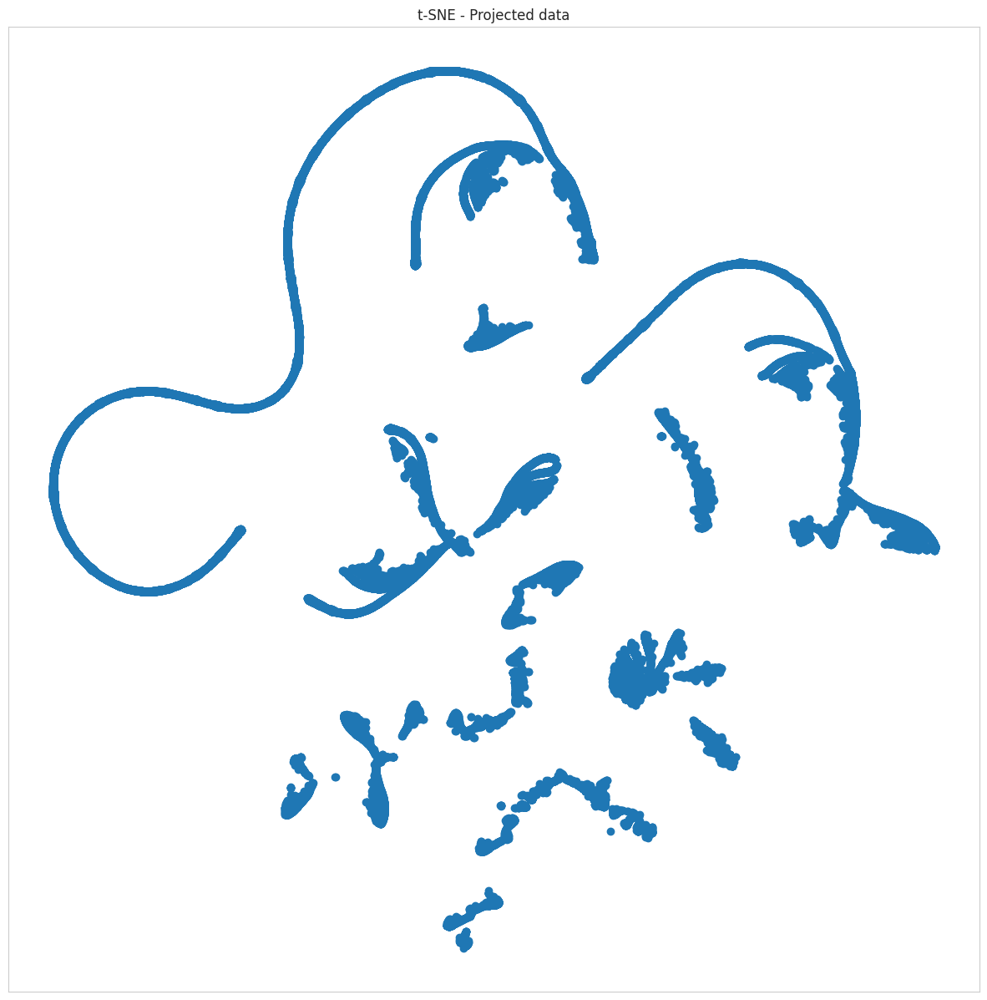

In [ ]:


fig = plt.figure(figsize =(15, 15))

# plot original roll
# ax = fig.add_subplot(211, projection='3d')
# ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=color, cmap=plt.cm.Spectral)
# ax.set_title("Original data")

# plot projected roll
ax = fig.add_subplot()
ax.scatter(X_tsne[:, 0], X_tsne[:, 1], cmap=plt.cm.Spectral)
plt.axis('tight')
plt.xticks([]), plt.yticks([])
plt.title('t-SNE - Projected data')
plt.show()


###PCA to reduce sample on the main principal components and then visualize it using perplexity 200 -> this seems to be valid with dbscan cluster amounts of 130+ clusters


In [ ]:
#tsne and pca with n_princ_comp = 10

tsne_pca_pipeline = Pipeline([("scaler", StandardScaler()),("pca", PCA(n_components = 4)), ("tsne",TSNE(n_components=2, perplexity=200, n_iter=5000))])

tsne_pca = tsne_pca_pipeline.fit_transform(X_sample)

<ipython-input-176-27c12eecb773>:10: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(tsne_pca[:, 0], tsne_pca[:, 1], cmap=plt.cm.Spectral)


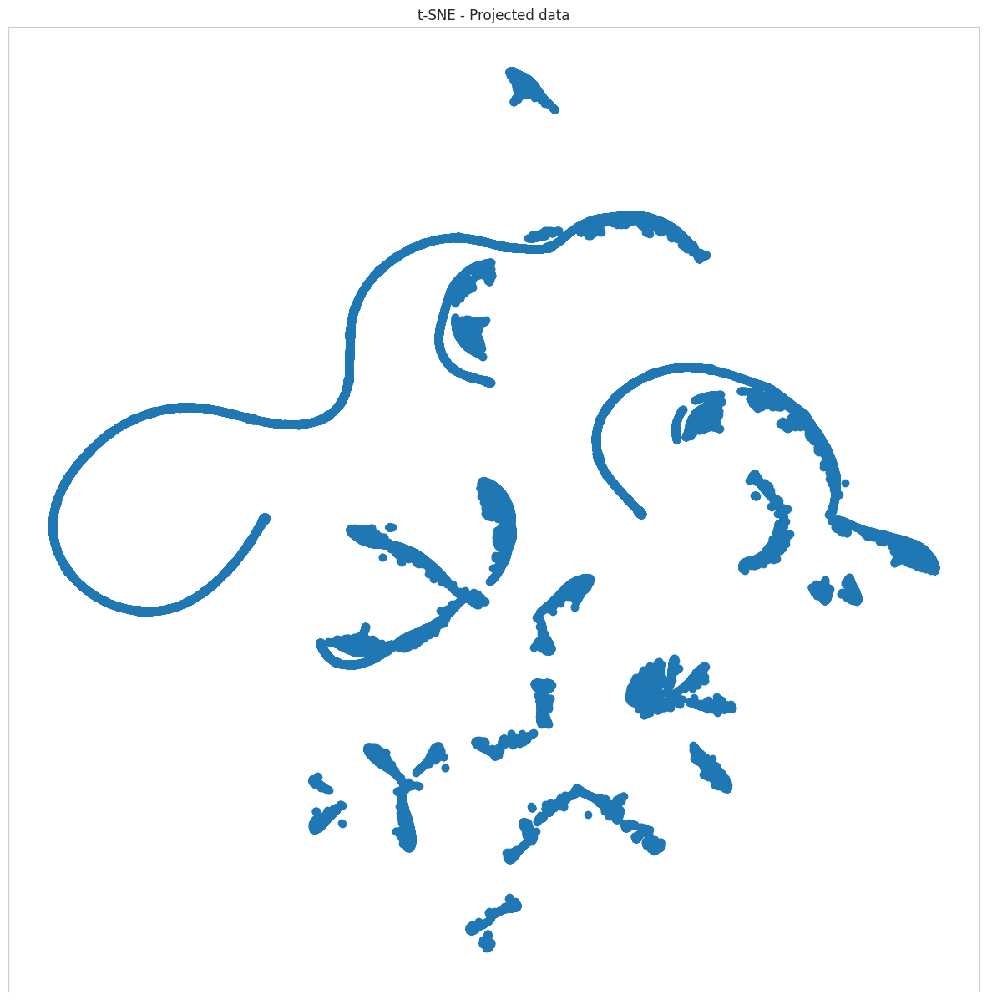

In [ ]:
fig = plt.figure(figsize =(15, 15))

# plot original roll
# ax = fig.add_subplot(211, projection='3d')
# ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=color, cmap=plt.cm.Spectral)
# ax.set_title("Original data")

# plot projected roll
ax = fig.add_subplot()
ax.scatter(tsne_pca[:, 0], tsne_pca[:, 1], cmap=plt.cm.Spectral)
plt.axis('tight')
plt.xticks([]), plt.yticks([])
plt.title('t-SNE - Projected data')
plt.show()

In [ ]:
#p = 500

t_sne_pipeline = Pipeline([("scaler", StandardScaler()),("tsne", TSNE(n_components=2, perplexity=500, n_iter=5000))])

X_tsne = t_sne_pipeline.fit_transform(X_sample)


<ipython-input-178-05a80bce6429>:10: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(X_tsne[:, 0], X_tsne[:, 1], cmap=plt.cm.Spectral)


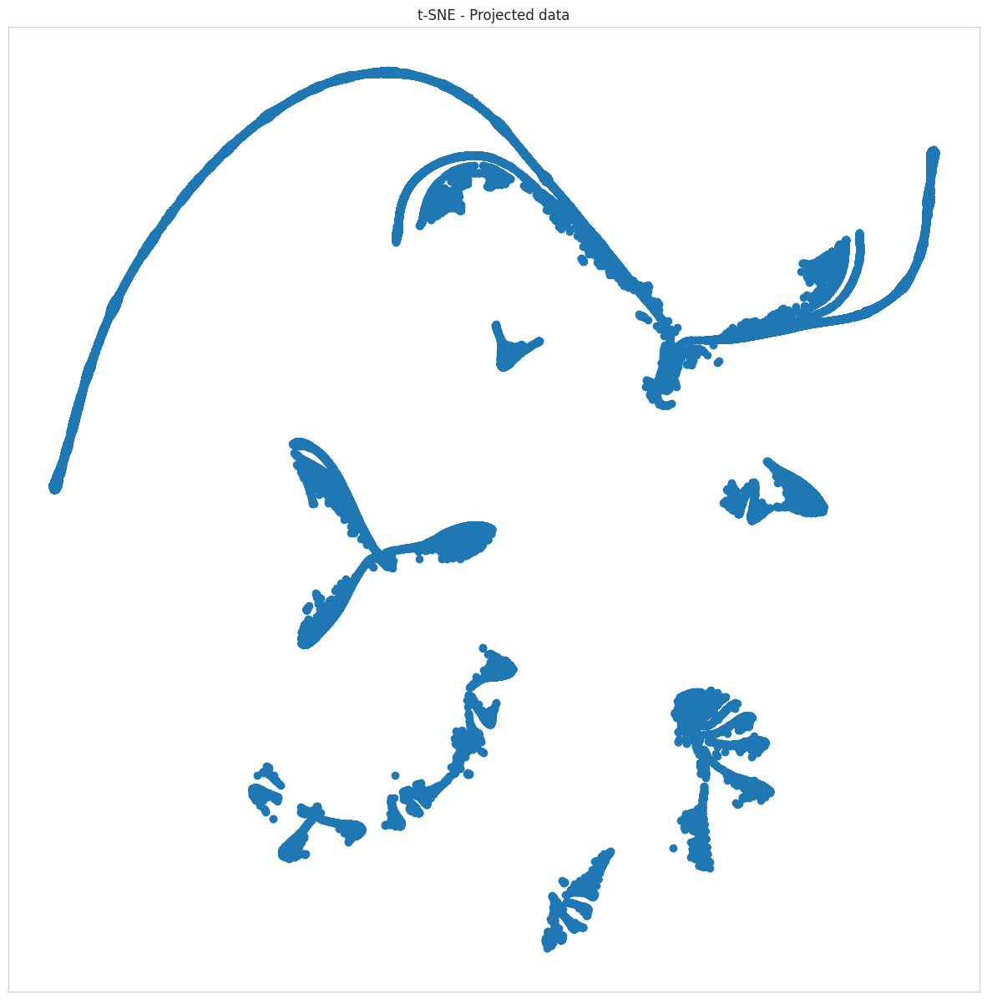

In [ ]:

fig = plt.figure(figsize =(15, 15))

# plot original roll
# ax = fig.add_subplot(211, projection='3d')
# ax.scatter(X[:, 0], X[:, 1], X[:, 2], c=color, cmap=plt.cm.Spectral)
# ax.set_title("Original data")

# plot projected roll
ax = fig.add_subplot()
ax.scatter(X_tsne[:, 0], X_tsne[:, 1], cmap=plt.cm.Spectral)
plt.axis('tight')
plt.xticks([]), plt.yticks([])
plt.title('t-SNE - Projected data')
plt.show()

Very high perplexitiy value: high amount of neighrest neighbours < sample size

##UMAP

###UMAP for visualization

In [ ]:
!pip install umap-learn



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.9/90.9 kB 3.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.8/55.8 kB 5.3 MB/s eta 0:00:00
  Created wheel for umap-learn: filename=umap_learn-0.5.5-py3-none-any.whl size=86831 sha256=a329176f6d472a6ad70a3e6af0e05abe8fe4f1bf65899c6e5b25451449ab3520
  Stored in directory: /root/.cache/pip/wheels/3a/70/07/428d2b58660a1a3b431db59b806a10da736612ebbc66c1bcc5
Successfully built umap-learn


In [ ]:
from sklearn.manifold import TSNE
from umap import UMAP



In [ ]:
#focus on local structure
umap_embeddings_local = UMAP(n_neighbors=15, n_components=2,  min_dist= 0.01)
#focus on global structure
umap_embeddings_global = UMAP(n_neighbors=100, n_components=2,  min_dist= 0.5)

#fit transform data set
X_umap_local = umap_embeddings_local.fit_transform(X_sample)
X_umap_global = umap_embeddings_global.fit_transform(X_sample)

<ipython-input-182-4c895586991b>:2: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_umap_local[:, 0], X_umap_local[:, 1],cmap=plt.cm.Spectral)


Text(0.5, 1.0, 'Local Focus UMAP - Projected data')

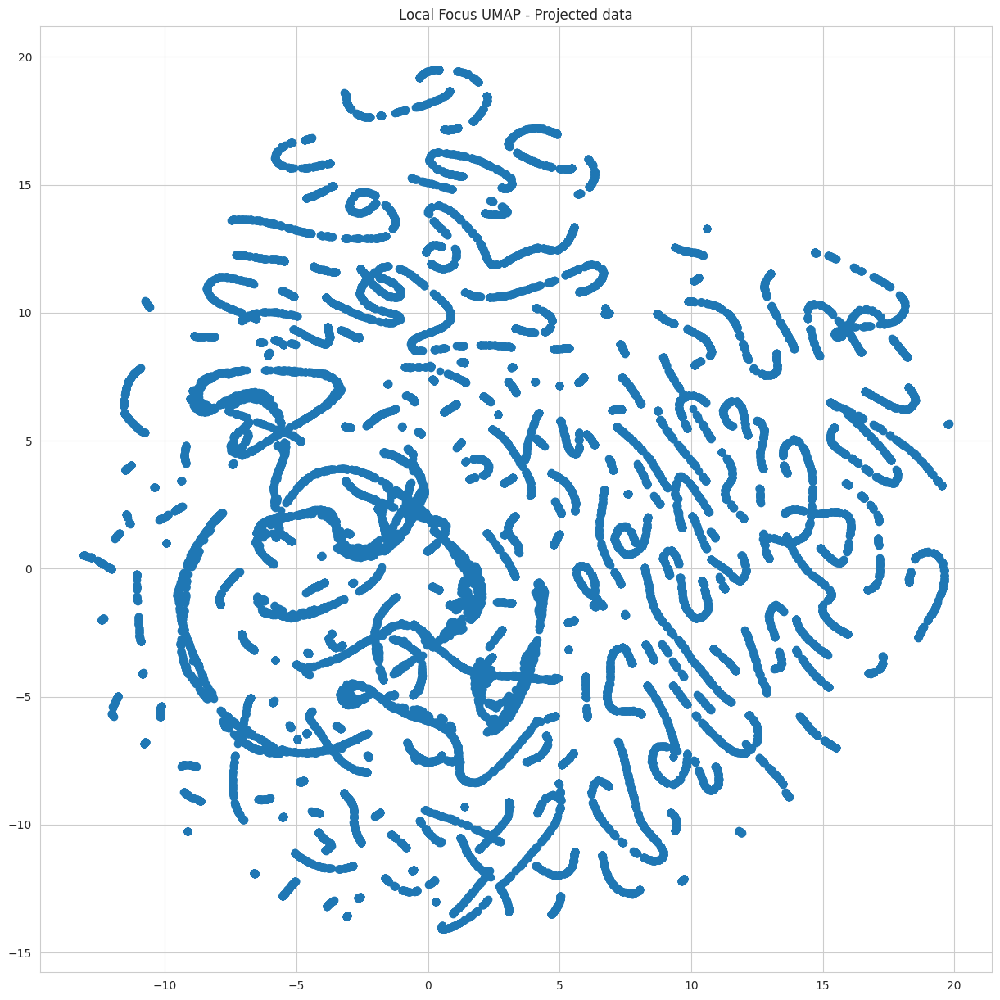

In [ ]:
fig = plt.figure(figsize =(15, 15))
plt.scatter(X_umap_local[:, 0], X_umap_local[:, 1],cmap=plt.cm.Spectral)
plt.title('Local Focus UMAP - Projected data')

<ipython-input-183-700818fce08d>:2: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_umap_global[:, 0], X_umap_global[:, 1],cmap=plt.cm.Spectral)


Text(0.5, 1.0, 'Gloabl Focus UMAP - Projected data')

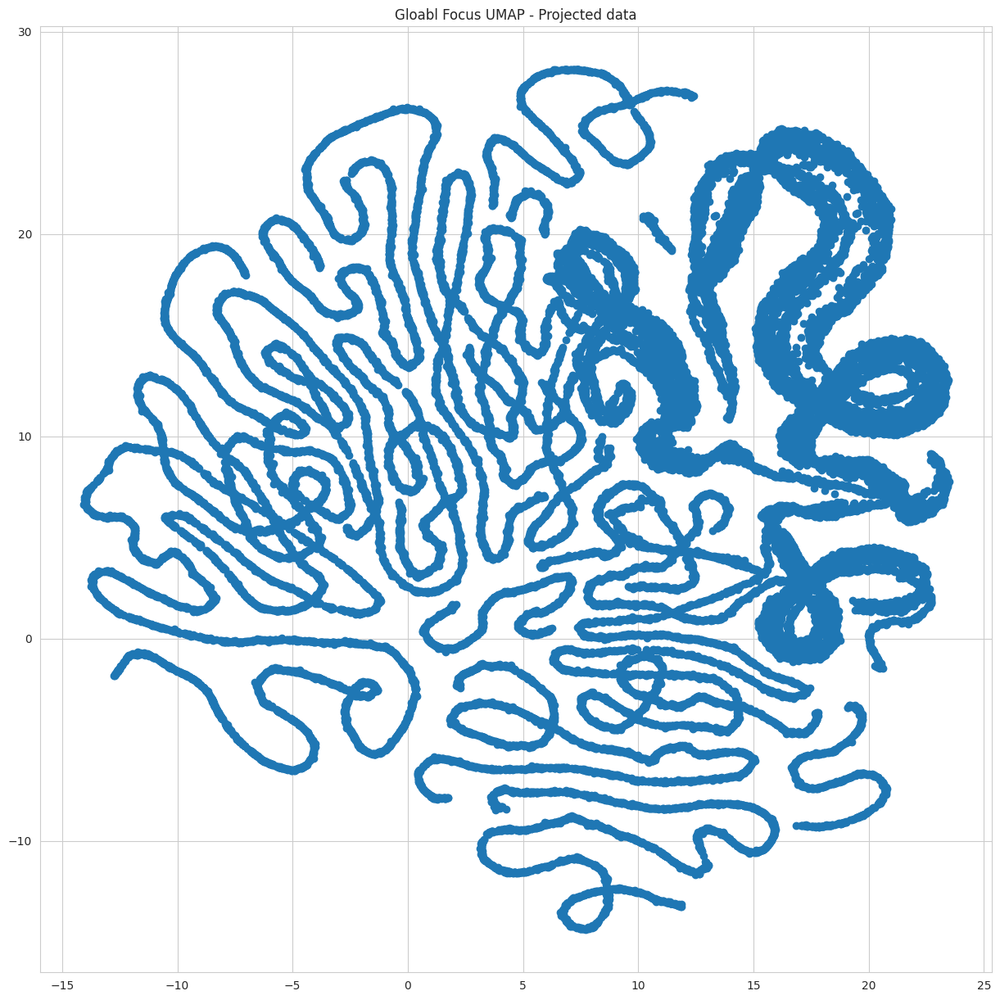

In [ ]:
fig = plt.figure(figsize =(15, 15))
plt.scatter(X_umap_global[:, 0], X_umap_global[:, 1],cmap=plt.cm.Spectral)
plt.title('Gloabl Focus UMAP - Projected data')

#### Use pca to reduce noise and keep most of the variance

In [ ]:

umap_local_pca_embeddings = Pipeline([("scaler", StandardScaler()),("pca", PCA(n_components = 4)), ("umap",UMAP(n_neighbors=15, n_components=2,  min_dist= 0.01))])

umap_global_pca_embeddings =  Pipeline([("scaler", StandardScaler()),("pca", PCA(n_components = 4)), ("umap", UMAP(n_neighbors=100, n_components=2,  min_dist= 0.5))])


#fit transform data set
X_umap_pca_local = umap_local_pca_embeddings.fit_transform(X_sample)
X_umap_pca_global = umap_global_pca_embeddings.fit_transform(X_sample)



<ipython-input-185-36e632b8430a>:2: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_umap_pca_local[:, 0], X_umap_pca_local[:, 1],cmap=plt.cm.Spectral)


Text(0.5, 1.0, 'Local Focus UMAP after pca - Projected data')

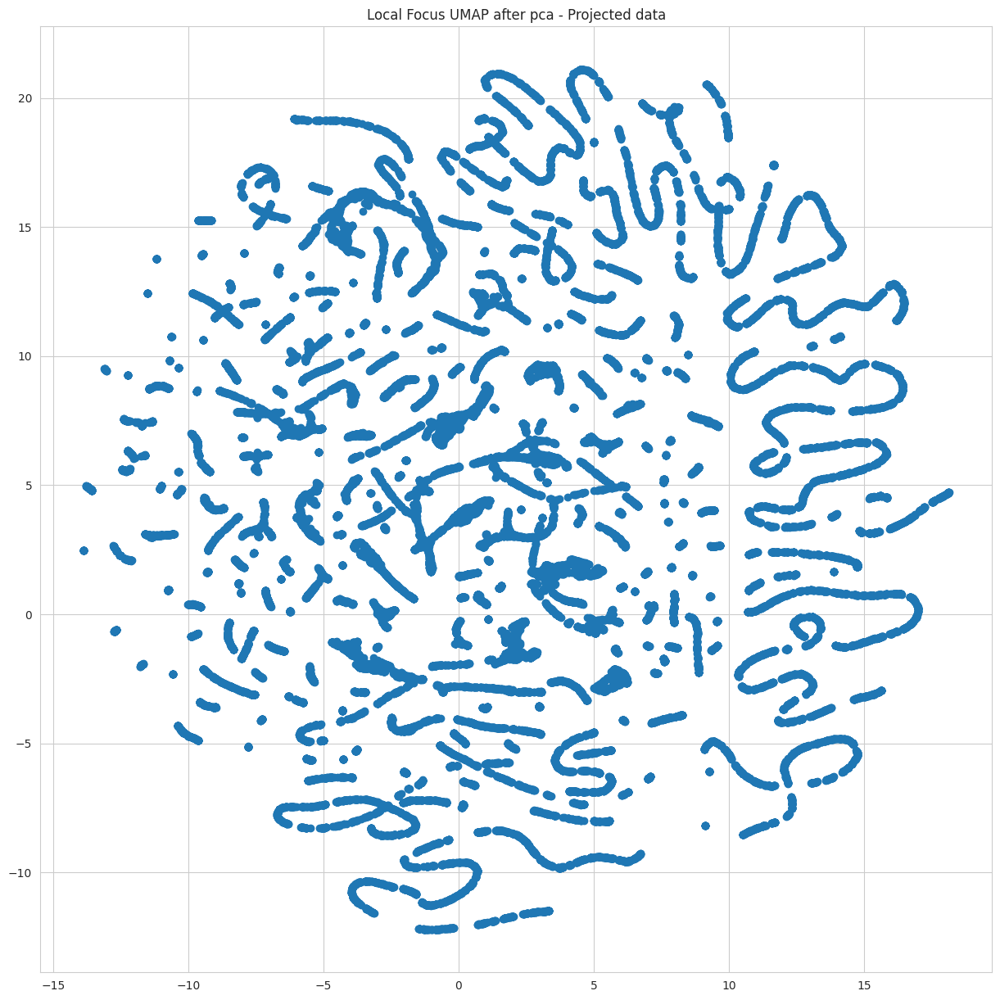

In [ ]:
fig = plt.figure(figsize =(15, 15))
plt.scatter(X_umap_pca_local[:, 0], X_umap_pca_local[:, 1],cmap=plt.cm.Spectral)
plt.title('Local Focus UMAP after pca - Projected data')

<ipython-input-186-11fe7bad8d9c>:2: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(X_umap_pca_global[:, 0], X_umap_pca_global[:, 1],cmap=plt.cm.Spectral)


Text(0.5, 1.0, 'Global Focus UMAP after pca - Projected data')

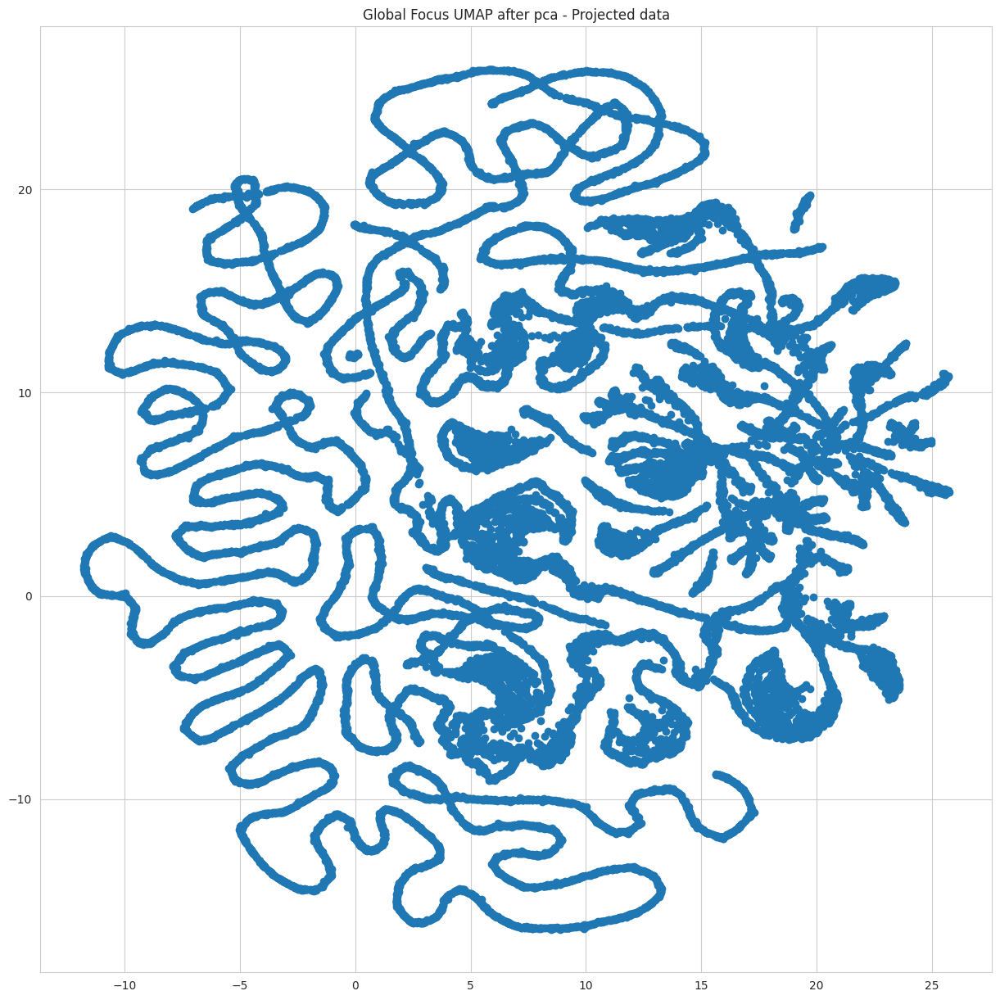

In [ ]:
fig = plt.figure(figsize =(15, 15))
plt.scatter(X_umap_pca_global[:, 0], X_umap_pca_global[:, 1],cmap=plt.cm.Spectral)
plt.title('Global Focus UMAP after pca - Projected data')

###UMAP for dimensionality reduction and clustering, visualize it with t-sne

###Clustering on PCA-Transformed Data:

When computational efficiency is a concern or when you believe the main variance (captured by the first few principal components) is sufficient to define the clusters. It's also useful when you want the 2D visualization to closely match the clustering results.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but PCA was fitted without feature names
  warnings.warn(


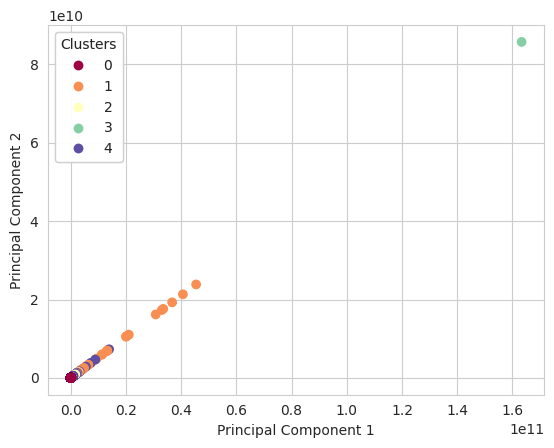

In [ ]:
#Lets redo K-means for the whole dataset!
pipeline_pca_kmeans  = Pipeline([
    ("scaler", StandardScaler()),
    ("pca", PCA(n_components =4)),#learned below from the sample pca cumsum
     ("cluster", KMeans(n_clusters=5,  n_init=10))])

#the fit method for KMeans during the pipeline process automatically assigns cluster labels to the samples,
#which is why we can directly access the labels_ attribute without explicitly calling predict.

pipeline_pca_kmeans.fit(X)
X_pca = pipeline_pca_kmeans.named_steps["pca"].transform(X)  # Get the PCA-transformed data
cluster_labels = pipeline_pca_kmeans.named_steps["cluster"].labels_  # Get the cluster labels


scatter = plt.scatter(
    X_pca[:,0],
    X_pca[:,1],
    c=cluster_labels,
    cmap=plt.cm.Spectral
)

# Create the legend
legend1 = plt.legend(*scatter.legend_elements(), title="Clusters")
plt.gca().add_artist(legend1)

# Set the x-label and display the plot
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.show()



Advantages: Faster than clustering in high-dimensional space. The 2D visualization directly represents how the clustering algorithm saw the data.

Disadvantages: You're clustering based on a reduced representation of the data, so some nuances from the original data might be lost.

This approach gives you a clearer visualization because you're clustering directly on the 2D PCA representation, ensuring that the clustering results align with the visualization.

The more discernible the clusters are in this visualization suggest that the primary patterns (captured by the top principal components) are sufficient to form distinct clusters.

**However, as already figured out before, the two main principal components are not enough to capture the main variance. The clusters on the pca-transformed data are non-informative. I will disregard this representation for my analysis**